In [1]:
import pandas as pd
import numpy as np
import time
pd.options.display.max_columns = None
import warnings
warnings.filterwarnings("ignore")
import math
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import make_classification
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve

C:\Users\Prince\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
C:\Users\Prince\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
RF_Data = pd.read_csv("D:\MSC thesis\MSc_Thesis_Sept_07.csv")

RF_Data 


,Response ID,Age,Sex(F=0),EmpS_Full time Worker,EmpS_Hybrid (Can work at home or at office),Emps_Others,EmpS_Part Time,EmpS_Student,EmpS_Work at home (Full-time),EmpS_Work at home (Part-time),Rapid pass/MRT pass for MRT (Y=1),last educational degree,H_size,EarningFM,Personal_Income,Family_income,Total Distance for access trip,Total Distance in km,"Trip 1 (MRT=1, others=0)","Trip 2 (MRT=1, others=0)","Trip 3 (MRT=1, others=0)",Work_cen,Family_incl,Ped_infra,Reliability,Safety,Inflation_conc,Walking_ben,Social_media,Social_influence,Age<35,Age<45,Age<55,Age<65,One_PV,Greater_Than_One_PV,Total Waiting Time,Fare_Current_total,TT_Current_total,distance_500m,Very Flexible,Somewhat Flexible,Fare_Bus_total,Fare_MRT_total,Ttmain_PV,TT_Bus_total,TT_MRT_total,TT_Bus_only,TT_MRT_only,Access_EgressFare,Access_EgressTT,Fare_Bus_only,Fare_MRT_only,Diff_Bus&MRT_Fare
0,197,18,1,0,0,0,0,0,0,0,0,2,2,1,13000,30000,0.000000,5.043623,0,0,0,-0.451608,-0.725676,0.478245,-1.737065,-0.291624,1.672757,1.630345,0.437112,-2.222020,0,0,0,0,0,0,10,10,50.0,1,1,0,10,25,35,20.0,33,53.0,13.000000,0,20.0,10,25,15
1,199,42,0,0,1,0,0,0,0,0,0,5,5,2,60000,85000,0.091267,1.716604,0,0,0,-0.054049,0.984073,-1.055357,-0.928082,-0.423511,1.847701,0.912369,0.118375,-2.704289,0,1,0,0,0,0,5,40,37.0,0,1,0,10,20,10,7.0,15,20.0,8.000000,0,7.0,10,20,10
2,201,80,1,0,0,1,0,0,0,0,0,6,3,2,75000,75000,0.000000,17.910027,0,0,0,2.049210,0.940523,-2.022888,-0.875135,-0.725145,0.002876,-1.188958,0.013361,-1.526232,0,0,0,1,1,0,10,0,187.0,0,0,0,44,90,65,7.0,52,150.0,45.000000,0,7.0,44,90,46
3,202,25,0,0,0,0,0,0,0,0,0,5,4,1,0,70000,0.360875,8.951812,0,1,0,0.021193,-3.762518,-0.179503,0.072344,0.236548,0.264723,0.145496,-0.698196,0.043354,1,0,0,0,0,0,2,80,29.0,1,1,0,51,80,25,9.0,29,68.0,20.000000,30,9.0,21,50,29
4,207,60,1,0,0,0,0,0,0,0,0,2,3,2,0,40000,0.000000,11.003098,0,0,0,0.709191,1.232340,-0.669094,-0.973727,-0.724442,-0.994102,-0.391162,-0.001444,0.088225,0,0,0,1,0,0,0,0,115.0,0,0,1,27,55,100,15.0,37,90.0,22.006196,0,15.0,27,55,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1508,2188,30,1,1,0,0,0,0,0,0,1,5,5,2,40000,100000,0.259270,5.744071,0,1,0,-0.448183,-0.592736,-0.188915,0.049667,1.338524,-0.269568,0.164610,-0.826745,1.001655,1,0,0,0,0,0,3,0,0.0,1,0,1,13,40,20,10.0,24,40.0,14.000000,0,10.0,13,40,27
1509,2189,32,1,1,0,0,0,0,0,0,0,5,3,1,35000,35000,0.307228,2.533318,0,1,0,-0.438650,-0.555581,-0.197556,0.308226,1.420457,-0.265372,0.169055,0.087474,0.639513,1,0,0,0,0,0,2,0,0.0,1,0,1,10,20,10,10.0,15,34.0,5.000000,0,10.0,10,20,10
1510,2190,23,0,0,0,0,1,0,0,0,0,3,4,2,600000,50000,0.261570,4.699713,0,0,0,-0.406695,-0.667241,-0.556242,0.437415,0.819750,-0.034848,0.118786,-0.799519,0.964275,0,0,0,0,0,0,5,0,0.0,0,0,1,20,22,35,10.0,19,40.0,9.000000,0,10.0,20,22,2
1511,2191,28,1,1,0,0,0,0,0,0,0,4,4,2,25000,80000,0.318739,4.937988,0,1,0,-0.386305,-0.622455,-0.401867,0.595897,1.084973,0.435823,0.056376,-0.991577,1.146660,1,0,0,0,0,0,4,0,0.0,1,0,1,11,30,25,10.0,20,28.0,10.000000,0,10.0,11,30,19


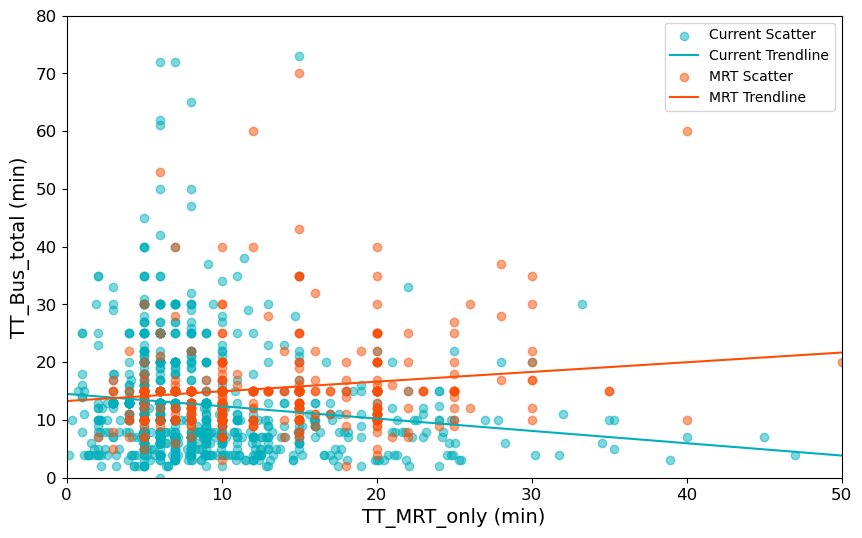

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming RF_Data is already loaded and available
# Define conditions for easier indexing
condition0 = RF_Data["Trip 2 (MRT=1, others=0)"] == 0
condition1 = RF_Data["Trip 2 (MRT=1, others=0)"] == 1

# Set plot parameters
plt.figure(figsize=(10, 6))
plt.xlabel("TT_MRT_only (min)", fontsize=14)
plt.ylabel("TT_Bus_total (min)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0, 80)
plt.xlim(0, 50)

# Plot scatter and trend lines
for condition, color, label in zip([condition0, condition1], ["#00AFBB", "#FC4E07"], ['Current', 'MRT']):
    subset = RF_Data[condition]
    plt.scatter(subset["TT_MRT_only"], subset["TT_Bus_total"], color=color, alpha=0.5, label=f'{label} Scatter')
    z = np.polyfit(subset["TT_MRT_only"], subset["TT_Bus_total"], 1)
    p = np.poly1d(z)
    # Generate x-values for trend line plotting
    x_values = np.linspace(0, 50, 1000)  # adjust 50 to your specific needs if necessary
    plt.plot(x_values, p(x_values), color=color, label=f'{label} Trendline')

    
# Add legend and save the figure
plt.legend(fontsize=10)
plt.savefig("TT_Bus_total VS TT_MRT_only Scatter plot with Trendline.png", dpi=1500)
plt.show()


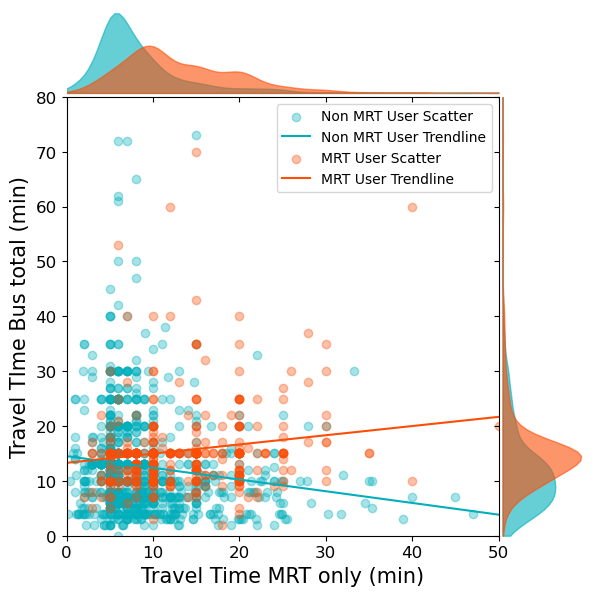

In [81]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde

# Assuming RF_Data is already loaded and available

# Define conditions for easier indexing
condition0 = RF_Data["Trip 2 (MRT=1, others=0)"] == 0
condition1 = RF_Data["Trip 2 (MRT=1, others=0)"] == 1

# Set up the main plot with marginal histograms
g = sns.JointGrid(x="TT_MRT_only", y="TT_Bus_total", data=RF_Data, space=0, ratio=5)
g = g.plot_joint(plt.scatter, color="none")  # dummy to set up grid

# Plot scatter and trend lines
colors = ["#00AFBB", "#FC4E07"]
labels = ['Non MRT User', 'MRT User']
for condition, color, label in zip([condition0, condition1], colors, labels):
    subset = RF_Data[condition]
    # Plot scatter
    g.ax_joint.scatter(subset["TT_MRT_only"], subset["TT_Bus_total"], color=color, alpha=0.35, label=f'{label} Scatter')
    # Plot trendline
    z = np.polyfit(subset["TT_MRT_only"], subset["TT_Bus_total"], 1)
    p = np.poly1d(z)
    x_values = np.linspace(0, 50, 100)
    g.ax_joint.plot(x_values, p(x_values), color=color, label=f'{label} Trendline')

    # Calculate and plot marginal densities
    x = np.linspace(0, 50, 100)
    y = np.linspace(0, 80, 100)
    
    # Density for x-axis
    density_x = gaussian_kde(subset["TT_MRT_only"])
    g.ax_marg_x.fill_between(x, 0, density_x(x), color=color, alpha=0.6)
    
    # Density for y-axis
    density_y = gaussian_kde(subset["TT_Bus_total"])
    g.ax_marg_y.fill_betweenx(y, 0, density_y(y), color=color, alpha=0.6)

# Set plot parameters
g.ax_joint.set_xlim(0, 50)
g.ax_joint.set_ylim(0, 80)
g.ax_joint.set_xlabel("Travel Time MRT only (min)", fontsize=15)
g.ax_joint.set_ylabel("Travel TIme Bus total (min)", fontsize=15)
g.ax_joint.tick_params(axis='both', labelsize=12)

# Add legend to the joint plot
g.ax_joint.legend(fontsize=10)

# Save the figure
plt.savefig("Combined_Plot_with_Density_Margins.png", dpi=300)
plt.show()


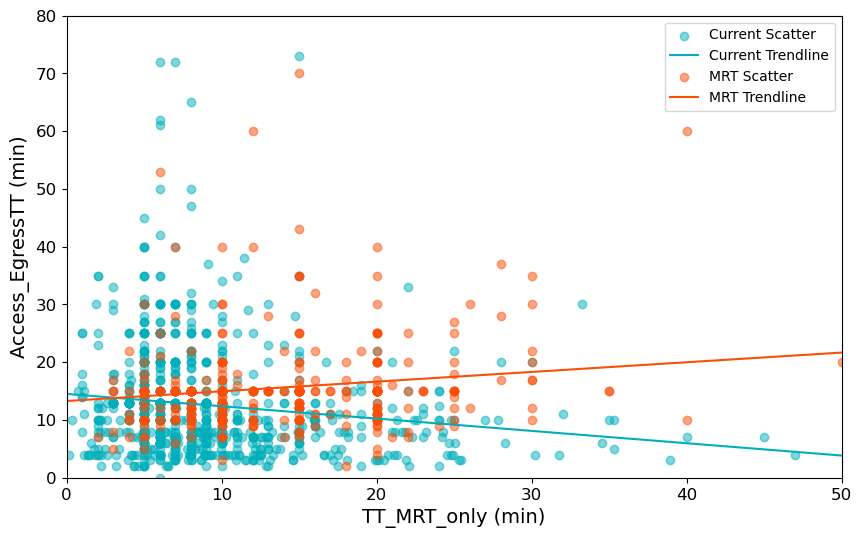

In [5]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming RF_Data is already loaded and available
# Define conditions for easier indexing
condition0 = RF_Data["Trip 2 (MRT=1, others=0)"] == 0
condition1 = RF_Data["Trip 2 (MRT=1, others=0)"] == 1

# Set plot parameters
plt.figure(figsize=(10, 6))
plt.xlabel("TT_MRT_only (min)", fontsize=14)
plt.ylabel("Access_EgressTT (min)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0, 80)
plt.xlim(0, 50)

# Plot scatter and trend lines
for condition, color, label in zip([condition0, condition1], ["#00AFBB", "#FC4E07"], ['Current', 'MRT']):
    subset = RF_Data[condition]
    plt.scatter(subset["TT_MRT_only"], subset["Access_EgressTT"], color=color, alpha=0.5, label=f'{label} Scatter')
    z = np.polyfit(subset["TT_MRT_only"], subset["Access_EgressTT"], 1)
    p = np.poly1d(z)
    # Generate x-values for trend line plotting
    x_values = np.linspace(0, 50, 1000)  # adjust 50 to your specific needs if necessary
    plt.plot(x_values, p(x_values), color=color, label=f'{label} Trendline')

# Add legend and save the figure
plt.legend(fontsize=10)
plt.savefig("Access_EgressTT (min) VS TT_MRT_only Scatter plot with Trendline.png", dpi=1500)
plt.show()


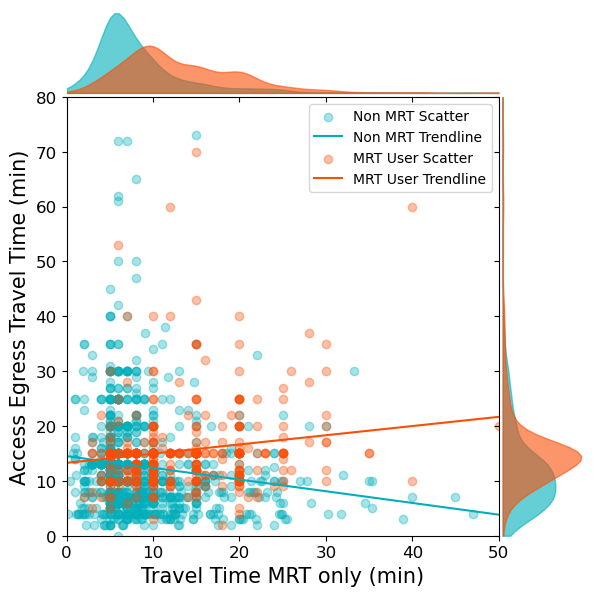

In [82]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde

# Assuming RF_Data is already loaded and available

# Define conditions for easier indexing
condition0 = RF_Data["Trip 2 (MRT=1, others=0)"] == 0
condition1 = RF_Data["Trip 2 (MRT=1, others=0)"] == 1

# Set up the main plot with marginal histograms
g = sns.JointGrid(x="TT_MRT_only", y="Access_EgressTT", data=RF_Data, space=0, ratio=5)
g = g.plot_joint(plt.scatter, color="none")  # dummy to set up grid

# Plot scatter and trend lines
colors = ["#00AFBB", "#FC4E07"]
labels = ['Non MRT', 'MRT User']
for condition, color, label in zip([condition0, condition1], colors, labels):
    subset = RF_Data[condition]
    # Plot scatter
    g.ax_joint.scatter(subset["TT_MRT_only"], subset["Access_EgressTT"], color=color, alpha=0.35, label=f'{label} Scatter')
    # Plot trendline
    z = np.polyfit(subset["TT_MRT_only"], subset["Access_EgressTT"], 1)
    p = np.poly1d(z)
    x_values = np.linspace(0, 50, 100)
    g.ax_joint.plot(x_values, p(x_values), color=color, label=f'{label} Trendline')

    # Calculate and plot marginal densities
    x = np.linspace(0, 50, 100)
    y = np.linspace(0, 80, 100)
    
    # Density for x-axis
    density_x = gaussian_kde(subset["TT_MRT_only"])
    g.ax_marg_x.fill_between(x, 0, density_x(x), color=color, alpha=0.6)
    
    # Density for y-axis
    density_y = gaussian_kde(subset["Access_EgressTT"])
    g.ax_marg_y.fill_betweenx(y, 0, density_y(y), color=color, alpha=0.6)

# Set plot parameters
g.ax_joint.set_xlim(0, 50)
g.ax_joint.set_ylim(0, 80)
g.ax_joint.set_xlabel("Travel Time MRT only (min)", fontsize=15)
g.ax_joint.set_ylabel("Access Egress Travel Time (min)", fontsize=15)
g.ax_joint.tick_params(axis='both', labelsize=12)

# Add legend to the joint plot
g.ax_joint.legend(fontsize=10)

# Save the figure
plt.savefig("Combined_Plot_with_Density_Margins.png", dpi=1500)
plt.show()


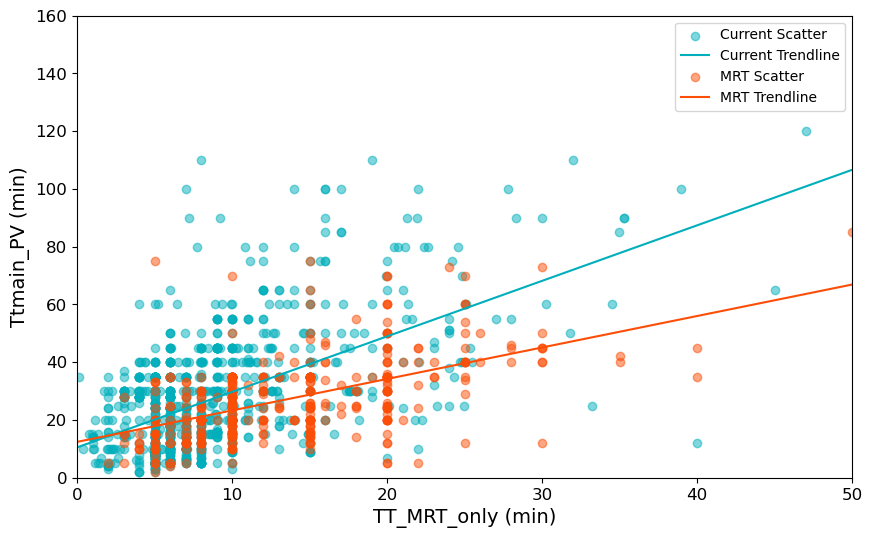

In [7]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming RF_Data is already loaded and available
# Define conditions for easier indexing
condition0 = RF_Data["Trip 2 (MRT=1, others=0)"] == 0
condition1 = RF_Data["Trip 2 (MRT=1, others=0)"] == 1

# Set plot parameters
plt.figure(figsize=(10, 6))
plt.xlabel("TT_MRT_only (min)", fontsize=14)
plt.ylabel("Ttmain_PV (min)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0, 160)
plt.xlim(0, 50)

# Plot scatter and trend lines
for condition, color, label in zip([condition0, condition1], ["#00AFBB", "#FC4E07"], ['Current', 'MRT']):
    subset = RF_Data[condition]
    plt.scatter(subset["TT_MRT_only"], subset["Ttmain_PV"], color=color, alpha=0.5, label=f'{label} Scatter')
    z = np.polyfit(subset["TT_MRT_only"], subset["Ttmain_PV"], 1)
    p = np.poly1d(z)
    # Generate x-values for trend line plotting
    x_values = np.linspace(0, 50, 1000)  # adjust 50 to your specific needs if necessary
    plt.plot(x_values, p(x_values), color=color, label=f'{label} Trendline')

# Add legend and save the figure
plt.legend(fontsize=10)
plt.savefig("TT_Bus_total VS TT_MRT_only Scatter plot with Trendline.png", dpi=1500)
plt.show()


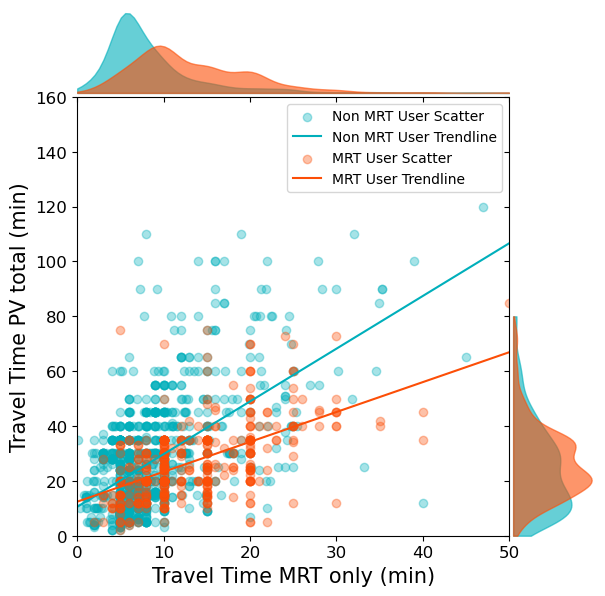

In [83]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde

# Assuming RF_Data is already loaded and available

# Define conditions for easier indexing
condition0 = RF_Data["Trip 2 (MRT=1, others=0)"] == 0
condition1 = RF_Data["Trip 2 (MRT=1, others=0)"] == 1

# Set up the main plot with marginal histograms
g = sns.JointGrid(x="TT_MRT_only", y="Ttmain_PV", data=RF_Data, space=0, ratio=5)
g = g.plot_joint(plt.scatter, color="none")  # dummy to set up grid

# Plot scatter and trend lines
colors = ["#00AFBB", "#FC4E07"]
labels = ['Non MRT User', 'MRT User']
for condition, color, label in zip([condition0, condition1], colors, labels):
    subset = RF_Data[condition]
    # Plot scatter
    g.ax_joint.scatter(subset["TT_MRT_only"], subset["Ttmain_PV"], color=color, alpha=0.35, label=f'{label} Scatter')
    # Plot trendline
    z = np.polyfit(subset["TT_MRT_only"], subset["Ttmain_PV"], 1)
    p = np.poly1d(z)
    x_values = np.linspace(0, 50, 100)
    g.ax_joint.plot(x_values, p(x_values), color=color, label=f'{label} Trendline')

    # Calculate and plot marginal densities
    x = np.linspace(0, 50, 100)
    y = np.linspace(0, 80, 100)
    
    # Density for x-axis
    density_x = gaussian_kde(subset["TT_MRT_only"])
    g.ax_marg_x.fill_between(x, 0, density_x(x), color=color, alpha=0.6)
    
    # Density for y-axis
    density_y = gaussian_kde(subset["Ttmain_PV"])
    g.ax_marg_y.fill_betweenx(y, 0, density_y(y), color=color, alpha=0.6)

# Set plot parameters
g.ax_joint.set_xlim(0, 50)
g.ax_joint.set_ylim(0, 160)
g.ax_joint.set_xlabel("Travel Time MRT only (min)", fontsize=15)
g.ax_joint.set_ylabel("Travel Time PV total (min)", fontsize=15)
g.ax_joint.tick_params(axis='both', labelsize=12)

# Add legend to the joint plot
g.ax_joint.legend(fontsize=10)

# Save the figure
plt.savefig("Combined_Plot_with_Density_Margins.png", dpi=1500)
plt.show()


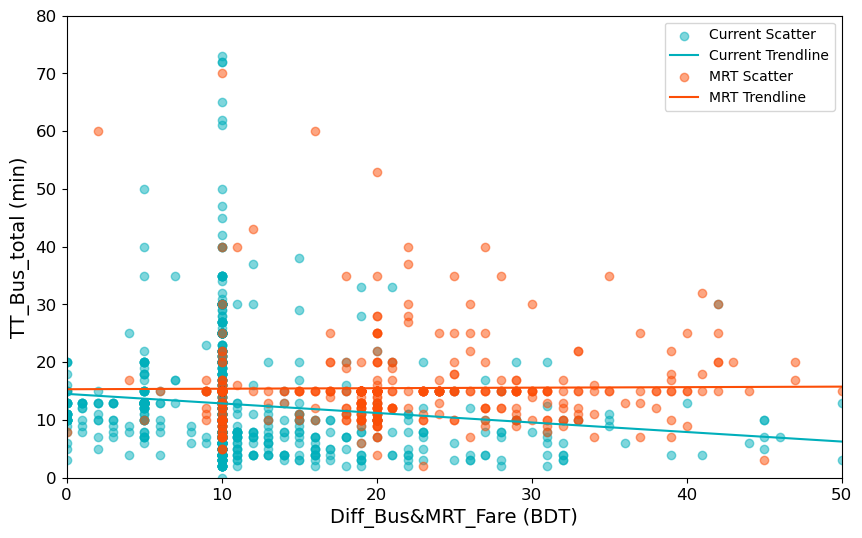

In [9]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming RF_Data is already loaded and available
# Define conditions for easier indexing
condition0 = RF_Data["Trip 2 (MRT=1, others=0)"] == 0
condition1 = RF_Data["Trip 2 (MRT=1, others=0)"] == 1

# Set plot parameters
plt.figure(figsize=(10, 6))
plt.xlabel("Diff_Bus&MRT_Fare (BDT)", fontsize=14)
plt.ylabel("TT_Bus_total (min)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0, 80)
plt.xlim(0, 50)

# Plot scatter and trend lines
for condition, color, label in zip([condition0, condition1], ["#00AFBB", "#FC4E07"], ['Current', 'MRT']):
    subset = RF_Data[condition]
    plt.scatter(subset["Diff_Bus&MRT_Fare"], subset["TT_Bus_total"], color=color, alpha=0.5, label=f'{label} Scatter')
    z = np.polyfit(subset["Diff_Bus&MRT_Fare"], subset["TT_Bus_total"], 1)
    p = np.poly1d(z)
    # Generate x-values for trend line plotting
    x_values = np.linspace(0, 50, 1000)  # adjust 50 to your specific needs if necessary
    plt.plot(x_values, p(x_values), color=color, label=f'{label} Trendline')

# Add legend and save the figure
plt.legend(fontsize=10)
plt.savefig("TT_Bus_total VS TT_MRT_only Scatter plot with Trendline.png", dpi=1500)
plt.show()


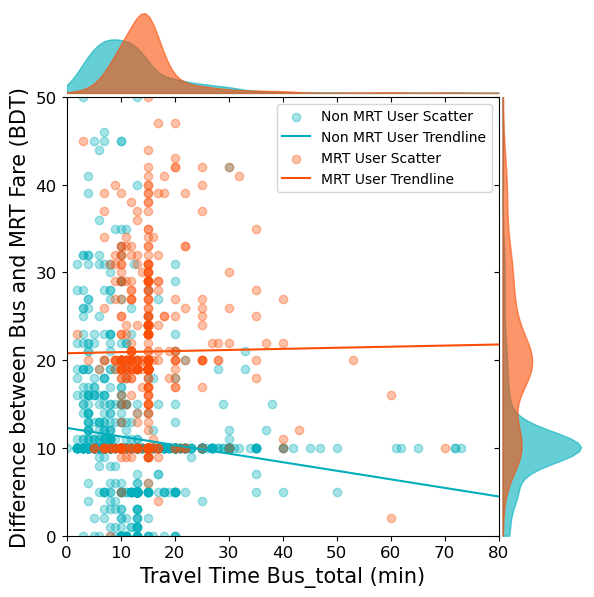

In [88]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde

# Assuming RF_Data is already loaded and available

# Define conditions for easier indexing
condition0 = RF_Data["Trip 2 (MRT=1, others=0)"] == 0
condition1 = RF_Data["Trip 2 (MRT=1, others=0)"] == 1

# Set up the main plot with marginal histograms (x and y variables are now swapped)
g = sns.JointGrid(x="TT_Bus_total", y="Diff_Bus&MRT_Fare", data=RF_Data, space=0, ratio=5)
g = g.plot_joint(plt.scatter, color="none")  # dummy to set up grid

# Plot scatter and trend lines (x and y are swapped)
colors = ["#00AFBB", "#FC4E07"]
labels = ['Non MRT User', 'MRT User']
for condition, color, label in zip([condition0, condition1], colors, labels):
    subset = RF_Data[condition]
    # Plot scatter with swapped x and y
    g.ax_joint.scatter(subset["TT_Bus_total"], subset["Diff_Bus&MRT_Fare"], color=color, alpha=0.35, label=f'{label} Scatter')
    
    # Plot trendline with swapped x and y
    z = np.polyfit(subset["TT_Bus_total"], subset["Diff_Bus&MRT_Fare"], 1)
    p = np.poly1d(z)
    x_values = np.linspace(0, 80, 100)  # Adjust x-values range based on new x-axis (TT_Bus_total)
    g.ax_joint.plot(x_values, p(x_values), color=color, label=f'{label} Trendline')

    # Calculate and plot marginal densities (x and y are swapped)
    x = np.linspace(0, 80, 100)  # Adjusted x-range (TT_Bus_total)
    y = np.linspace(0, 50, 100)  # Adjusted y-range (Diff_Bus&MRT_Fare)
    
    # Density for x-axis (TT_Bus_total)
    density_x = gaussian_kde(subset["TT_Bus_total"])
    g.ax_marg_x.fill_between(x, 0, density_x(x), color=color, alpha=0.6)
    
    # Density for y-axis (Diff_Bus&MRT_Fare)
    density_y = gaussian_kde(subset["Diff_Bus&MRT_Fare"])
    g.ax_marg_y.fill_betweenx(y, 0, density_y(y), color=color, alpha=0.6)

# Set plot parameters (x and y labels are swapped)
g.ax_joint.set_xlim(0, 80)
g.ax_joint.set_ylim(0, 50)
g.ax_joint.set_xlabel("Travel Time Bus_total (min)", fontsize=15)  # Label for x-axis
g.ax_joint.set_ylabel("Difference between Bus and MRT Fare (BDT)", fontsize=15)  # Label for y-axis
g.ax_joint.tick_params(axis='both', labelsize=12)

# Add legend to the joint plot
g.ax_joint.legend(fontsize=10)

# Save the figure
plt.savefig("Swapped_X_Y_Plot_with_Density_Margins.png", dpi=1500)
plt.show()


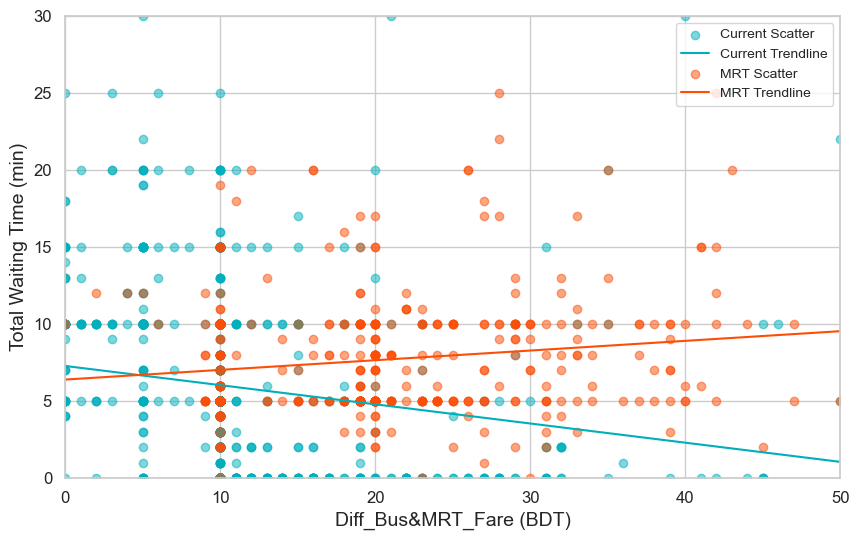

In [69]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming RF_Data is already loaded and available
# Define conditions for easier indexing
condition0 = RF_Data["Trip 2 (MRT=1, others=0)"] == 0
condition1 = RF_Data["Trip 2 (MRT=1, others=0)"] == 1

# Set plot parameters
plt.figure(figsize=(10, 6))
plt.xlabel("Diff_Bus&MRT_Fare (BDT)", fontsize=14)
plt.ylabel("Total Waiting Time (min)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0, 30)
plt.xlim(0, 50)

# Plot scatter and trend lines
for condition, color, label in zip([condition0, condition1], ["#00AFBB", "#FC4E07"], ['Current', 'MRT']):
    subset = RF_Data[condition]
    plt.scatter(subset["Diff_Bus&MRT_Fare"], subset["Total Waiting Time"], color=color, alpha=0.5, label=f'{label} Scatter')
    z = np.polyfit(subset["Diff_Bus&MRT_Fare"], subset["Total Waiting Time"], 1)
    p = np.poly1d(z)
    # Generate x-values for trend line plotting
    x_values = np.linspace(0, 50, 1000)  # adjust 50 to your specific needs if necessary
    plt.plot(x_values, p(x_values), color=color, label=f'{label} Trendline')

# Add legend and save the figure
plt.legend(fontsize=10)
plt.savefig("TT_Bus_total VS TT_MRT_only Scatter plot with Trendline.png", dpi=1500)
plt.show()


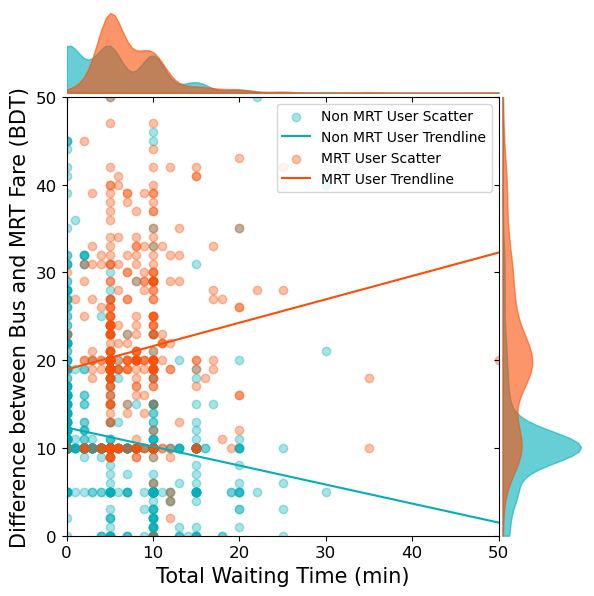

In [89]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde

# Assuming RF_Data is already loaded and available

# Define conditions for easier indexing
condition0 = RF_Data["Trip 2 (MRT=1, others=0)"] == 0
condition1 = RF_Data["Trip 2 (MRT=1, others=0)"] == 1

# Set up the main plot with marginal histograms (x and y variables swapped)
g = sns.JointGrid(x="Total Waiting Time", y="Diff_Bus&MRT_Fare", data=RF_Data, space=0, ratio=5)
g = g.plot_joint(plt.scatter, color="none")  # dummy to set up grid

# Plot scatter and trend lines (x and y are swapped)
colors = ["#00AFBB", "#FC4E07"]
labels = ['Non MRT User', 'MRT User']
for condition, color, label in zip([condition0, condition1], colors, labels):
    subset = RF_Data[condition]
    
    # Plot scatter with swapped x and y
    g.ax_joint.scatter(subset["Total Waiting Time"], subset["Diff_Bus&MRT_Fare"], color=color, alpha=0.35, label=f'{label} Scatter')
    
    # Plot trendline with swapped x and y
    z = np.polyfit(subset["Total Waiting Time"], subset["Diff_Bus&MRT_Fare"], 1)
    p = np.poly1d(z)
    x_values = np.linspace(0, 50, 100)  # Adjust x-values range based on new x-axis (Total Waiting Time)
    g.ax_joint.plot(x_values, p(x_values), color=color, label=f'{label} Trendline')

    # Calculate and plot marginal densities (x and y are swapped)
    x = np.linspace(0, 50, 100)  # Adjusted x-range (Total Waiting Time)
    y = np.linspace(0, 50, 100)  # Adjusted y-range (Diff_Bus&MRT_Fare)
    
    # Density for x-axis (Total Waiting Time)
    density_x = gaussian_kde(subset["Total Waiting Time"])
    g.ax_marg_x.fill_between(x, 0, density_x(x), color=color, alpha=0.6)
    
    # Density for y-axis (Diff_Bus&MRT_Fare)
    density_y = gaussian_kde(subset["Diff_Bus&MRT_Fare"])
    g.ax_marg_y.fill_betweenx(y, 0, density_y(y), color=color, alpha=0.6)

# Set plot parameters (x and y labels swapped)
g.ax_joint.set_xlim(0, 50)
g.ax_joint.set_ylim(0, 50)
g.ax_joint.set_xlabel("Total Waiting Time (min)", fontsize=15)  # Label for x-axis
g.ax_joint.set_ylabel("Difference between Bus and MRT Fare (BDT)", fontsize=15)  # Label for y-axis
g.ax_joint.tick_params(axis='both', labelsize=12)

# Add legend to the joint plot
g.ax_joint.legend(fontsize=10)

# Save the figure
plt.savefig("Swapped_X_Y_Plot_with_Density_Margins.png", dpi=1500)
plt.show()


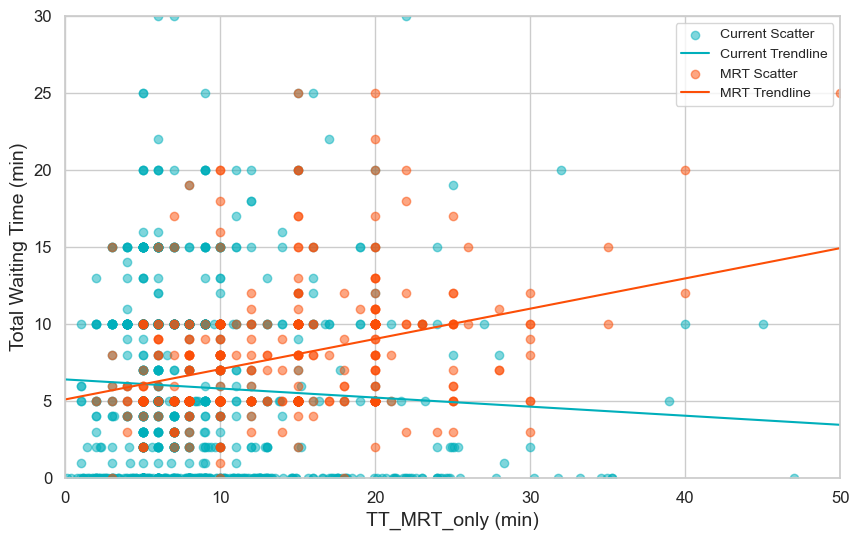

In [71]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming RF_Data is already loaded and available
# Define conditions for easier indexing
condition0 = RF_Data["Trip 2 (MRT=1, others=0)"] == 0
condition1 = RF_Data["Trip 2 (MRT=1, others=0)"] == 1

# Set plot parameters
plt.figure(figsize=(10, 6))
plt.xlabel("TT_MRT_only (min)", fontsize=14)
plt.ylabel("Total Waiting Time (min)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0, 30)
plt.xlim(0, 50)

# Plot scatter and trend lines
for condition, color, label in zip([condition0, condition1], ["#00AFBB", "#FC4E07"], ['Current', 'MRT']):
    subset = RF_Data[condition]
    plt.scatter(subset["TT_MRT_only"], subset["Total Waiting Time"], color=color, alpha=0.5, label=f'{label} Scatter')
    z = np.polyfit(subset["TT_MRT_only"], subset["Total Waiting Time"], 1)
    p = np.poly1d(z)
    # Generate x-values for trend line plotting
    x_values = np.linspace(0, 50, 1000)  # adjust 50 to your specific needs if necessary
    plt.plot(x_values, p(x_values), color=color, label=f'{label} Trendline')

# Add legend and save the figure
plt.legend(fontsize=10)
plt.savefig("TT_Bus_total VS TT_MRT_only Scatter plot with Trendline.png", dpi=1500)
plt.show()


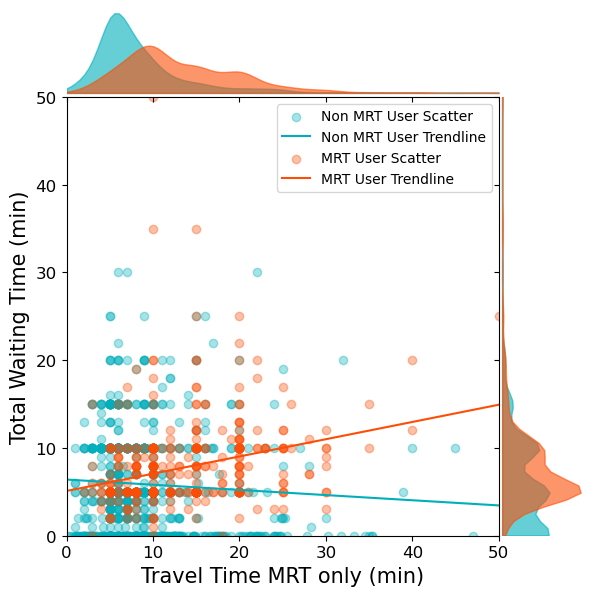

In [86]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde

# Assuming RF_Data is already loaded and available

# Define conditions for easier indexing
condition0 = RF_Data["Trip 2 (MRT=1, others=0)"] == 0
condition1 = RF_Data["Trip 2 (MRT=1, others=0)"] == 1

# Set up the main plot with marginal histograms
g = sns.JointGrid(x="TT_MRT_only", y="Total Waiting Time", data=RF_Data, space=0, ratio=5)
g = g.plot_joint(plt.scatter, color="none")  # dummy to set up grid

# Plot scatter and trend lines
colors = ["#00AFBB", "#FC4E07"]
labels = ['Non MRT User', 'MRT User']
for condition, color, label in zip([condition0, condition1], colors, labels):
    subset = RF_Data[condition]
    # Plot scatter
    g.ax_joint.scatter(subset["TT_MRT_only"], subset["Total Waiting Time"], color=color, alpha=0.35, label=f'{label} Scatter')
    # Plot trendline
    z = np.polyfit(subset["TT_MRT_only"], subset["Total Waiting Time"], 1)
    p = np.poly1d(z)
    x_values = np.linspace(0, 50, 100)
    g.ax_joint.plot(x_values, p(x_values), color=color, label=f'{label} Trendline')

    # Calculate and plot marginal densities
    x = np.linspace(0, 50, 100)
    y = np.linspace(0, 80, 100)
    
    # Density for x-axis
    density_x = gaussian_kde(subset["TT_MRT_only"])
    g.ax_marg_x.fill_between(x, 0, density_x(x), color=color, alpha=0.6)
    
    # Density for y-axis
    density_y = gaussian_kde(subset["Total Waiting Time"])
    g.ax_marg_y.fill_betweenx(y, 0, density_y(y), color=color, alpha=0.6)

# Set plot parameters
g.ax_joint.set_xlim(0, 50)
g.ax_joint.set_ylim(0, 50)
g.ax_joint.set_xlabel("Travel Time MRT only (min)", fontsize=15)
g.ax_joint.set_ylabel("Total Waiting Time (min)", fontsize=15)
g.ax_joint.tick_params(axis='both', labelsize=12)

# Add legend to the joint plot
g.ax_joint.legend(fontsize=10)

# Save the figure
plt.savefig("Combined_Plot_with_Density_Margins.png", dpi=1500)
plt.show()


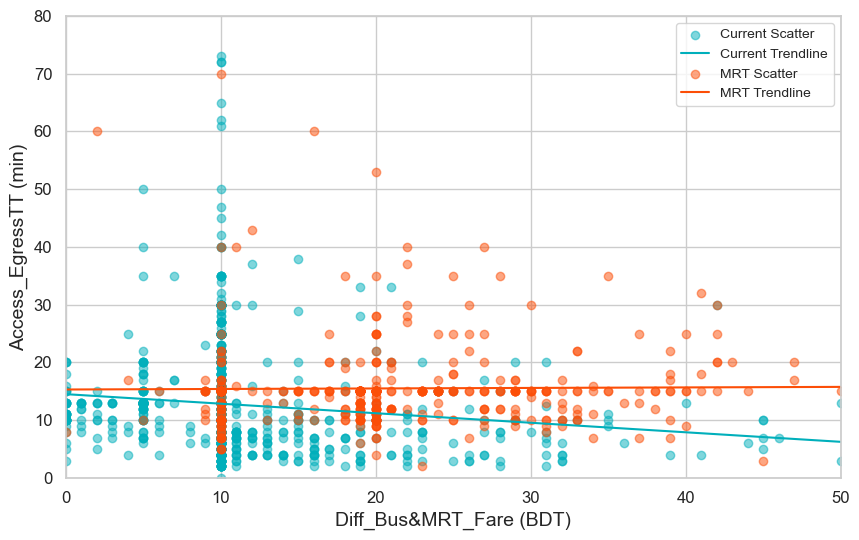

In [72]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming RF_Data is already loaded and available
# Define conditions for easier indexing
condition0 = RF_Data["Trip 2 (MRT=1, others=0)"] == 0
condition1 = RF_Data["Trip 2 (MRT=1, others=0)"] == 1

# Set plot parameters
plt.figure(figsize=(10, 6))
plt.xlabel("Diff_Bus&MRT_Fare (BDT)", fontsize=14)
plt.ylabel("Access_EgressTT (min)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0, 80)
plt.xlim(0, 50)

# Plot scatter and trend lines
for condition, color, label in zip([condition0, condition1], ["#00AFBB", "#FC4E07"], ['Current', 'MRT']):
    subset = RF_Data[condition]
    plt.scatter(subset["Diff_Bus&MRT_Fare"], subset["Access_EgressTT"], color=color, alpha=0.5, label=f'{label} Scatter')
    z = np.polyfit(subset["Diff_Bus&MRT_Fare"], subset["Access_EgressTT"], 1)
    p = np.poly1d(z)
    # Generate x-values for trend line plotting
    x_values = np.linspace(0, 50, 1000)  # adjust 50 to your specific needs if necessary
    plt.plot(x_values, p(x_values), color=color, label=f'{label} Trendline')

# Add legend and save the figure
plt.legend(fontsize=10)
plt.savefig("TT_Bus_total VS TT_MRT_only Scatter plot with Trendline.png", dpi=1500)
plt.show()


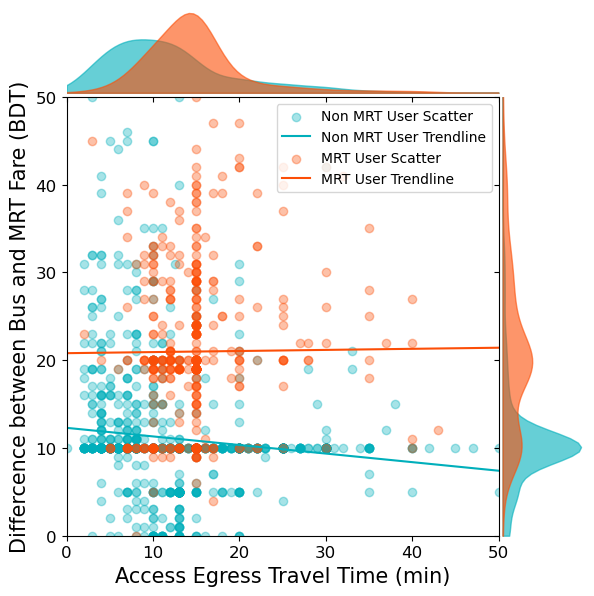

In [87]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde

# Assuming RF_Data is already loaded and available

# Define conditions for easier indexing
condition0 = RF_Data["Trip 2 (MRT=1, others=0)"] == 0
condition1 = RF_Data["Trip 2 (MRT=1, others=0)"] == 1

# Set up the main plot with marginal histograms (x and y variables are swapped)
g = sns.JointGrid(x="Access_EgressTT", y="Diff_Bus&MRT_Fare", data=RF_Data, space=0, ratio=5)
g = g.plot_joint(plt.scatter, color="none")  # dummy to set up grid

# Plot scatter and trend lines (x and y are swapped)
colors = ["#00AFBB", "#FC4E07"]
labels = ['Non MRT User', 'MRT User']
for condition, color, label in zip([condition0, condition1], colors, labels):
    subset = RF_Data[condition]
    
    # Plot scatter with swapped x and y
    g.ax_joint.scatter(subset["Access_EgressTT"], subset["Diff_Bus&MRT_Fare"], color=color, alpha=0.35, label=f'{label} Scatter')
    
    # Plot trendline with swapped x and y
    z = np.polyfit(subset["Access_EgressTT"], subset["Diff_Bus&MRT_Fare"], 1)
    p = np.poly1d(z)
    x_values = np.linspace(0, 50, 100)  # Adjust x-values range based on new x-axis (Access_EgressTT)
    g.ax_joint.plot(x_values, p(x_values), color=color, label=f'{label} Trendline')

    # Calculate and plot marginal densities (x and y are swapped)
    x = np.linspace(0, 50, 100)  # Adjusted x-range (Access_EgressTT)
    y = np.linspace(0, 50, 100)  # Adjusted y-range (Diff_Bus&MRT_Fare)
    
    # Density for x-axis (Access_EgressTT)
    density_x = gaussian_kde(subset["Access_EgressTT"])
    g.ax_marg_x.fill_between(x, 0, density_x(x), color=color, alpha=0.6)
    
    # Density for y-axis (Diff_Bus&MRT_Fare)
    density_y = gaussian_kde(subset["Diff_Bus&MRT_Fare"])
    g.ax_marg_y.fill_betweenx(y, 0, density_y(y), color=color, alpha=0.6)

# Set plot parameters (x and y labels swapped)
g.ax_joint.set_xlim(0, 50)
g.ax_joint.set_ylim(0, 50)
g.ax_joint.set_xlabel("Access Egress Travel Time (min)", fontsize=15)  # Label for x-axis
g.ax_joint.set_ylabel("Differcence between Bus and MRT Fare (BDT)", fontsize=15)  # Label for y-axis
g.ax_joint.tick_params(axis='both', labelsize=12)

# Add legend to the joint plot
g.ax_joint.legend(fontsize=10)

# Save the figure
plt.savefig("Swapped_X_Y_Plot_with_Density_Margins.png", dpi=1500)
plt.show()


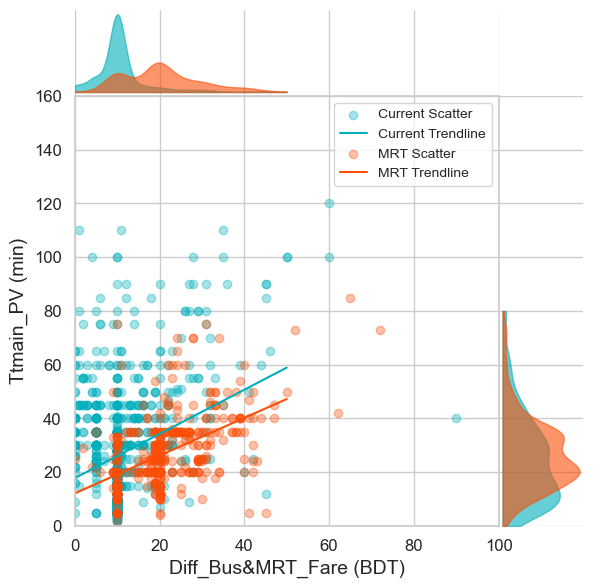

In [97]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde

# Assuming RF_Data is already loaded and available

# Define conditions for easier indexing
condition0 = RF_Data["Trip 2 (MRT=1, others=0)"] == 0
condition1 = RF_Data["Trip 2 (MRT=1, others=0)"] == 1

# Set up the main plot with marginal histograms
g = sns.JointGrid(x="Diff_Bus&MRT_Fare", y="Ttmain_PV", data=RF_Data, space=0, ratio=5)
g = g.plot_joint(plt.scatter, color="none")  # dummy to set up grid

# Plot scatter and trend lines
colors = ["#00AFBB", "#FC4E07"]
labels = ['Current', 'MRT']
for condition, color, label in zip([condition0, condition1], colors, labels):
    subset = RF_Data[condition]
    # Plot scatter
    g.ax_joint.scatter(subset["Diff_Bus&MRT_Fare"], subset["Ttmain_PV"], color=color, alpha=0.35, label=f'{label} Scatter')
    # Plot trendline
    z = np.polyfit(subset["Diff_Bus&MRT_Fare"], subset["Ttmain_PV"], 1)
    p = np.poly1d(z)
    x_values = np.linspace(0, 50, 100)
    g.ax_joint.plot(x_values, p(x_values), color=color, label=f'{label} Trendline')

    # Calculate and plot marginal densities
    x = np.linspace(0, 50, 100)
    y = np.linspace(0, 80, 100)
    
    # Density for x-axis
    density_x = gaussian_kde(subset["Diff_Bus&MRT_Fare"])
    g.ax_marg_x.fill_between(x, 0, density_x(x), color=color, alpha=0.6)
    
    # Density for y-axis
    density_y = gaussian_kde(subset["Ttmain_PV"])
    g.ax_marg_y.fill_betweenx(y, 0, density_y(y), color=color, alpha=0.6)

# Set plot parameters
g.ax_joint.set_xlim(0, 100)
g.ax_joint.set_ylim(0, 160)
g.ax_joint.set_xlabel("Diff_Bus&MRT_Fare (BDT)", fontsize=14)
g.ax_joint.set_ylabel("Ttmain_PV (min)", fontsize=14)
g.ax_joint.tick_params(axis='both', labelsize=12)

# Add legend to the joint plot
g.ax_joint.legend(fontsize=10)

# Save the figure
plt.savefig("Combined_Plot_with_Density_Margins.png", dpi=1500)
plt.show()


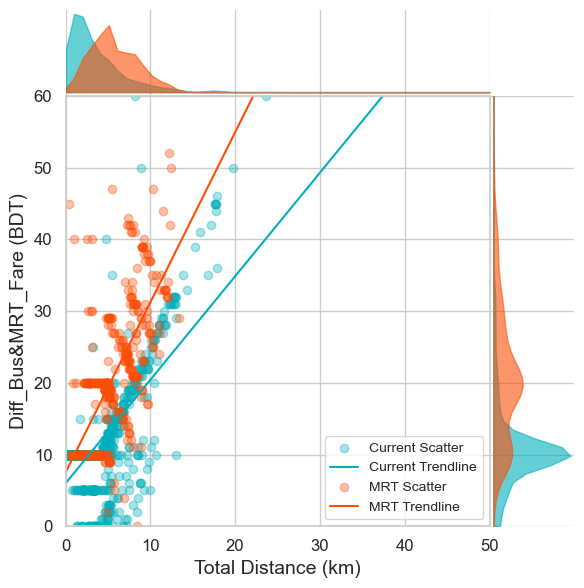

In [177]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde

# Assuming RF_Data is already loaded and available

# Define conditions for easier indexing
condition0 = RF_Data["Trip 2 (MRT=1, others=0)"] == 0
condition1 = RF_Data["Trip 2 (MRT=1, others=0)"] == 1

# Set up the main plot with marginal histograms (swap x and y axes)
g = sns.JointGrid(x="Total Distance in km", y="Diff_Bus&MRT_Fare", data=RF_Data, space=0, ratio=5)
g = g.plot_joint(plt.scatter, color="none")  # dummy to set up grid

# Plot scatter and trend lines (swap x and y axes)
colors = ["#00AFBB", "#FC4E07"]
labels = ['Current', 'MRT']
for condition, color, label in zip([condition0, condition1], colors, labels):
    subset = RF_Data[condition]
    
    # Plot scatter (x and y axes swapped)
    g.ax_joint.scatter(subset["Total Distance in km"], subset["Diff_Bus&MRT_Fare"], color=color, alpha=0.35, label=f'{label} Scatter')
    
    # Plot trendline (swap x and y for polyfit and plotting)
    z = np.polyfit(subset["Total Distance in km"], subset["Diff_Bus&MRT_Fare"], 1)
    p = np.poly1d(z)
    x_values = np.linspace(0, 50, 100)  # Adjust x-values range based on new x-axis (Total Distance)
    g.ax_joint.plot(x_values, p(x_values), color=color, label=f'{label} Trendline')

    # Calculate and plot marginal densities (for the new x and y axes)
    x = np.linspace(0, 50)  # Adjusted x-range (Total Distance)
    y = np.linspace(0, 60)  # Adjusted y-range (Diff_Bus&MRT_Fare)
    
    # Density for x-axis (Total Distance)
    density_x = gaussian_kde(subset["Total Distance in km"])
    g.ax_marg_x.fill_between(x, 0, density_x(x), color=color, alpha=0.6)
    
    # Density for y-axis (Diff_Bus&MRT_Fare)
    density_y = gaussian_kde(subset["Diff_Bus&MRT_Fare"])
    g.ax_marg_y.fill_betweenx(y, 0, density_y(y), color=color, alpha=0.6)

# Set plot parameters (adjust labels for the swapped axes)
g.ax_joint.set_xlim(0, 50)
g.ax_joint.set_ylim(0, 60)
g.ax_joint.set_xlabel("Total Distance (km)", fontsize=14)
g.ax_joint.set_ylabel("Diff_Bus&MRT_Fare (BDT)", fontsize=14)
g.ax_joint.tick_params(axis='both', labelsize=12)

# Add legend to the joint plot
g.ax_joint.legend(fontsize=10)

# Save the figure
plt.savefig("Swapped_X_Y_Plot_with_Density_Margins.png", dpi=1500)
plt.show()


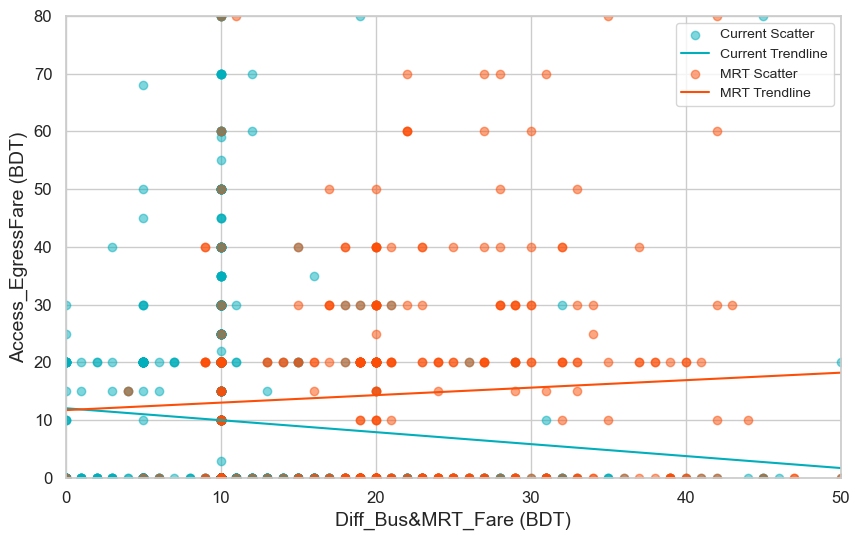

In [73]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming RF_Data is already loaded and available
# Define conditions for easier indexing
condition0 = RF_Data["Trip 2 (MRT=1, others=0)"] == 0
condition1 = RF_Data["Trip 2 (MRT=1, others=0)"] == 1

# Set plot parameters
plt.figure(figsize=(10, 6))
plt.xlabel("Diff_Bus&MRT_Fare (BDT)", fontsize=14)
plt.ylabel("Access_EgressFare (BDT)", fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.ylim(0, 80)
plt.xlim(0, 50)

# Plot scatter and trend lines
for condition, color, label in zip([condition0, condition1], ["#00AFBB", "#FC4E07"], ['Current', 'MRT']):
    subset = RF_Data[condition]
    plt.scatter(subset["Diff_Bus&MRT_Fare"], subset["Access_EgressFare"], color=color, alpha=0.5, label=f'{label} Scatter')
    z = np.polyfit(subset["Diff_Bus&MRT_Fare"], subset["Access_EgressFare"], 1)
    p = np.poly1d(z)
    # Generate x-values for trend line plotting
    x_values = np.linspace(0, 50, 1000)  # adjust 50 to your specific needs if necessary
    plt.plot(x_values, p(x_values), color=color, label=f'{label} Trendline')

# Add legend and save the figure
plt.legend(fontsize=10)
plt.savefig("TT_Bus_total VS TT_MRT_only Scatter plot with Trendline.png", dpi=1500)
plt.show()


In [ ]:
#######Strip plot

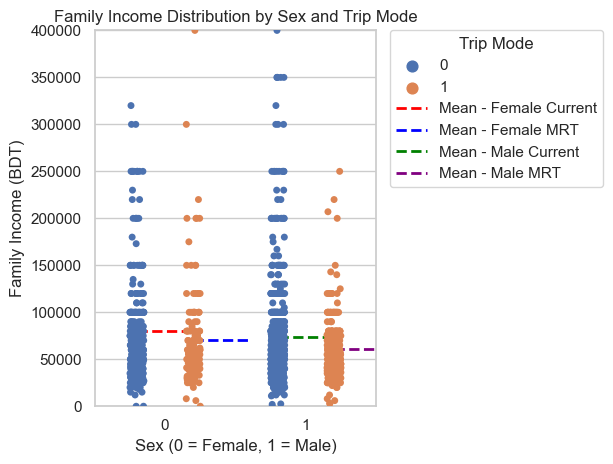

In [134]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming RF_Data is already loaded as a DataFrame
strip_plot = sns.stripplot(x=RF_Data["Sex(F=0)"],
                           y=RF_Data["Family_income"],
                           hue=RF_Data["Trip 2 (MRT=1, others=0)"],
                           jitter=True,
                           dodge=True)  # Using dodge to separate hue categories visually

# Calculate means for each combination of 'Sex' and 'Trip Mode'
mean_values = RF_Data.groupby(["Sex(F=0)", "Trip 2 (MRT=1, others=0)"])["Family_income"].mean().reset_index()

# Define colors for each combination for better visibility
colors = {(0, 0): 'red', (0, 1): 'blue', (1, 0): 'green', (1, 1): 'purple'}  # Customizable

# Plot the means as horizontal lines
for index, row in mean_values.iterrows():
    plt.hlines(y=row["Family_income"], 
               xmin=row["Sex(F=0)"] - 0.2 + (0.4 * row["Trip 2 (MRT=1, others=0)"]),
               xmax=row["Sex(F=0)"] + 0.2 + (0.4 * row["Trip 2 (MRT=1, others=0)"]),
               colors=colors[(row["Sex(F=0)"], row["Trip 2 (MRT=1, others=0)"])],
               linestyle='--',
               linewidth=2,
               label=f'Mean - {"Female" if row["Sex(F=0)"]==0 else "Male"} {"Current" if row["Trip 2 (MRT=1, others=0)"]==0 else "MRT"}')

# Setting labels and title
plt.xlabel('Sex (0 = Female, 1 = Male)')
plt.ylabel('Family Income (BDT)')
plt.title('Family Income Distribution by Sex and Trip Mode')

# Customizing the legend to handle unique labels for the mean lines
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates in legend
plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Optionally, adjust plot limits or aesthetic elements
plt.xlim(-.5, 1.5)  # Adjust to ensure all groups are fully visible
plt.ylim(0, 400000)
# Show the plot
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()


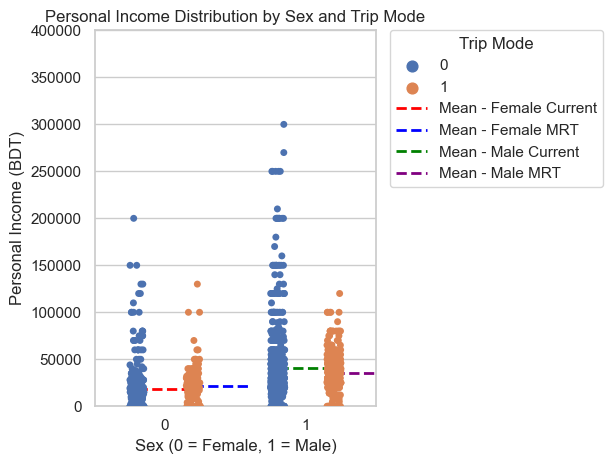

In [135]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming RF_Data is already loaded as a DataFrame
strip_plot = sns.stripplot(x=RF_Data["Sex(F=0)"],
                           y=RF_Data["Personal_Income"],  # Updated to Personal_Income
                           hue=RF_Data["Trip 2 (MRT=1, others=0)"],
                           jitter=True,
                           dodge=True)  # Using dodge to separate hue categories visually

# Calculate means for each combination of 'Sex' and 'Trip Mode'
mean_values = RF_Data.groupby(["Sex(F=0)", "Trip 2 (MRT=1, others=0)"])["Personal_Income"].mean().reset_index()

# Define colors for each combination for better visibility
colors = {(0, 0): 'red', (0, 1): 'blue', (1, 0): 'green', (1, 1): 'purple'}  # Customizable

# Plot the means as horizontal lines
for index, row in mean_values.iterrows():
    plt.hlines(y=row["Personal_Income"], 
               xmin=row["Sex(F=0)"] - 0.2 + (0.4 * row["Trip 2 (MRT=1, others=0)"]),
               xmax=row["Sex(F=0)"] + 0.2 + (0.4 * row["Trip 2 (MRT=1, others=0)"]),
               colors=colors[(row["Sex(F=0)"], row["Trip 2 (MRT=1, others=0)"])],
               linestyle='--',
               linewidth=2,
               label=f'Mean - {"Female" if row["Sex(F=0)"]==0 else "Male"} {"Current" if row["Trip 2 (MRT=1, others=0)"]==0 else "MRT"}')

# Setting labels and title
plt.xlabel('Sex (0 = Female, 1 = Male)')
plt.ylabel('Personal Income (BDT)')  # Updated label
plt.title('Personal Income Distribution by Sex and Trip Mode')

# Customizing the legend to handle unique labels for the mean lines
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates in legend
plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Optionally, adjust plot limits or aesthetic elements
plt.xlim(-.5, 1.5)  # Adjust to ensure all groups are fully visible
plt.ylim(0, 400000)  # Adjust as needed based on your data range

# Show the plot
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()


In [5]:
RF_Data_1= pd.read_csv("D:\MSC thesis\MSc_Thesis_Sept_07_excel_CSV.csv")
RF_Data_1= pd.read_csv("D:\MSC thesis\MSc_Thesis_Sept_07_Stats.csv")

RF_Data_1

,Average of Total Waiting Time,Column Labels,Unnamed: 2,Unnamed: 3
0,Row Labels,0.000000,1.000000,Grand Total
1,0,6.043571,6.698630,6.167241379
2,1,4.828125,8.693333,7.291784703
3,Grand Total,5.898036,7.709459,6.429610046


In [6]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming RF_Data_1 is already loaded as a DataFrame
# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Current', 1: 'MRT'})

strip_plot = sns.stripplot(x=RF_Data_1["Having_PV"],
                           y=RF_Data_1["Family_income"],
                           hue=RF_Data_1["Trip Mode"],
                           jitter=True,
                           dodge=True)  # Using dodge to separate hue categories visually

# Calculate means for each combination of 'Having_PV' and 'Trip Mode'
mean_values = RF_Data_1.groupby(["Having_PV", "Trip Mode"])["Family_income"].mean().reset_index()

# Define colors for each combination for better visibility
colors = {('0', 'Non MRT'): 'red', ('0', 'MRT'): 'blue', ('1', 'Non MRT'): 'green', ('1', 'MRT'): 'purple'}

# Plot the means as horizontal lines
for index, row in mean_values.iterrows():
    plt.hlines(y=row["Family_income"], 
               xmin=row["Having_PV"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               xmax=row["Having_PV"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               colors=colors[(str(row["Having_PV"]), row["Trip Mode"])],
               linestyle='--',
               linewidth=2,
               label=f'Mean - {"No PV" if row["Having_PV"]==0 else "Having PV"} {row["Trip Mode"]}')

# Setting labels and title
plt.xlabel('Private Vehicle Ownership')
plt.ylabel('Family Income (BDT)')
plt.title('Family Income Distribution by Private Vehicle Ownership and Trip Mode')

# Set custom x-axis tick labels
plt.xticks(ticks=[0, 1], labels=['No PV', 'Having PV'])

# Customizing the legend to handle unique labels for the mean lines
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates in legend
plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Optionally, adjust plot limits or aesthetic elements
plt.xlim(-.5, 1.5)  # Adjust to ensure all groups are fully visible
plt.ylim(0, 400000)
# Show the plot
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()


KeyError: 'Trip 2 (MRT=1, others=0)'

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming RF_Data_1 is already loaded as a DataFrame
# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, Non MRT=0)'].map({0: 'Non MRT', 1: 'MRT'})

# Convert Distance_Class = 4 to Distance_Class = 3
RF_Data_1['Distance_Class'] = RF_Data_1['Distance_Class'].replace(4, 3)

# Plotting the stripplot
strip_plot = sns.stripplot(x=RF_Data_1["Distance_Class"],
                           y=RF_Data_1["Diff_Bus&MRT_Fare"],
                           hue=RF_Data_1["Trip Mode"],
                           jitter=True,
                           dodge=True)  # Using dodge to separate hue categories visually

# Calculate means for each combination of 'Distance_Class' and 'Trip Mode'
mean_values = RF_Data_1.groupby(["Distance_Class", "Trip Mode"])["Diff_Bus&MRT_Fare"].mean().reset_index()

# Define colors for each combination for better visibility (now with only 3 Distance_Class values)
colors = {(1, 'Current'): 'red', (1, 'MRT'): 'blue', 
          (2, 'Current'): 'green', (2, 'MRT'): 'purple', 
          (3, 'Current'): 'orange', (3, 'MRT'): 'cyan'}

# Plot the means as horizontal lines
for index, row in mean_values.iterrows():
    plt.hlines(y=row["Diff_Bus&MRT_Fare"], 
               xmin=row["Distance_Class"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               xmax=row["Distance_Class"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               colors=colors[(row["Distance_Class"], row["Trip Mode"])],
               linestyle='--',
               linewidth=2,
               label=f'Mean - Class {row["Distance_Class"]} {row["Trip Mode"]}')

# Setting labels and title
plt.xlabel('Distance Class')
plt.ylabel('Difference in Bus and MRT Fare (BDT)')
plt.title('Difference in Bus and MRT Fare by Distance Class and Trip Mode')

# Set custom x-axis tick labels (now only three categories)
plt.xticks(ticks=[1, 2, 3], labels=['< 5km', '5-10km', '> 10km'])

# Customizing the legend to handle unique labels for the mean lines
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates in legend
plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Adjust plot limits and display the plot
plt.xlim(.5, 5.5)  # Adjust to ensure all groups are fully visible
plt.ylim(0, max(RF_Data_1["Diff_Bus&MRT_Fare"]) * 1.1)  # Adjust to fit the range of Diff_Bus&MRT_Fare

# Show the plot
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()


KeyError: 'Trip 2 (MRT=1, Non MRT=0)'

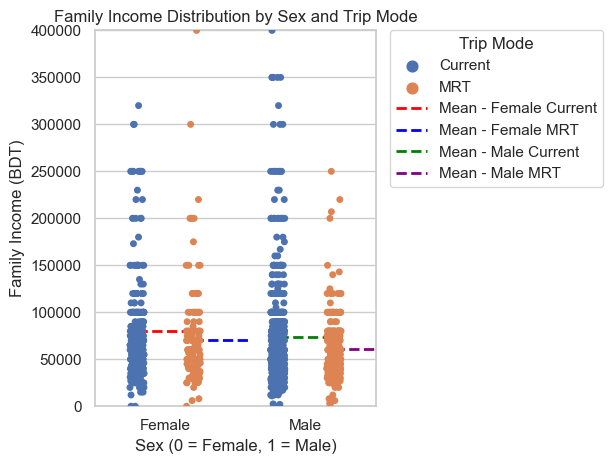

In [141]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming RF_Data_1 is already loaded as a DataFrame
# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Current', 1: 'MRT'})

strip_plot = sns.stripplot(x=RF_Data_1["Sex(F=0)"],
                           y=RF_Data_1["Family_income"],
                           hue=RF_Data_1["Trip Mode"],
                           jitter=True,
                           dodge=True)  # Using dodge to separate hue categories visually

# Calculate means for each combination of 'Sex(F=0)' and 'Trip Mode'
mean_values = RF_Data_1.groupby(["Sex(F=0)", "Trip Mode"])["Family_income"].mean().reset_index()

# Define colors for each combination for better visibility
colors = {(0, 'Current'): 'red', (0, 'MRT'): 'blue', (1, 'Current'): 'green', (1, 'MRT'): 'purple'}

# Plot the means as horizontal lines
for index, row in mean_values.iterrows():
    plt.hlines(y=row["Family_income"], 
               xmin=row["Sex(F=0)"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               xmax=row["Sex(F=0)"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               colors=colors[(row["Sex(F=0)"], row["Trip Mode"])],
               linestyle='--',
               linewidth=2,
               label=f'Mean - {"Female" if row["Sex(F=0)"]==0 else "Male"} {row["Trip Mode"]}')

# Setting labels and title
plt.xlabel('Sex (0 = Female, 1 = Male)')
plt.ylabel('Family Income (BDT)')
plt.title('Family Income Distribution by Sex and Trip Mode')

# Set custom x-axis tick labels
plt.xticks(ticks=[0, 1], labels=['Female', 'Male'])

# Customizing the legend to handle unique labels for the mean lines
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates in legend
plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Optionally, adjust plot limits or aesthetic elements
plt.xlim(-.5, 1.5)  # Adjust to ensure all groups are fully visible
plt.ylim(0, 400000)
# Show the plot
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()


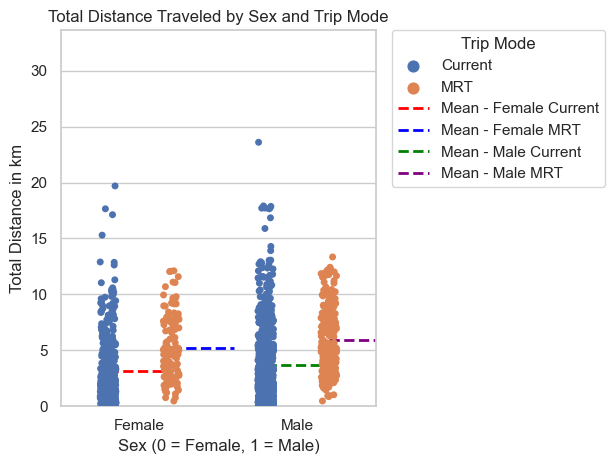

In [157]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming RF_Data_1 is already loaded as a DataFrame
# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Current', 1: 'MRT'})

strip_plot = sns.stripplot(x=RF_Data_1["Sex(F=0)"],
                           y=RF_Data_1["Total Distance in km"],
                           hue=RF_Data_1["Trip Mode"],
                           jitter=True,
                           dodge=True)  # Using dodge to separate hue categories visually

# Calculate means for each combination of 'Sex(F=0)' and 'Trip Mode'
mean_values = RF_Data_1.groupby(["Sex(F=0)", "Trip Mode"])["Total Distance in km"].mean().reset_index()

# Define colors for each combination for better visibility
colors = {(0, 'Current'): 'red', (0, 'MRT'): 'blue', (1, 'Current'): 'green', (1, 'MRT'): 'purple'}

# Plot the means as horizontal lines
for index, row in mean_values.iterrows():
    plt.hlines(y=row["Total Distance in km"], 
               xmin=row["Sex(F=0)"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               xmax=row["Sex(F=0)"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               colors=colors[(row["Sex(F=0)"], row["Trip Mode"])],
               linestyle='--',
               linewidth=2,
               label=f'Mean - {"Female" if row["Sex(F=0)"]==0 else "Male"} {row["Trip Mode"]}')

# Setting labels and title
plt.xlabel('Sex (0 = Female, 1 = Male)')
plt.ylabel('Total Distance in km')
plt.title('Total Distance Traveled by Sex and Trip Mode')

# Set custom x-axis tick labels
plt.xticks(ticks=[0, 1], labels=['Female', 'Male'])

# Customizing the legend to handle unique labels for the mean lines
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates in legend
plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Optionally, adjust plot limits or aesthetic elements
plt.xlim(-.5, 1.5)  # Adjust to ensure all groups are fully visible
plt.ylim(0, RF_Data_1["Total Distance in km"].max() + 10)  # Adjust the upper limit to include a margin above the highest value
# Show the plot
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()


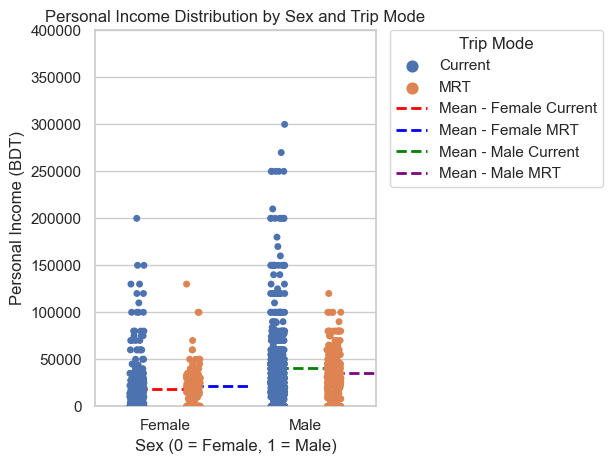

In [142]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming RF_Data_1 is already loaded as a DataFrame
# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Current', 1: 'MRT'})

strip_plot = sns.stripplot(x=RF_Data_1["Sex(F=0)"],
                           y=RF_Data_1["Personal_Income"],
                           hue=RF_Data_1["Trip Mode"],
                           jitter=True,
                           dodge=True)  # Using dodge to separate hue categories visually

# Calculate means for each combination of 'Sex(F=0)' and 'Trip Mode'
mean_values = RF_Data_1.groupby(["Sex(F=0)", "Trip Mode"])["Personal_Income"].mean().reset_index()

# Define colors for each combination for better visibility
colors = {(0, 'Current'): 'red', (0, 'MRT'): 'blue', (1, 'Current'): 'green', (1, 'MRT'): 'purple'}

# Plot the means as horizontal lines
for index, row in mean_values.iterrows():
    plt.hlines(y=row["Personal_Income"], 
               xmin=row["Sex(F=0)"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               xmax=row["Sex(F=0)"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               colors=colors[(row["Sex(F=0)"], row["Trip Mode"])],
               linestyle='--',
               linewidth=2,
               label=f'Mean - {"Female" if row["Sex(F=0)"]==0 else "Male"} {row["Trip Mode"]}')

# Setting labels and title
plt.xlabel('Sex (0 = Female, 1 = Male)')
plt.ylabel('Personal Income (BDT)')
plt.title('Personal Income Distribution by Sex and Trip Mode')

# Set custom x-axis tick labels
plt.xticks(ticks=[0, 1], labels=['Female', 'Male'])

# Customizing the legend to handle unique labels for the mean lines
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates in legend
plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Optionally, adjust plot limits or aesthetic elements
plt.xlim(-.5, 1.5)  # Adjust to ensure all groups are fully visible
plt.ylim(0, 400000)
# Show the plot
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()


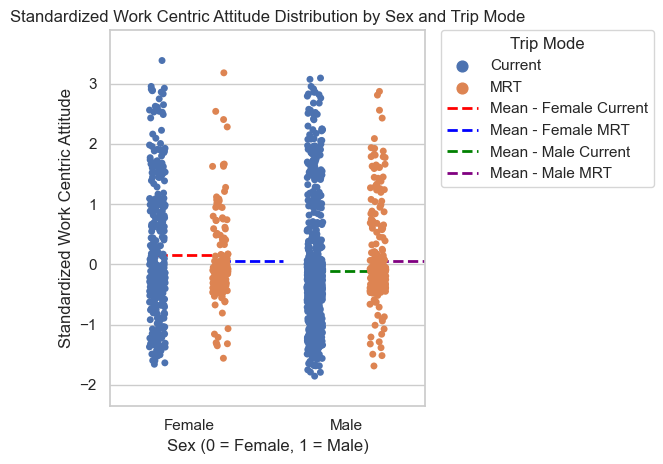

In [167]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming RF_Data_1 is already loaded as a DataFrame
# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Current', 1: 'MRT'})

strip_plot = sns.stripplot(x=RF_Data_1["Sex(F=0)"],
                           y=RF_Data_1["Work_cen"],
                           hue=RF_Data_1["Trip Mode"],
                           jitter=True,
                           dodge=True)  # Using dodge to separate hue categories visually

# Calculate means for each combination of 'Sex(F=0)' and 'Trip Mode'
mean_values = RF_Data_1.groupby(["Sex(F=0)", "Trip Mode"])["Work_cen"].mean().reset_index()

# Define colors for each combination for better visibility
colors = {(0, 'Current'): 'red', (0, 'MRT'): 'blue', (1, 'Current'): 'green', (1, 'MRT'): 'purple'}

# Plot the means as horizontal lines
for index, row in mean_values.iterrows():
    plt.hlines(y=row["Work_cen"], 
               xmin=row["Sex(F=0)"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               xmax=row["Sex(F=0)"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               colors=colors[(row["Sex(F=0)"], row["Trip Mode"])],
               linestyle='--',
               linewidth=2,
               label=f'Mean - {"Female" if row["Sex(F=0)"]==0 else "Male"} {row["Trip Mode"]}')

# Setting labels and title
plt.xlabel('Sex (0 = Female, 1 = Male)')
plt.ylabel('Standardized Work Centric Attitude')
plt.title('Standardized Work Centric Attitude Distribution by Sex and Trip Mode')

# Set custom x-axis tick labels
plt.xticks(ticks=[0, 1], labels=['Female', 'Male'])

# Customizing the legend to handle unique labels for the mean lines
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates in legend
plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Optionally, adjust plot limits or aesthetic elements
plt.xlim(-.5, 1.5)  # Adjust to ensure all groups are fully visible
plt.ylim(RF_Data_1["Work_cen"].min() - 0.5, RF_Data_1["Work_cen"].max() + 0.5)  # Adjust the limits to slightly beyond the actual data range

# Show the plot
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()


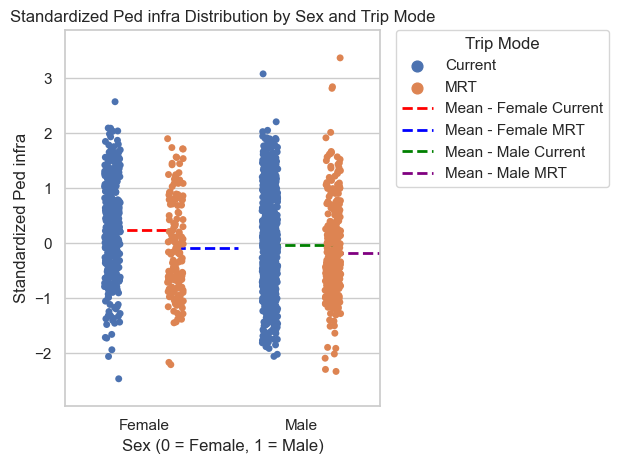

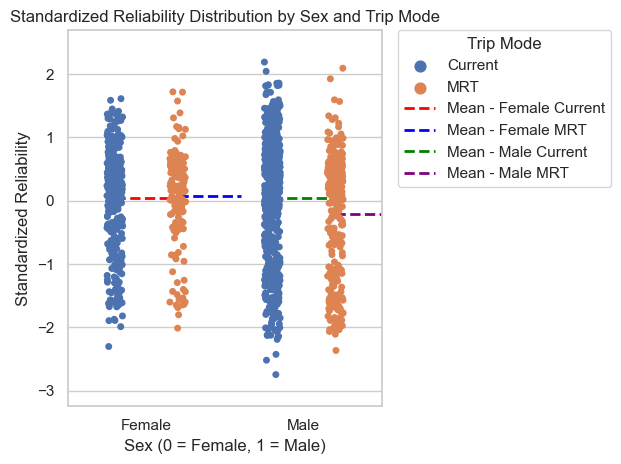

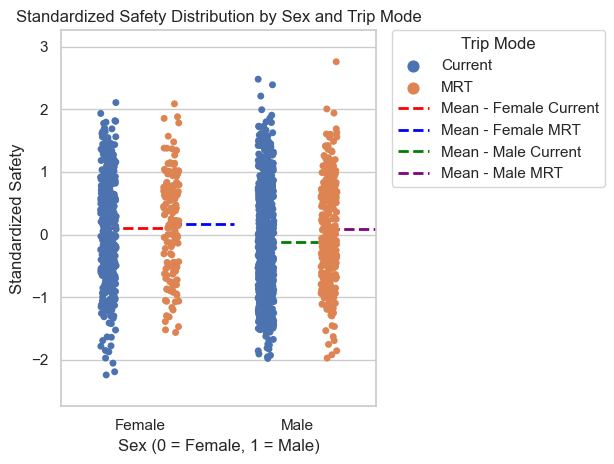

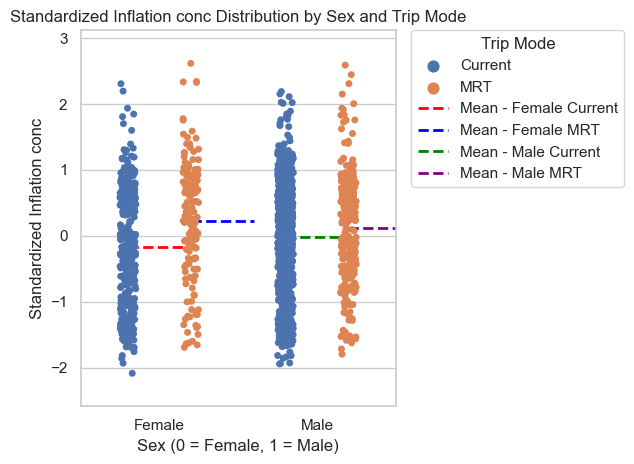

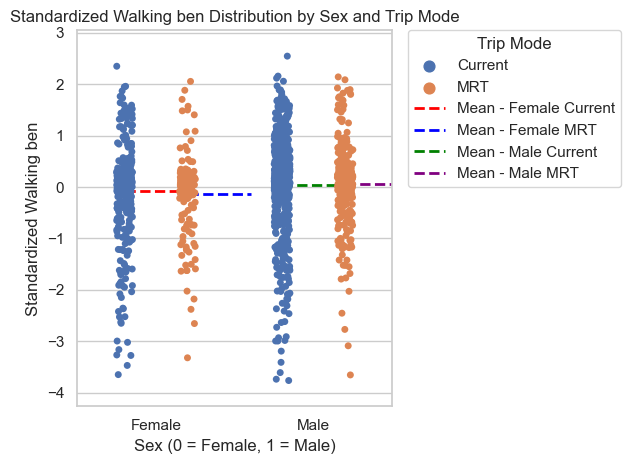

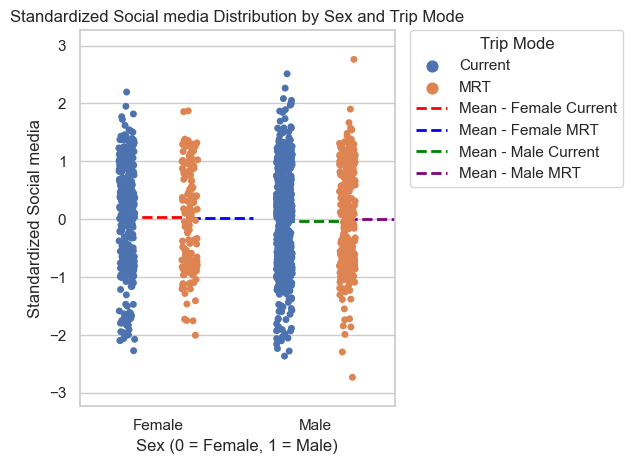

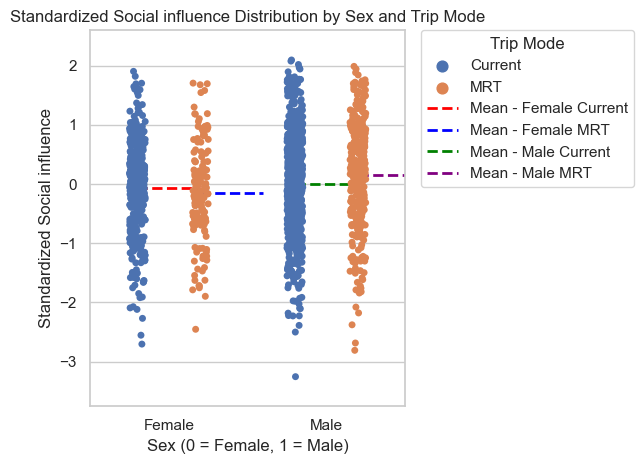

In [168]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming RF_Data_1 is already loaded as a DataFrame
# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Current', 1: 'MRT'})

# List of variables to plot
variables = ["Ped_infra", "Reliability", "Safety", "Inflation_conc", "Walking_ben", "Social_media", "Social_influence"]

# Define colors for the combinations
colors = {(0, 'Current'): 'red', (0, 'MRT'): 'blue', (1, 'Current'): 'green', (1, 'MRT'): 'purple'}

# Iterate over the variables and create a plot for each
for variable in variables:
    strip_plot = sns.stripplot(x=RF_Data_1["Sex(F=0)"],
                               y=RF_Data_1[variable],
                               hue=RF_Data_1["Trip Mode"],
                               jitter=True,
                               dodge=True)  # Using dodge to separate hue categories visually

    # Calculate means for each combination of 'Sex(F=0)' and 'Trip Mode'
    mean_values = RF_Data_1.groupby(["Sex(F=0)", "Trip Mode"])[variable].mean().reset_index()

    # Plot the means as horizontal lines
    for index, row in mean_values.iterrows():
        plt.hlines(y=row[variable], 
                   xmin=row["Sex(F=0)"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
                   xmax=row["Sex(F=0)"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
                   colors=colors[(row["Sex(F=0)"], row["Trip Mode"])],
                   linestyle='--',
                   linewidth=2,
                   label=f'Mean - {"Female" if row["Sex(F=0)"]==0 else "Male"} {row["Trip Mode"]}')

    # Setting labels and title
    plt.xlabel('Sex (0 = Female, 1 = Male)')
    plt.ylabel(f'Standardized {variable.replace("_", " ")}')
    plt.title(f'Standardized {variable.replace("_", " ")} Distribution by Sex and Trip Mode')

    # Set custom x-axis tick labels
    plt.xticks(ticks=[0, 1], labels=['Female', 'Male'])

    # Customizing the legend to handle unique labels for the mean lines
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))  # Remove duplicates in legend
    plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

    # Optionally, adjust plot limits or aesthetic elements
    plt.xlim(-.5, 1.5)  # Adjust to ensure all groups are fully visible
    plt.ylim(RF_Data_1[variable].min() - 0.5, RF_Data_1[variable].max() + 0.5)  # Adjust the limits to slightly beyond the actual data range

    # Show the plot
    plt.tight_layout()  # Adjust the layout to make room for the legend
    plt.show()


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming RF_Data_1 is already loaded as a DataFrame
# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Current', 1: 'MRT'})

strip_plot = sns.stripplot(x=RF_Data_1["Having_PV"],
                           y=RF_Data_1["Family_income"],
                           hue=RF_Data_1["Trip Mode"],
                           jitter=True,
                           dodge=True)  # Using dodge to separate hue categories visually

# Calculate means for each combination of 'Having_PV' and 'Trip Mode'
mean_values = RF_Data_1.groupby(["Having_PV", "Trip Mode"])["Family_income"].mean().reset_index()

# Define colors for each combination for better visibility
colors = {('0', 'Current'): 'red', ('0', 'MRT'): 'blue', ('1', 'Current'): 'green', ('1', 'MRT'): 'purple'}

# Plot the means as horizontal lines
for index, row in mean_values.iterrows():
    plt.hlines(y=row["Family_income"], 
               xmin=row["Having_PV"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               xmax=row["Having_PV"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               colors=colors[(str(row["Having_PV"]), row["Trip Mode"])],
               linestyle='--',
               linewidth=2,
               label=f'Mean - {"No PV" if row["Having_PV"]==0 else "Having PV"} {row["Trip Mode"]}')

# Setting labels and title
plt.xlabel('Private Vehicle Ownership')
plt.ylabel('Family Income (BDT)')
plt.title('Family Income Distribution by Private Vehicle Ownership and Trip Mode')

# Set custom x-axis tick labels
plt.xticks(ticks=[0, 1], labels=['No PV', 'Having PV'])

# Customizing the legend to handle unique labels for the mean lines
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates in legend
plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Optionally, adjust plot limits or aesthetic elements
plt.xlim(-.5, 1.5)  # Adjust to ensure all groups are fully visible
plt.ylim(0, 400000)
# Show the plot
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()


In [71]:
RF_Data_1= pd.read_csv("D:\MSC thesis\MSc_Thesis_Sept_07_excel.csv")

RF_Data_1.columns

Index(['Response ID', 'Age', 'Age_cat', 'Sex(F=0)', 'EmpS_Full time Worker',
       'EmpS_Hybrid (Can work at home or at office)', 'Emps_Others',
       'EmpS_Part Time', 'EmpS_Student', 'EmpS_Work at home (Full-time)',
       'EmpS_Work at home (Part-time)', 'Rapid pass/MRT pass for MRT (Y=1)',
       'last educational degree', 'H_size', 'EarningFM', 'Personal_Income',
       'Family_income', 'Family_income_1', 'Total Distance for access  trip',
       'Total Distance in km', 'Distance_Class', 'Trip 1 (MRT=1, others=0)',
       'Trip 2 (MRT=1, others=0)', 'Trip 3 (MRT=1, others=0)', 'Work_cen',
       'Family_incl', 'Ped_infra', 'Reliability', 'Safety', 'Inflation_conc',
       'Walking_ben', 'Social_media', 'Social_influence', 'Age<35', 'Age<45',
       'Age<55', 'Age<65', 'One_PV', 'Greater_Than_One_PV ',
       'Total Waiting Time', 'Fare_Current_total', 'TT_Current_total',
       'distance_500m', 'Very Flexible', 'Somewhat Flexible', 'Fare_Bus_total',
       'Fare_MRT_total', 'Ttm

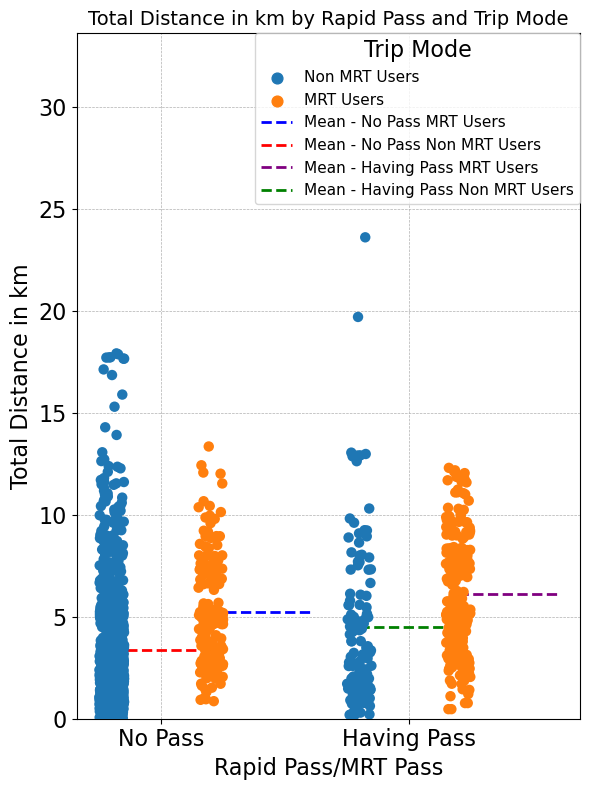

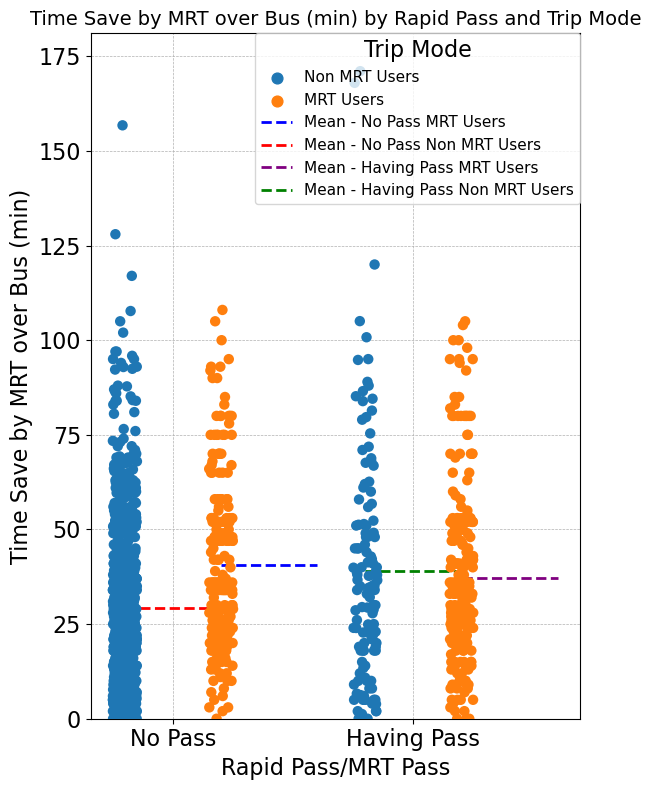

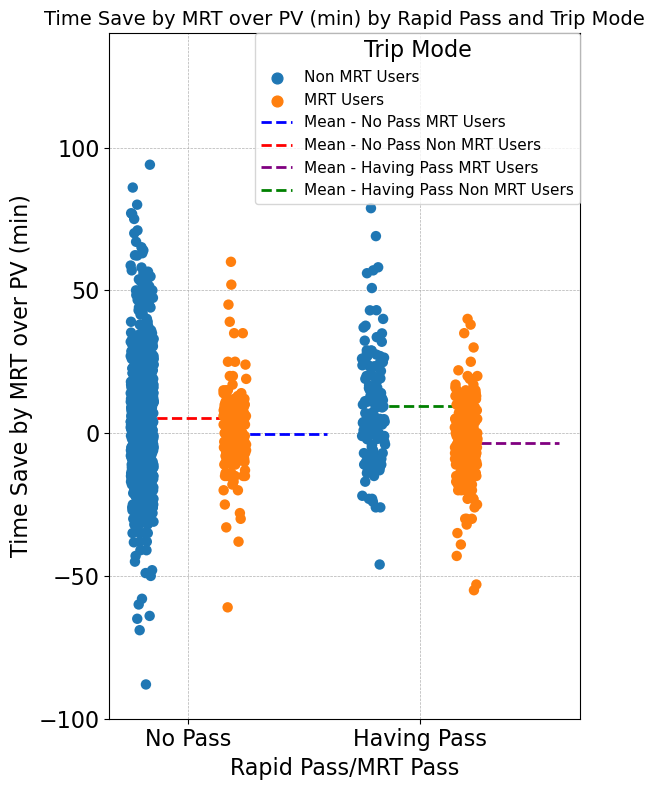

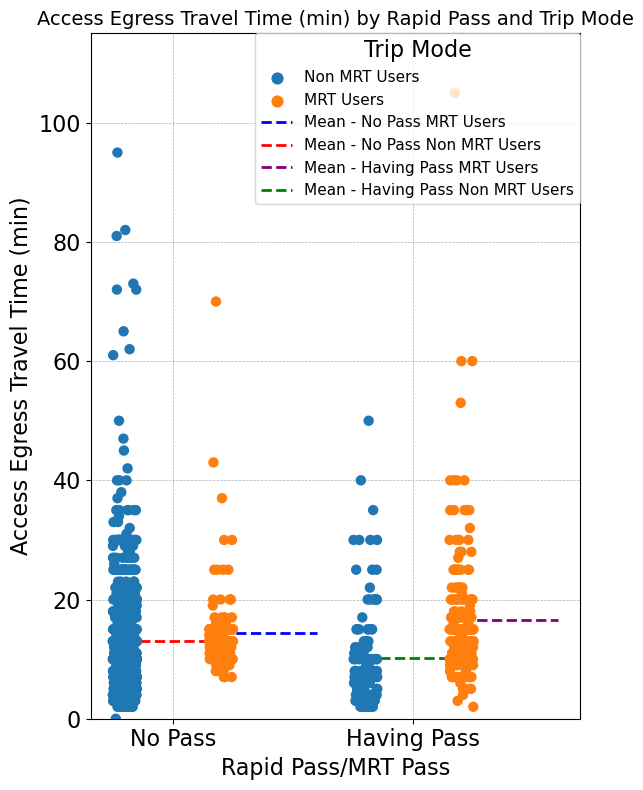

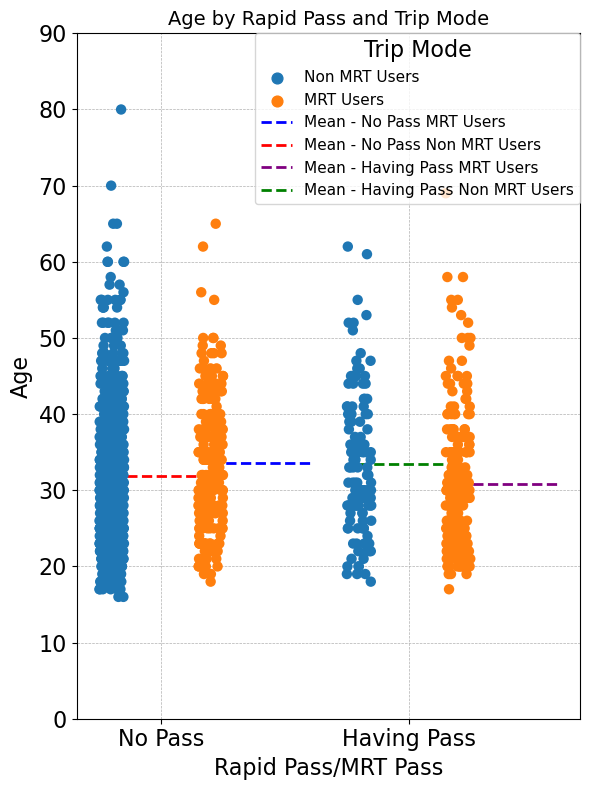

In [69]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Ensure the 'Trip Mode' column is properly created
if 'Trip Mode' not in RF_Data_1.columns:
    RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Non MRT Users', 1: 'MRT Users'})

# List of variables to replace 'Age'
variables = ['Total Distance in km', 'Saved_Time_by_MRT_Bus', 'Saved_Time_by_MRT_PV', 'Access_EgressTT','Age']

# Corresponding y-labels
y_labels = ['Total Distance in km', 'Time Save by MRT over Bus (min)', 'Time Save by MRT over PV (min)', 'Access Egress Travel Time (min)', 'Age']

# Variables with standardized scale and space for the legend
standardized_vars = ['Work_cen', 'Family_incl', 'Ped_infra', 'Reliability', 'Safety', 
                     'Inflation_conc', 'Walking_ben', 'Social_media', 'Social_influence']

# Loop through each variable and create the plot
for var, y_label in zip(variables, y_labels):
    # Check if the variable exists in the DataFrame
    if var in RF_Data_1.columns:
        plt.figure(figsize=(6, 8))  # Adjust the figure size if necessary
        strip_plot = sns.stripplot(x=RF_Data_1["Rapid pass/MRT pass for MRT (Y=1)"],  # Using the exact column name as it appears
                                   y=RF_Data_1[var],
                                   hue=RF_Data_1["Trip Mode"],
                                   jitter=True,
                                   dodge=True,
                                   size=7.5)  # Using dodge to separate hue categories visually

        # Add grid behind the plot
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)

        # Calculate means for each combination of 'Pass' and 'Trip Mode'
        mean_values = RF_Data_1.groupby(["Rapid pass/MRT pass for MRT (Y=1)", "Trip Mode"])[var].mean().reset_index()

        # Define colors for each combination for better visibility
        colors = {(0, 'Non MRT Users'): 'red', (0, 'MRT Users'): 'blue', 
                  (1, 'Non MRT Users'): 'green', (1, 'MRT Users'): 'purple'}

        # Plot the means as horizontal lines
        for index, row in mean_values.iterrows():
            plt.hlines(y=row[var], 
                       xmin=row["Rapid pass/MRT pass for MRT (Y=1)"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT Users' else 0)),
                       xmax=row["Rapid pass/MRT pass for MRT (Y=1)"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT Users' else 0)),
                       colors=colors[(row["Rapid pass/MRT pass for MRT (Y=1)"], row["Trip Mode"])],
                       linestyle='--',
                       linewidth=2,
                       label=f'Mean - {"No Pass" if row["Rapid pass/MRT pass for MRT (Y=1)"]==0 else "Having Pass"} {row["Trip Mode"]}')

        # Setting labels and title
        plt.xlabel('Rapid Pass/MRT Pass', fontsize=16)
        plt.ylabel(y_label, fontsize=16)
        plt.title(f'{y_label} by Rapid Pass and Trip Mode', fontsize=14)

        # Set custom x-axis and y-axis tick labels and their font size
        plt.xticks(ticks=[0, 1], labels=['No Pass', 'Having Pass'], fontsize=16)  # No Pass=0, Having Pass=1
        plt.yticks(fontsize=16)

        # Customizing the legend to be within the main diagram and setting the font size
        handles, labels = plt.gca().get_legend_handles_labels()
        by_label = dict(zip(labels, handles))  # Remove duplicates in legend
        plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='upper right', borderaxespad=0., frameon=True, fontsize=11, title_fontsize=16)

        # Set custom y-limits based on the variable
        if var == 'Personal_Income':
            plt.ylim(0, 400000)  # Custom limit for Personal Income
        elif var == 'Family_income':
            plt.ylim(0, 500000)  # Custom limit for Family Income
        elif var == 'Saved_Time_by_MRT_PV':
            plt.ylim(-100, 140)  # Custom y-limit for Saved_Time_by_MRT_PV
        elif var in standardized_vars:
            plt.ylim(-3, 8)  # Standardized scale with space for the legend
        else:
            plt.ylim(0, RF_Data_1[var].max() + 10)  # Default y-limit with margin

        # Show the plot
        plt.tight_layout()  # Adjust the layout to make room for the legend
        plt.show()
    else:
        print(f"Variable '{var}' not found in the DataFrame.")


Unique Trip Modes:  ['Current' 'MRT']


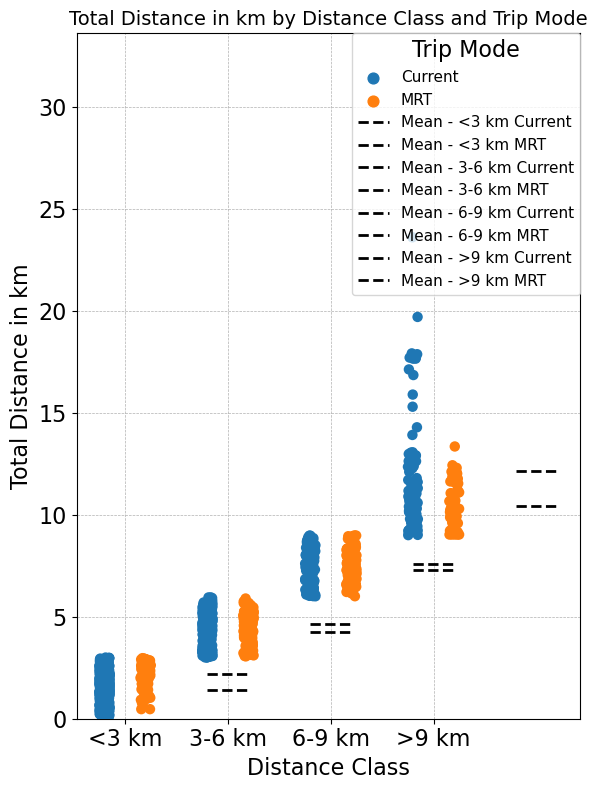

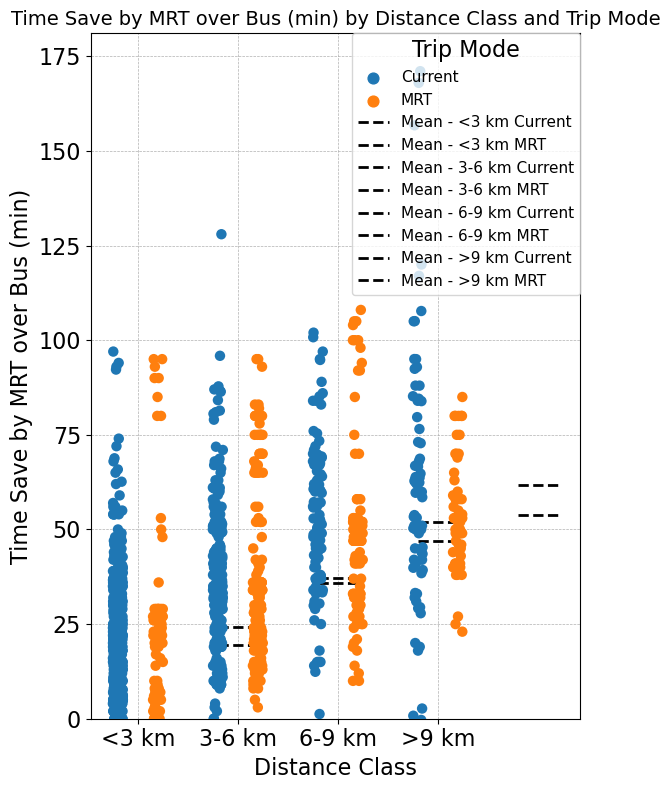

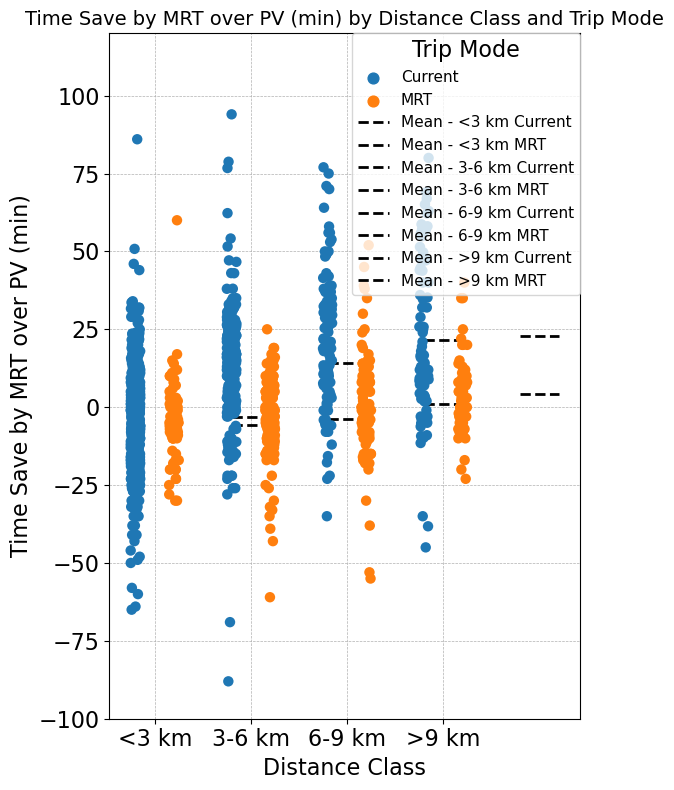

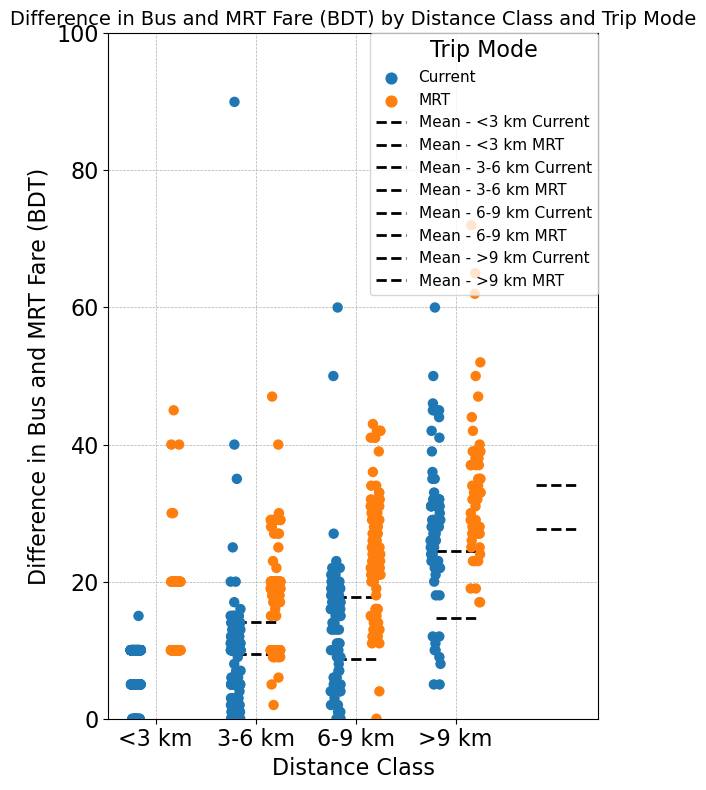

In [80]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Ensure the 'Trip Mode' column is properly created
if 'Trip Mode' not in RF_Data_1.columns:
    RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Non MRT Users', 1: 'MRT Users'})

# Check the unique values in 'Trip Mode' to ensure they are correct
print("Unique Trip Modes: ", RF_Data_1['Trip Mode'].unique())

# List of variables to replace 'Age'
variables = ['Total Distance in km', 'Saved_Time_by_MRT_Bus', 'Saved_Time_by_MRT_PV', 'Diff_Bus&MRT_Fare']

# Corresponding y-labels
y_labels = ['Total Distance in km', 'Time Save by MRT over Bus (min)', 'Time Save by MRT over PV (min)', 'Difference in Bus and MRT Fare (BDT)']

# Variables with standardized scale and space for the legend
standardized_vars = ['Work_cen', 'Family_incl', 'Ped_infra', 'Reliability', 'Safety', 
                     'Inflation_conc', 'Walking_ben', 'Social_media', 'Social_influence']

# Loop through each variable and create the plot
for var, y_label in zip(variables, y_labels):
    # Check if the variable exists in the DataFrame
    if var in RF_Data_1.columns:
        plt.figure(figsize=(6, 8))  # Adjust the figure size if necessary
        strip_plot = sns.stripplot(x=RF_Data_1["Distance_Class"],  # Use Distance_Class for grouping
                                   y=RF_Data_1[var],
                                   hue=RF_Data_1["Trip Mode"],
                                   jitter=True,
                                   dodge=True,
                                   size=7.5)  # Using dodge to separate hue categories visually

        # Add grid behind the plot
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)

        # Calculate means for each combination of 'Distance_Class' and 'Trip Mode'
        mean_values = RF_Data_1.groupby(["Distance_Class", "Trip Mode"])[var].mean().reset_index()

        # Define colors for each combination for better visibility
        colors = {(1, 'Non MRT Users'): 'red', (1, 'MRT Users'): 'blue',
                  (2, 'Non MRT Users'): 'green', (2, 'MRT Users'): 'purple',
                  (3, 'Non MRT Users'): 'orange', (3, 'MRT Users'): 'brown',
                  (4, 'Non MRT Users'): 'pink', (4, 'MRT Users'): 'cyan'}

        # Plot the means as horizontal lines
        for index, row in mean_values.iterrows():
            # Use a default color for any unexpected 'Trip Mode' value
            color_key = (row["Distance_Class"], row["Trip Mode"])
            color = colors.get(color_key, 'black')  # Fallback to 'black' if the key is not in the colors dictionary
            plt.hlines(y=row[var], 
                       xmin=row["Distance_Class"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT Users' else 0)),
                       xmax=row["Distance_Class"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT Users' else 0)),
                       colors=color,
                       linestyle='--',
                       linewidth=2,
                       label=f'Mean - {"<3 km" if row["Distance_Class"] == 1 else ("3-6 km" if row["Distance_Class"] == 2 else ("6-9 km" if row["Distance_Class"] == 3 else ">9 km"))} {row["Trip Mode"]}')

        # Setting labels and title
        plt.xlabel('Distance Class', fontsize=16)
        plt.ylabel(y_label, fontsize=16)
        plt.title(f'{y_label} by Distance Class and Trip Mode', fontsize=14)

        # Set custom x-axis and y-axis tick labels and their font size
        plt.xticks(ticks=[0, 1, 2, 3], labels=['<3 km', '3-6 km', '6-9 km', '>9 km'], fontsize=16)  # Ensure no zero in x-ticks
        plt.yticks(fontsize=16)

        # Customizing the legend to be within the main diagram and setting the font size
        handles, labels = plt.gca().get_legend_handles_labels()
        by_label = dict(zip(labels, handles))  # Remove duplicates in legend
        plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='upper right', borderaxespad=0., frameon=True, fontsize=11, title_fontsize=16)

        # Set custom y-limits based on the variable
        if var == 'Saved_Time_by_MRT_PV':
            plt.ylim(-100, 120)  # Custom y-limit for Saved_Time_by_MRT_PV
        elif var in standardized_vars:
            plt.ylim(-3, 8)  # Standardized scale with space for the legend
        else:
            plt.ylim(0, RF_Data_1[var].max() + 10)  # Default y-limit with margin

        # Show the plot
        plt.tight_layout()  # Adjust the layout to make room for the legend
        plt.show()
    else:
        print(f"Variable '{var}' not found in the DataFrame.")


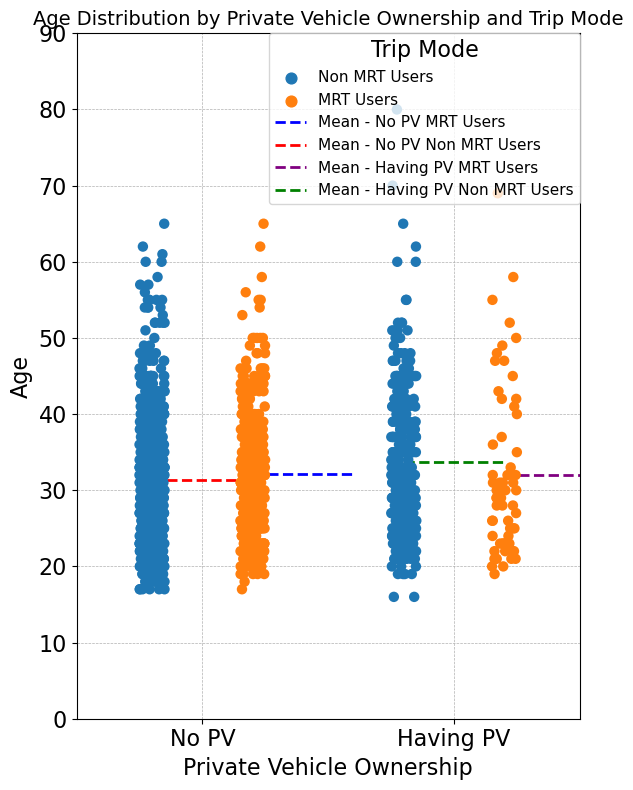

In [55]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Non MRT Users', 1: 'MRT Users'})

# Create the strip plot
plt.figure(figsize=(6, 8))  # Adjust the figure size if necessary
strip_plot = sns.stripplot(x=RF_Data_1["Having_PV"],
                           y=RF_Data_1["Age"],
                           hue=RF_Data_1["Trip Mode"],
                           jitter=True,
                           dodge=True,
                          size=7.5)  # Using dodge to separate hue categories visually

# Add grid behind the plot
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Calculate means for each combination of 'Having_PV' and 'Trip Mode'
mean_values = RF_Data_1.groupby(["Having_PV", "Trip Mode"])["Age"].mean().reset_index()

# Define colors for each combination for better visibility
colors = {(0, 'Non MRT Users'): 'red', (0, 'MRT Users'): 'blue', (1, 'Non MRT Users'): 'green', (1, 'MRT Users'): 'purple'}

# Plot the means as horizontal lines
for index, row in mean_values.iterrows():
    plt.hlines(y=row["Age"], 
               xmin=row["Having_PV"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT Users' else 0)),
               xmax=row["Having_PV"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT Users' else 0)),
               colors=colors[(row["Having_PV"], row["Trip Mode"])],
               linestyle='--',
               linewidth=2,
               label=f'Mean - {"No PV" if row["Having_PV"]==0 else "Having PV"} {row["Trip Mode"]}')

# Setting labels and title
plt.xlabel('Private Vehicle Ownership', fontsize=16)
plt.ylabel('Age', fontsize=16)
plt.title('Age Distribution by Private Vehicle Ownership and Trip Mode', fontsize=14)

# Set custom x-axis and y-axis tick labels and their font size
plt.xticks(ticks=[0, 1], labels=['No PV', 'Having PV'], fontsize=16)
plt.yticks(fontsize=16)

# Customizing the legend to be within the main diagram and setting the font size
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates in legend
plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='upper right', borderaxespad=0., frameon=True, fontsize=11, title_fontsize=16)

# Optionally, adjust plot limits or aesthetic elements
plt.xlim(-.5, 1.5)  # Adjust to ensure all groups are fully visible
plt.ylim(0, RF_Data_1["Age"].max() + 10)  # Adjust according to the maximum age category plus some margin

# Show the plot
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()


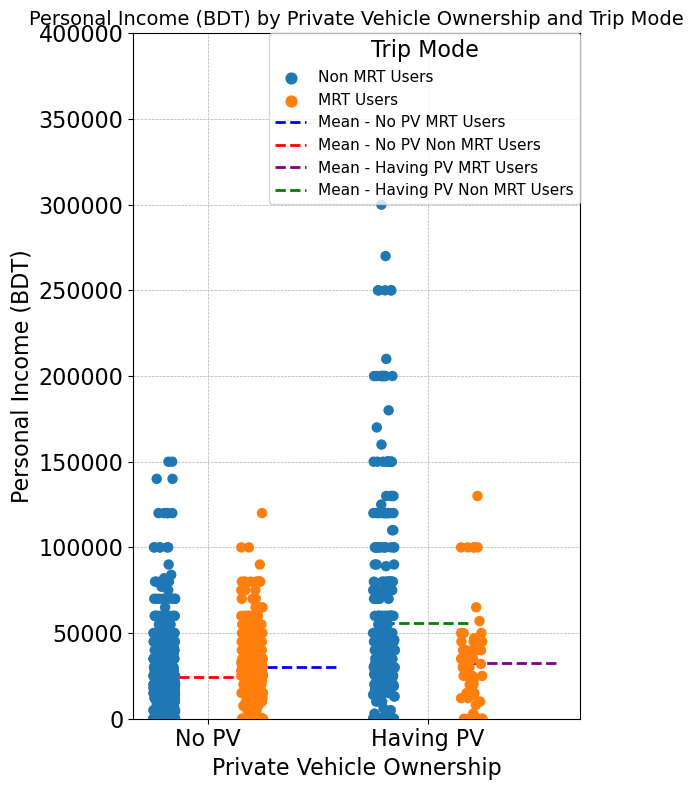

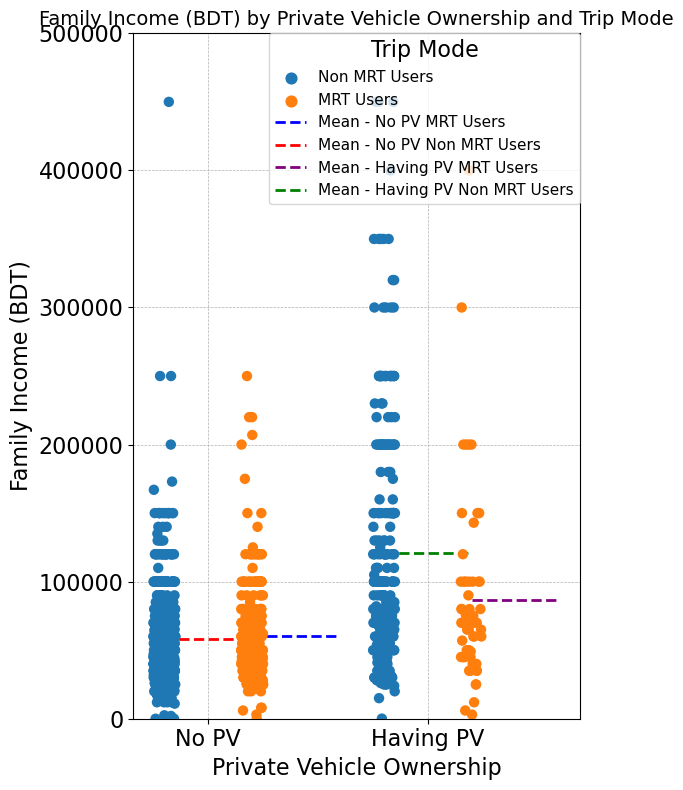

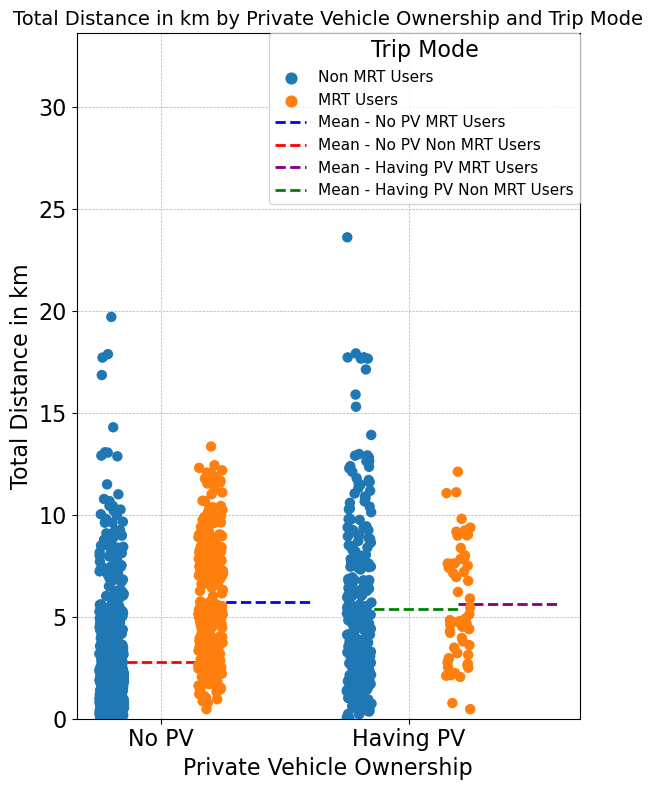

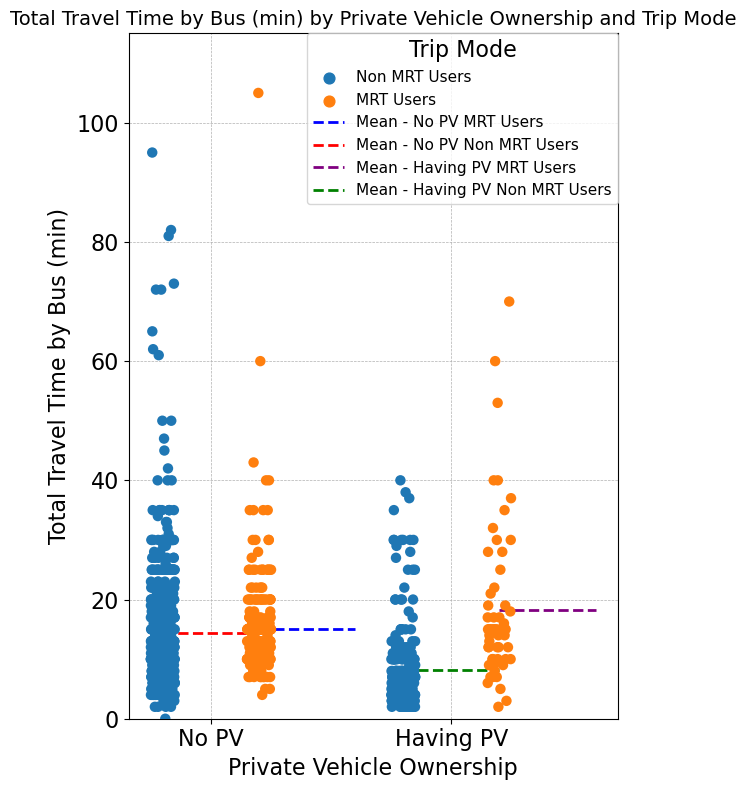

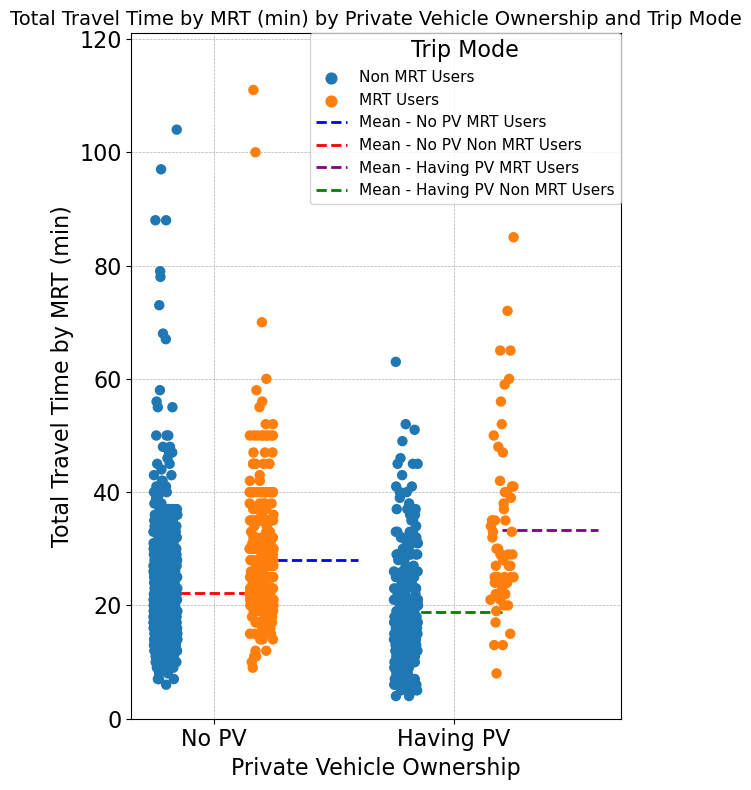

...

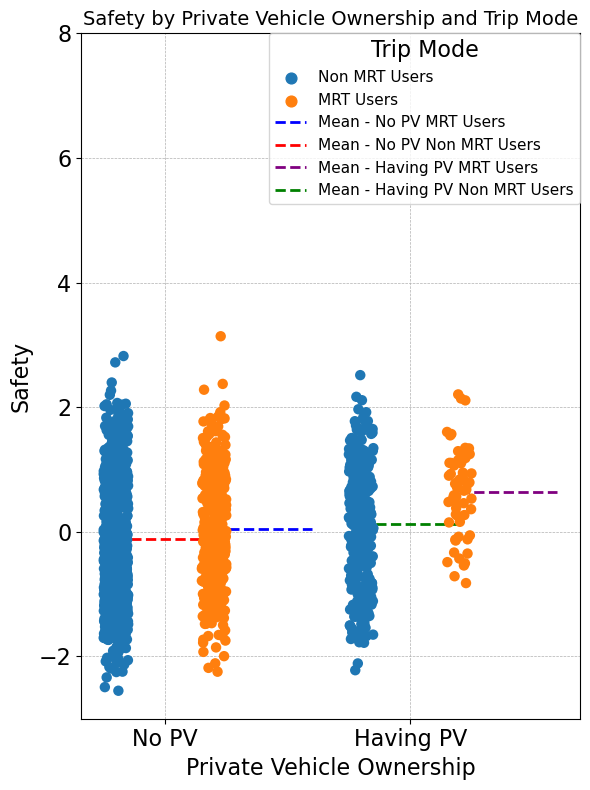

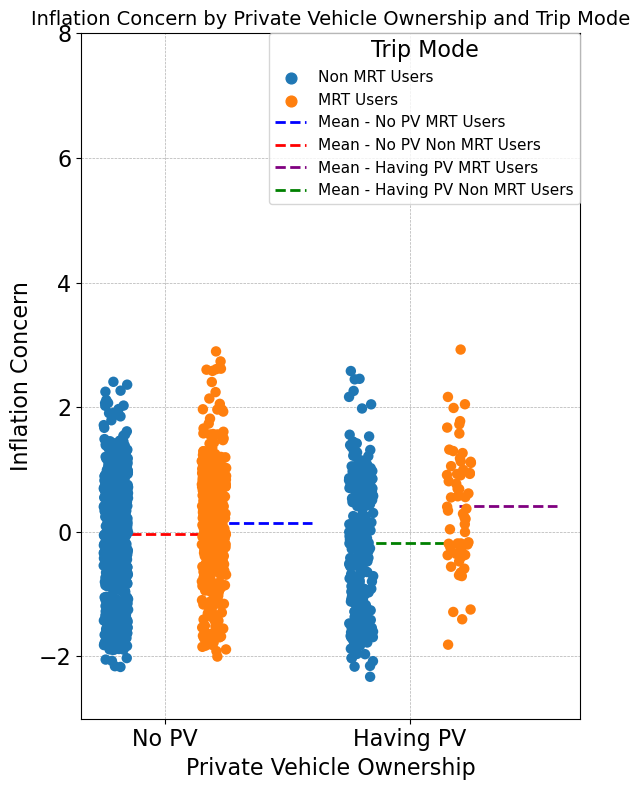

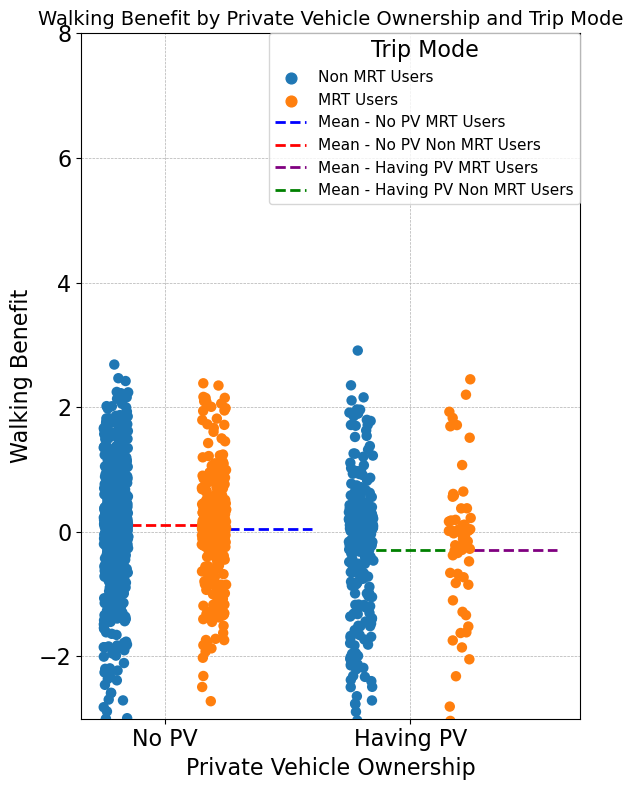

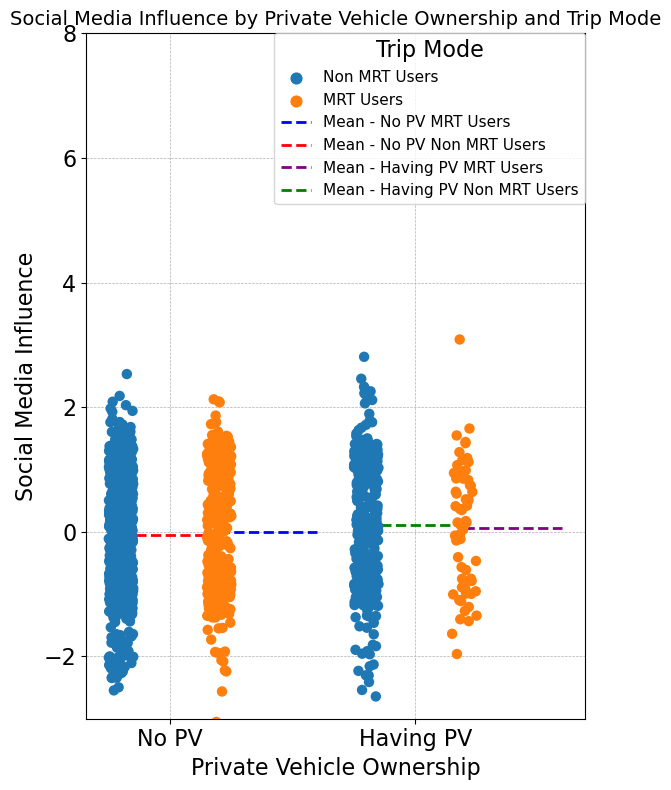

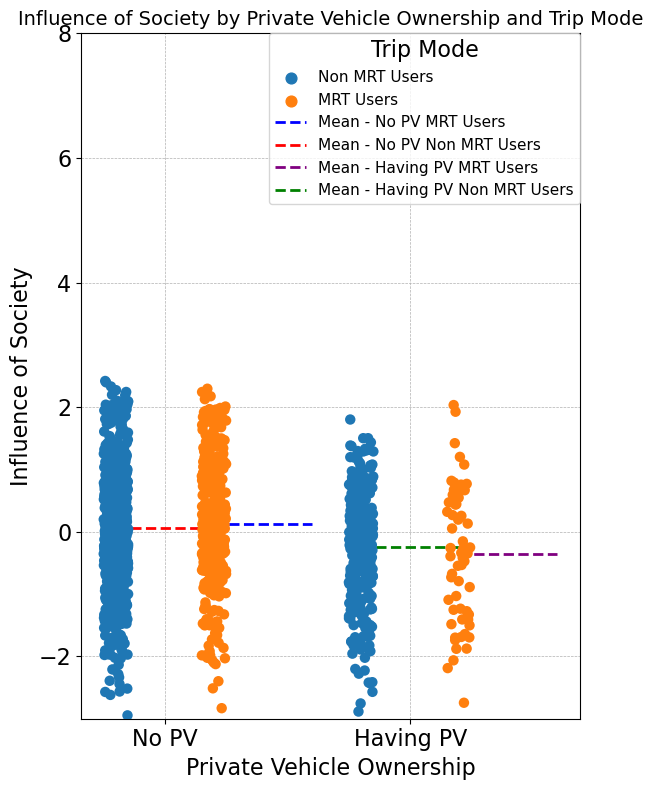

In [60]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Ensure the 'Trip Mode' column is properly created
if 'Trip Mode' not in RF_Data_1.columns:
    RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Non MRT Users', 1: 'MRT Users'})

# List of variables to replace 'Age'
variables = ['Personal_Income', 'Family_income', 'Total Distance in km', 'TT_Bus_total', 'TT_MRT_total', 'Diff_Bus&MRT_Fare', 
             'Work_cen', 'Family_incl', 'Ped_infra', 'Reliability', 'Safety', 'Inflation_conc', 
             'Walking_ben', 'Social_media', 'Social_influence']

# Corresponding y-labels
y_labels = ['Personal Income (BDT)', 'Family Income (BDT)', 'Total Distance in km','Total Travel Time by Bus (min)', 
            'Total Travel Time by MRT (min)', 'Difference between Bus and MRT Fare (BDT)', 
            'Work Centric Attitude', 'Inclination to Family', 'Pedestrian Infrastructure Perception', 
            'Reliability', 'Safety', 'Inflation Concern', 'Walking Benefit', 'Social Media Influence', 
            'Influence of Society']

# Variables with standardized scale and space for the legend
standardized_vars = ['Work_cen', 'Family_incl', 'Ped_infra', 'Reliability', 'Safety', 
                     'Inflation_conc', 'Walking_ben', 'Social_media', 'Social_influence']

# Loop through each variable and create the plot
for var, y_label in zip(variables, y_labels):
    # Check if the variable exists in the DataFrame
    if var in RF_Data_1.columns:
        plt.figure(figsize=(6, 8))  # Adjust the figure size if necessary
        strip_plot = sns.stripplot(x=RF_Data_1["Having_PV"],
                                   y=RF_Data_1[var],
                                   hue=RF_Data_1["Trip Mode"],
                                   jitter=True,
                                   dodge=True,
                                   size=7.5)  # Using dodge to separate hue categories visually

        # Add grid behind the plot
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)

        # Calculate means for each combination of 'Having_PV' and 'Trip Mode'
        mean_values = RF_Data_1.groupby(["Having_PV", "Trip Mode"])[var].mean().reset_index()

        # Define colors for each combination for better visibility
        colors = {(0, 'Non MRT Users'): 'red', (0, 'MRT Users'): 'blue', 
                  (1, 'Non MRT Users'): 'green', (1, 'MRT Users'): 'purple'}

        # Plot the means as horizontal lines
        for index, row in mean_values.iterrows():
            plt.hlines(y=row[var], 
                       xmin=row["Having_PV"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT Users' else 0)),
                       xmax=row["Having_PV"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT Users' else 0)),
                       colors=colors[(row["Having_PV"], row["Trip Mode"])],
                       linestyle='--',
                       linewidth=2,
                       label=f'Mean - {"No PV" if row["Having_PV"]==0 else "Having PV"} {row["Trip Mode"]}')

        # Setting labels and title
        plt.xlabel('Private Vehicle Ownership', fontsize=16)
        plt.ylabel(y_label, fontsize=16)
        plt.title(f'{y_label} by Private Vehicle Ownership and Trip Mode', fontsize=14)

        # Set custom x-axis and y-axis tick labels and their font size
        plt.xticks(ticks=[0, 1], labels=['No PV', 'Having PV'], fontsize=16)
        plt.yticks(fontsize=16)

        # Customizing the legend to be within the main diagram and setting the font size
        handles, labels = plt.gca().get_legend_handles_labels()
        by_label = dict(zip(labels, handles))  # Remove duplicates in legend
        plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='upper right', borderaxespad=0., frameon=True, fontsize=11, title_fontsize=16)

        # Set custom y-limits based on the variable
        if var == 'Personal_Income':
            plt.ylim(0, 400000)  # Custom limit for Personal Income
        elif var == 'Family_income':
            plt.ylim(0, 500000)  # Custom limit for Family Income
        elif var in standardized_vars:
            plt.ylim(-3, 8)  # Standardized scale with space for the legend
        else:
            plt.ylim(0, RF_Data_1[var].max() + 10)  # Default y-limit with margin

        # Show the plot
        plt.tight_layout()  # Adjust the layout to make room for the legend
        plt.show()
    else:
        print(f"Variable '{var}' not found in the DataFrame.")


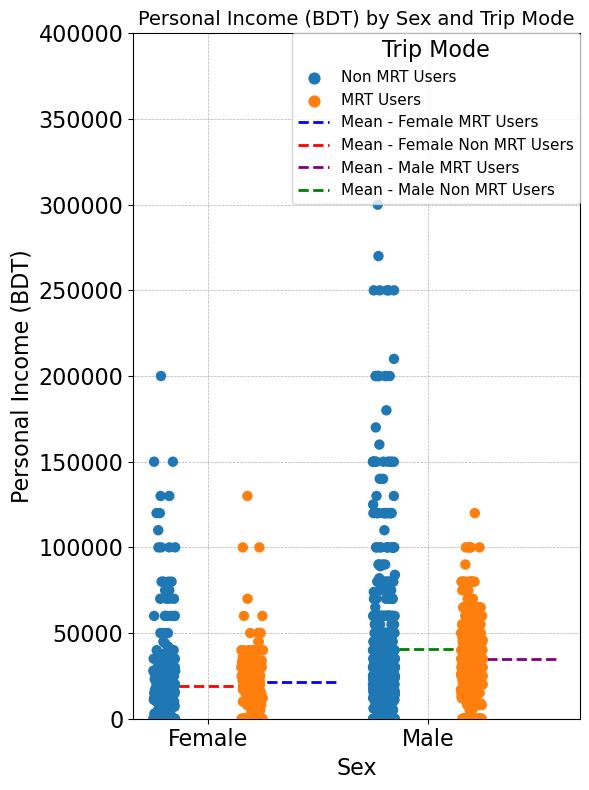

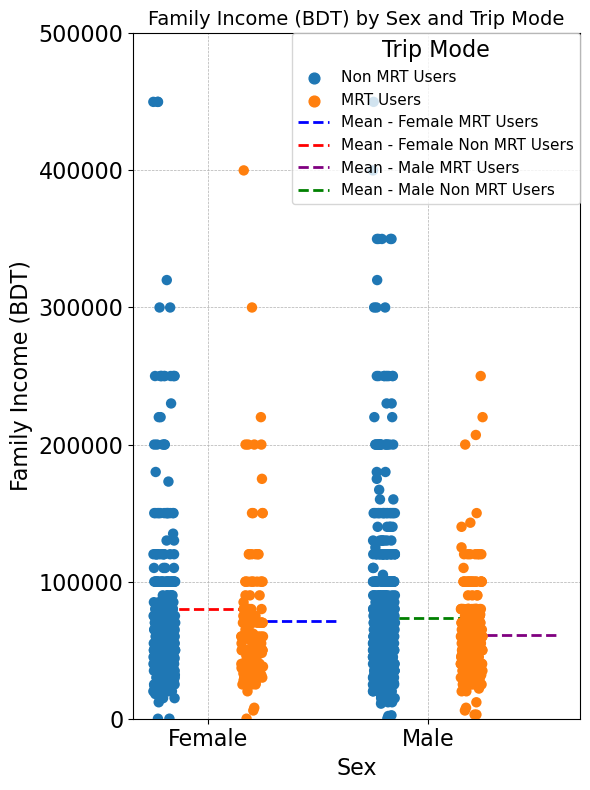

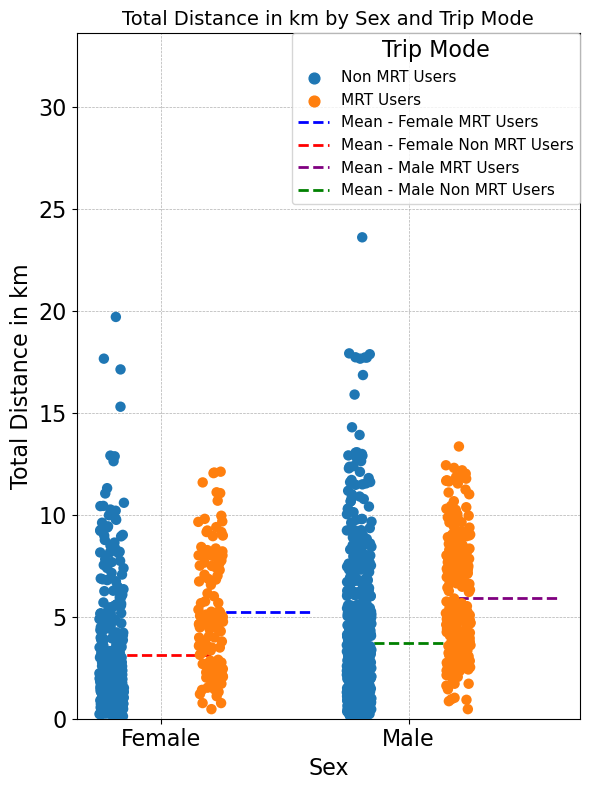

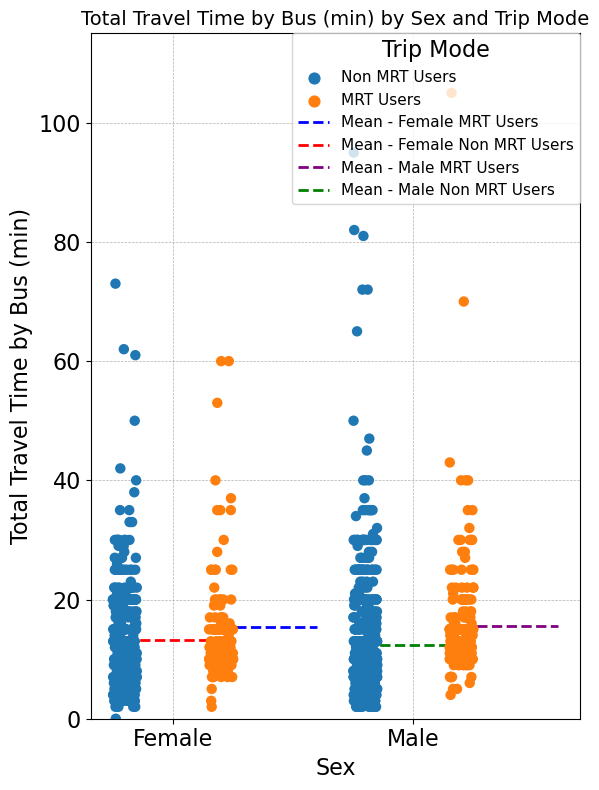

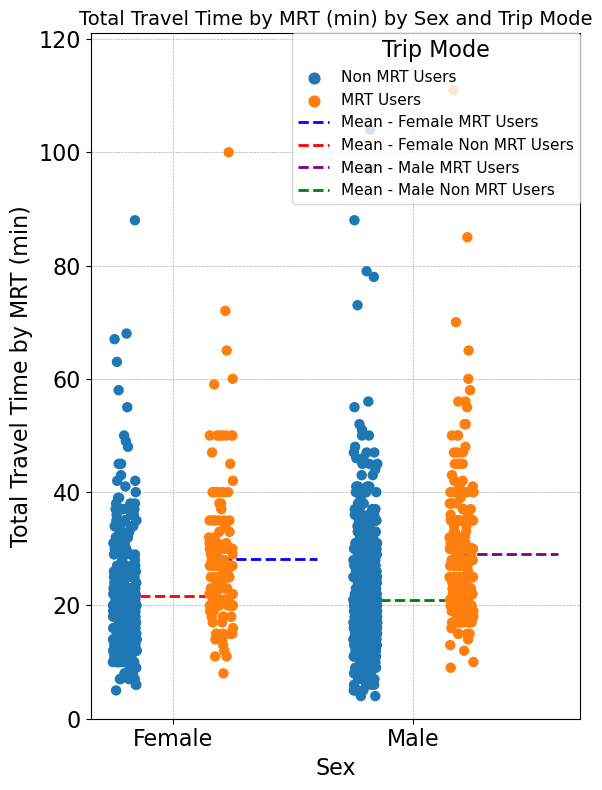

...

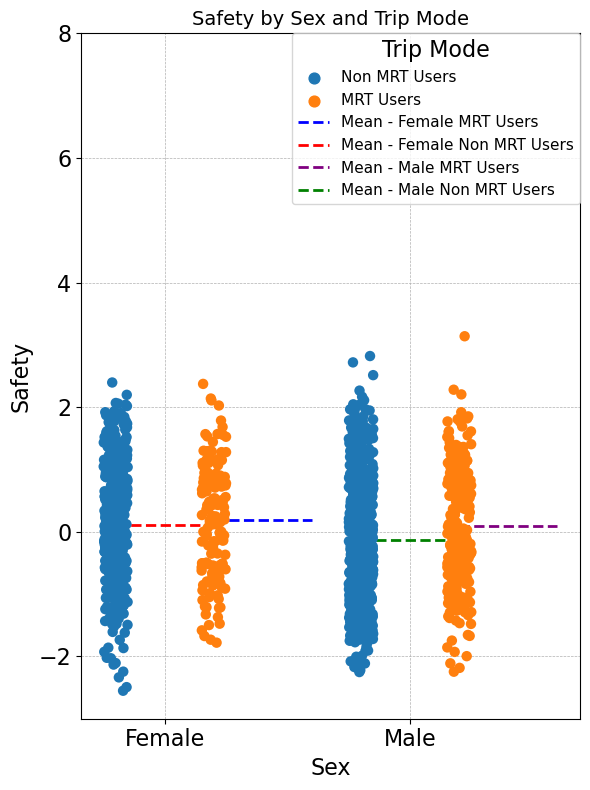

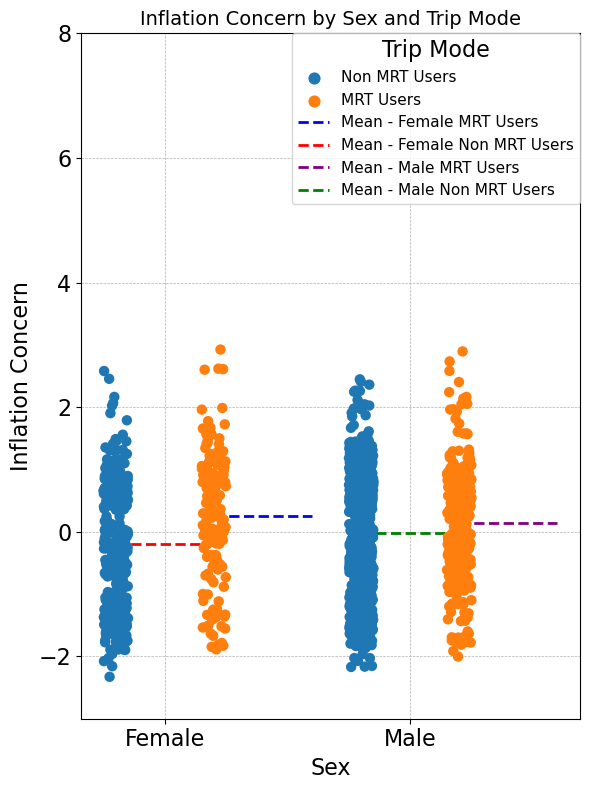

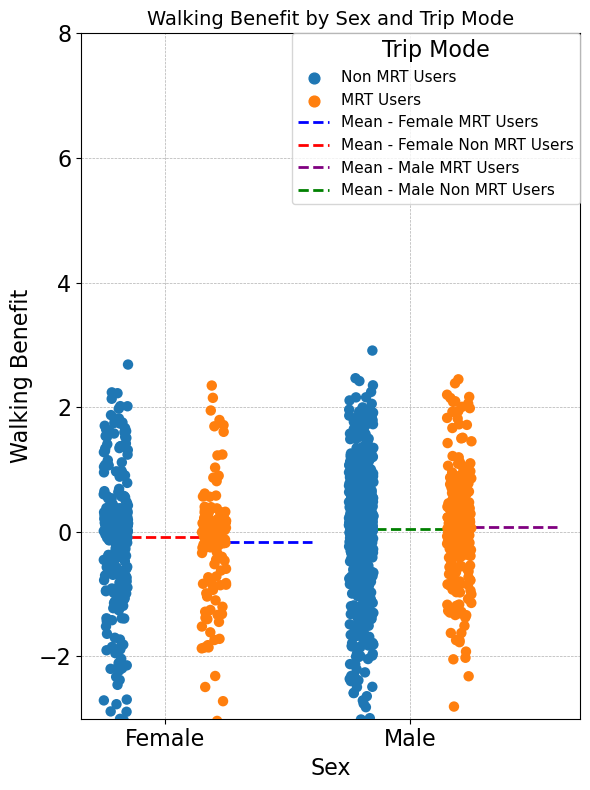

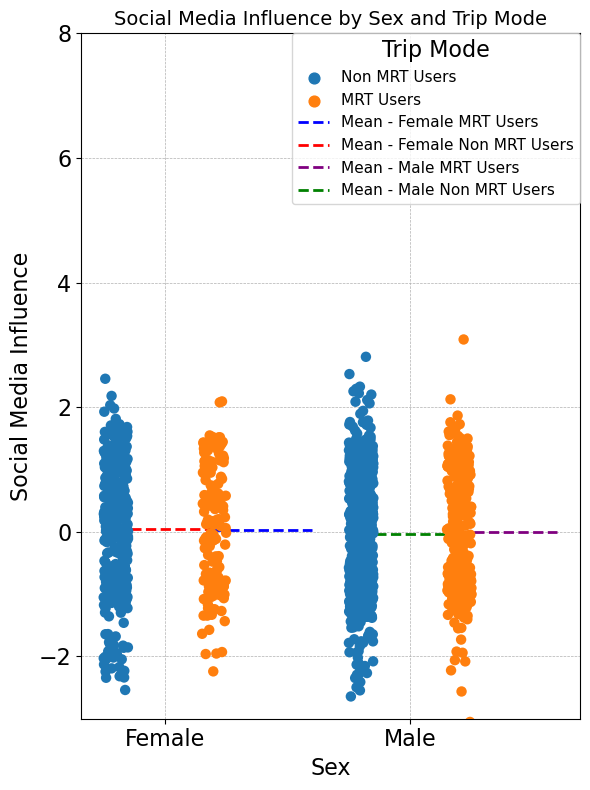

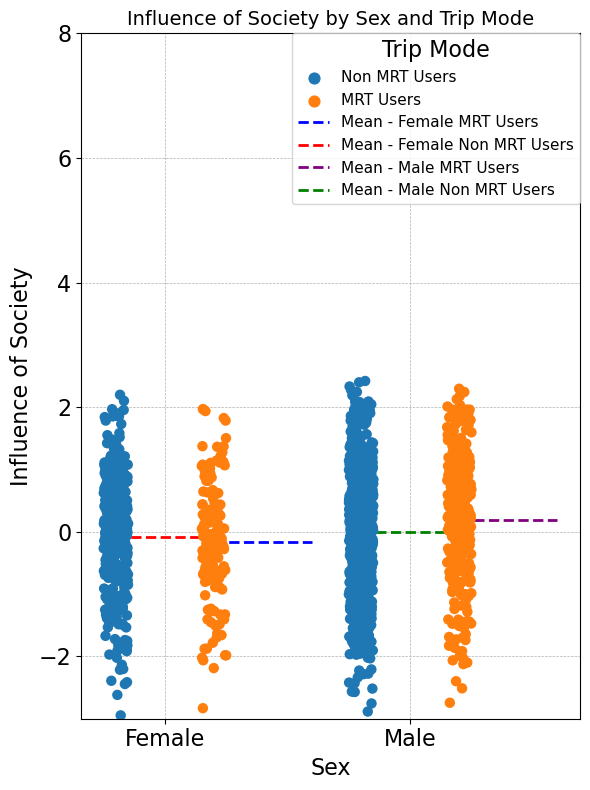

In [62]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Ensure the 'Trip Mode' column is properly created
if 'Trip Mode' not in RF_Data_1.columns:
    RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Non MRT Users', 1: 'MRT Users'})

# List of variables to replace 'Age'
variables = ['Personal_Income', 'Family_income', 'Total Distance in km', 'TT_Bus_total', 'TT_MRT_total', 'Diff_Bus&MRT_Fare', 
             'Work_cen', 'Family_incl', 'Ped_infra', 'Reliability', 'Safety', 'Inflation_conc', 
             'Walking_ben', 'Social_media', 'Social_influence']

# Corresponding y-labels
y_labels = ['Personal Income (BDT)', 'Family Income (BDT)', 'Total Distance in km','Total Travel Time by Bus (min)', 
            'Total Travel Time by MRT (min)', 'Difference between Bus and MRT Fare (BDT)', 
            'Work Centric Attitude', 'Inclination to Family', 'Pedestrian Infrastructure Perception', 
            'Reliability', 'Safety', 'Inflation Concern', 'Walking Benefit', 'Social Media Influence', 
            'Influence of Society']

# Variables with standardized scale and space for the legend
standardized_vars = ['Work_cen', 'Family_incl', 'Ped_infra', 'Reliability', 'Safety', 
                     'Inflation_conc', 'Walking_ben', 'Social_media', 'Social_influence']

# Loop through each variable and create the plot
for var, y_label in zip(variables, y_labels):
    # Check if the variable exists in the DataFrame
    if var in RF_Data_1.columns:
        plt.figure(figsize=(6, 8))  # Adjust the figure size if necessary
        strip_plot = sns.stripplot(x=RF_Data_1["Sex(F=0)"],  # Using the exact column name as it appears
                                   y=RF_Data_1[var],
                                   hue=RF_Data_1["Trip Mode"],
                                   jitter=True,
                                   dodge=True,
                                   size=7.5)  # Using dodge to separate hue categories visually

        # Add grid behind the plot
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)

        # Calculate means for each combination of 'Sex' and 'Trip Mode'
        mean_values = RF_Data_1.groupby(["Sex(F=0)", "Trip Mode"])[var].mean().reset_index()

        # Define colors for each combination for better visibility
        colors = {(0, 'Non MRT Users'): 'red', (0, 'MRT Users'): 'blue', 
                  (1, 'Non MRT Users'): 'green', (1, 'MRT Users'): 'purple'}

        # Plot the means as horizontal lines
        for index, row in mean_values.iterrows():
            plt.hlines(y=row[var], 
                       xmin=row["Sex(F=0)"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT Users' else 0)),
                       xmax=row["Sex(F=0)"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT Users' else 0)),
                       colors=colors[(row["Sex(F=0)"], row["Trip Mode"])],
                       linestyle='--',
                       linewidth=2,
                       label=f'Mean - {"Female" if row["Sex(F=0)"]==0 else "Male"} {row["Trip Mode"]}')

        # Setting labels and title
        plt.xlabel('Sex', fontsize=16)
        plt.ylabel(y_label, fontsize=16)
        plt.title(f'{y_label} by Sex and Trip Mode', fontsize=14)

        # Set custom x-axis and y-axis tick labels and their font size
        plt.xticks(ticks=[0, 1], labels=['Female', 'Male'], fontsize=16)  # Female=0, Male=1
        plt.yticks(fontsize=16)

        # Customizing the legend to be within the main diagram and setting the font size
        handles, labels = plt.gca().get_legend_handles_labels()
        by_label = dict(zip(labels, handles))  # Remove duplicates in legend
        plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='upper right', borderaxespad=0., frameon=True, fontsize=11, title_fontsize=16)

        # Set custom y-limits based on the variable
        if var == 'Personal_Income':
            plt.ylim(0, 400000)  # Custom limit for Personal Income
        elif var == 'Family_income':
            plt.ylim(0, 500000)  # Custom limit for Family Income
        elif var in standardized_vars:
            plt.ylim(-3, 8)  # Standardized scale with space for the legend
        else:
            plt.ylim(0, RF_Data_1[var].max() + 10)  # Default y-limit with margin

        # Show the plot
        plt.tight_layout()  # Adjust the layout to make room for the legend
        plt.show()
    else:
        print(f"Variable '{var}' not found in the DataFrame.")


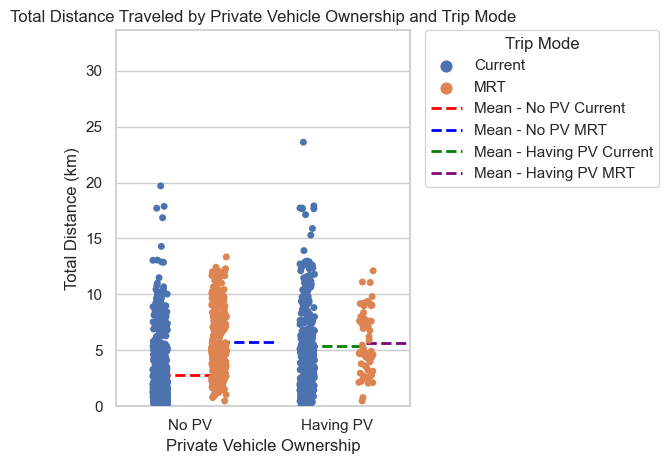

In [151]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming RF_Data_1 is already loaded as a DataFrame
# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Current', 1: 'MRT'})

strip_plot = sns.stripplot(x=RF_Data_1["Having_PV"],
                           y=RF_Data_1["Total Distance in km"],
                           hue=RF_Data_1["Trip Mode"],
                           jitter=True,
                           dodge=True)  # Using dodge to separate hue categories visually

# Calculate means for each combination of 'Having_PV' and 'Trip Mode'
mean_values = RF_Data_1.groupby(["Having_PV", "Trip Mode"])["Total Distance in km"].mean().reset_index()

# Define colors for each combination for better visibility
colors = {(0, 'Current'): 'red', (0, 'MRT'): 'blue', (1, 'Current'): 'green', (1, 'MRT'): 'purple'}

# Plot the means as horizontal lines
for index, row in mean_values.iterrows():
    plt.hlines(y=row["Total Distance in km"], 
               xmin=row["Having_PV"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               xmax=row["Having_PV"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               colors=colors[(row["Having_PV"], row["Trip Mode"])],
               linestyle='--',
               linewidth=2,
               label=f'Mean - {"No PV" if row["Having_PV"]==0 else "Having PV"} {row["Trip Mode"]}')

# Setting labels and title
plt.xlabel('Private Vehicle Ownership')
plt.ylabel('Total Distance (km)')
plt.title('Total Distance Traveled by Private Vehicle Ownership and Trip Mode')

# Set custom x-axis tick labels
plt.xticks(ticks=[0, 1], labels=['No PV', 'Having PV'])

# Customizing the legend to handle unique labels for the mean lines
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates in legend
plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Optionally, adjust plot limits or aesthetic elements
plt.xlim(-.5, 1.5)  # Adjust to ensure all groups are fully visible
plt.ylim(0, RF_Data_1["Total Distance in km"].max() + 10)  # Ensure the upper limit is above the highest data point
# Show the plot
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()


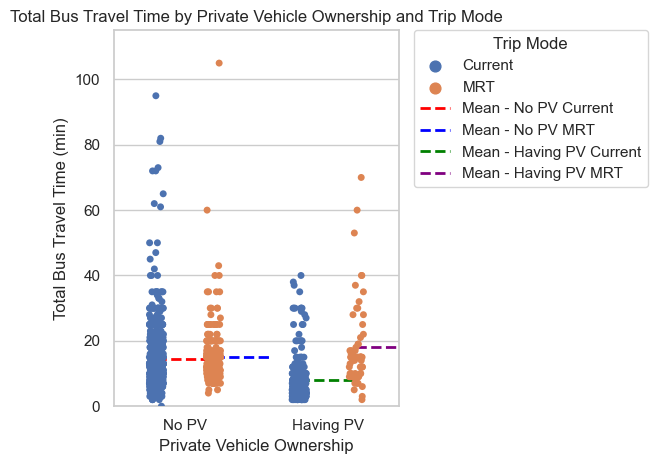

In [154]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming RF_Data_1 is already loaded as a DataFrame
# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Current', 1: 'MRT'})

strip_plot = sns.stripplot(x=RF_Data_1["Having_PV"],
                           y=RF_Data_1["TT_Bus_total"],
                           hue=RF_Data_1["Trip Mode"],
                           jitter=True,
                           dodge=True)  # Using dodge to separate hue categories visually

# Calculate means for each combination of 'Having_PV' and 'Trip Mode'
mean_values = RF_Data_1.groupby(["Having_PV", "Trip Mode"])["TT_Bus_total"].mean().reset_index()

# Define colors for each combination for better visibility
colors = {(0, 'Current'): 'red', (0, 'MRT'): 'blue', (1, 'Current'): 'green', (1, 'MRT'): 'purple'}

# Plot the means as horizontal lines
for index, row in mean_values.iterrows():
    plt.hlines(y=row["TT_Bus_total"], 
               xmin=row["Having_PV"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               xmax=row["Having_PV"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               colors=colors[(row["Having_PV"], row["Trip Mode"])],
               linestyle='--',
               linewidth=2,
               label=f'Mean - {"No PV" if row["Having_PV"]==0 else "Having PV"} {row["Trip Mode"]}')

# Setting labels and title
plt.xlabel('Private Vehicle Ownership')
plt.ylabel('Total Bus Travel Time (min)')
plt.title('Total Bus Travel Time by Private Vehicle Ownership and Trip Mode')

# Set custom x-axis tick labels
plt.xticks(ticks=[0, 1], labels=['No PV', 'Having PV'])

# Customizing the legend to handle unique labels for the mean lines
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates in legend
plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Optionally, adjust plot limits or aesthetic elements
plt.xlim(-.5, 1.5)  # Adjust to ensure all groups are fully visible
plt.ylim(0, RF_Data_1["TT_Bus_total"].max() + 10)  # Ensure the upper limit is above the highest data point
# Show the plot
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()


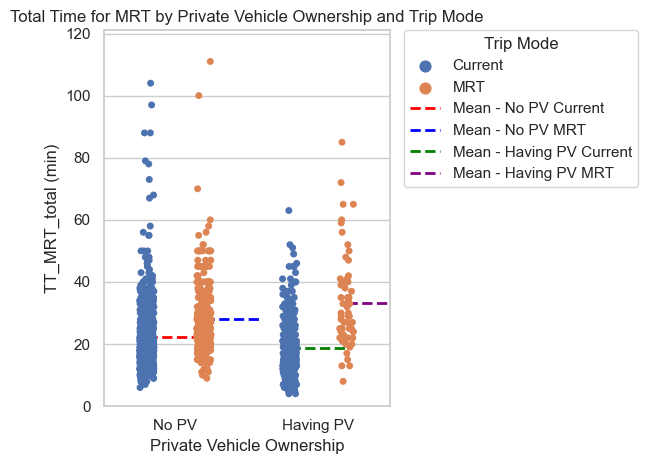

In [170]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming RF_Data_1 is already loaded as a DataFrame
# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Current', 1: 'MRT'})

strip_plot = sns.stripplot(x=RF_Data_1["Having_PV"],
                           y=RF_Data_1["TT_MRT_total"],
                           hue=RF_Data_1["Trip Mode"],
                           jitter=True,
                           dodge=True)  # Using dodge to separate hue categories visually

# Calculate means for each combination of 'Having_PV' and 'Trip Mode'
mean_values = RF_Data_1.groupby(["Having_PV", "Trip Mode"])["TT_MRT_total"].mean().reset_index()

# Define colors for each combination for better visibility
colors = {(0, 'Current'): 'red', (0, 'MRT'): 'blue', (1, 'Current'): 'green', (1, 'MRT'): 'purple'}

# Plot the means as horizontal lines
for index, row in mean_values.iterrows():
    plt.hlines(y=row["TT_MRT_total"], 
               xmin=row["Having_PV"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               xmax=row["Having_PV"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               colors=colors[(row["Having_PV"], row["Trip Mode"])],
               linestyle='--',
               linewidth=2,
               label=f'Mean - {"No PV" if row["Having_PV"]==0 else "Having PV"} {row["Trip Mode"]}')

# Setting labels and title
plt.xlabel('Private Vehicle Ownership')
plt.ylabel('TT_MRT_total (min)')
plt.title('Total Time for MRT by Private Vehicle Ownership and Trip Mode')

# Set custom x-axis tick labels
plt.xticks(ticks=[0, 1], labels=['No PV', 'Having PV'])

# Customizing the legend to handle unique labels for the mean lines
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates in legend
plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Optionally, adjust plot limits or aesthetic elements
plt.xlim(-.5, 1.5)  # Adjust to ensure all groups are fully visible
plt.ylim(0, RF_Data_1["TT_MRT_total"].max() + 10)  # Ensure the upper limit is above the highest data point
# Show the plot
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()


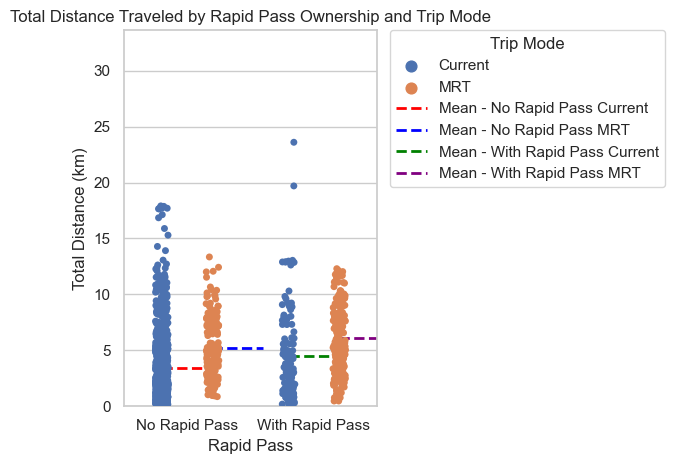

In [195]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming RF_Data_1 is already loaded as a DataFrame
# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Current', 1: 'MRT'})

# Stripplot using 'Rapid Pass' instead of 'MRT_Pass'
strip_plot = sns.stripplot(x=RF_Data_1["Rapid pass"],
                           y=RF_Data_1["Total Distance in km"],
                           hue=RF_Data_1["Trip Mode"],
                           jitter=True,
                           dodge=True)  # Using dodge to separate hue categories visually

# Calculate means for each combination of 'Rapid_Pass' and 'Trip Mode'
mean_values = RF_Data_1.groupby(["Rapid pass", "Trip Mode"])["Total Distance in km"].mean().reset_index()

# Define colors for each combination for better visibility
colors = {(0, 'Current'): 'red', (0, 'MRT'): 'blue', (1, 'Current'): 'green', (1, 'MRT'): 'purple'}

# Plot the means as horizontal lines
for index, row in mean_values.iterrows():
    plt.hlines(y=row["Total Distance in km"], 
               xmin=row["Rapid pass"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               xmax=row["Rapid pass"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               colors=colors[(row["Rapid pass"], row["Trip Mode"])],
               linestyle='--',
               linewidth=2,
               label=f'Mean - {"No Rapid Pass" if row["Rapid pass"]==0 else "With Rapid Pass"} {row["Trip Mode"]}')

# Setting labels and title
plt.xlabel('Rapid Pass')
plt.ylabel('Total Distance (km)')
plt.title('Total Distance Traveled by Rapid Pass Ownership and Trip Mode')

# Set custom x-axis tick labels
plt.xticks(ticks=[0, 1], labels=['No Rapid Pass', 'With Rapid Pass'])

# Customizing the legend to handle unique labels for the mean lines
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates in legend
plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Optionally, adjust plot limits or aesthetic elements
plt.xlim(-.5, 1.5)  # Adjust to ensure all groups are fully visible
plt.ylim(0, RF_Data_1["Total Distance in km"].max() + 10)  # Ensure the upper limit is above the highest data point

# Show the plot
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()


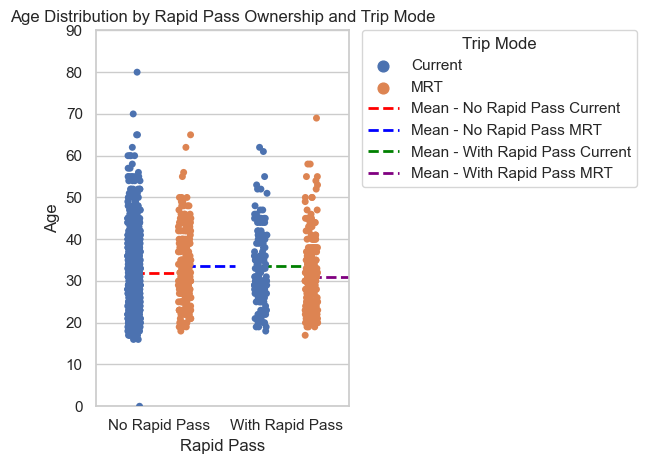

In [197]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming RF_Data_1 is already loaded as a DataFrame
# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Current', 1: 'MRT'})

# Stripplot using 'Rapid Pass' instead of 'MRT_Pass'
strip_plot = sns.stripplot(x=RF_Data_1["Rapid pass"],
                           y=RF_Data_1["AgeC"],
                           hue=RF_Data_1["Trip Mode"],
                           jitter=True,
                           dodge=True)  # Using dodge to separate hue categories visually

# Calculate means for each combination of 'Rapid_Pass' and 'Trip Mode'
mean_values = RF_Data_1.groupby(["Rapid pass", "Trip Mode"])["AgeC"].mean().reset_index()

# Define colors for each combination for better visibility
colors = {(0, 'Current'): 'red', (0, 'MRT'): 'blue', (1, 'Current'): 'green', (1, 'MRT'): 'purple'}

# Plot the means as horizontal lines
for index, row in mean_values.iterrows():
    plt.hlines(y=row["AgeC"], 
               xmin=row["Rapid pass"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               xmax=row["Rapid pass"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               colors=colors[(row["Rapid pass"], row["Trip Mode"])],
               linestyle='--',
               linewidth=2,
               label=f'Mean - {"No Rapid Pass" if row["Rapid pass"]==0 else "With Rapid Pass"} {row["Trip Mode"]}')

# Setting labels and title
plt.xlabel('Rapid Pass')
plt.ylabel('Age')
plt.title('Age Distribution by Rapid Pass Ownership and Trip Mode')

# Set custom x-axis tick labels
plt.xticks(ticks=[0, 1], labels=['No Rapid Pass', 'With Rapid Pass'])

# Customizing the legend to handle unique labels for the mean lines
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates in legend
plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Optionally, adjust plot limits or aesthetic elements
plt.xlim(-.5, 1.5)  # Adjust to ensure all groups are fully visible
plt.ylim(0, RF_Data_1["AgeC"].max() + 10)  # Ensure the upper limit is above the highest data point

# Show the plot
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()


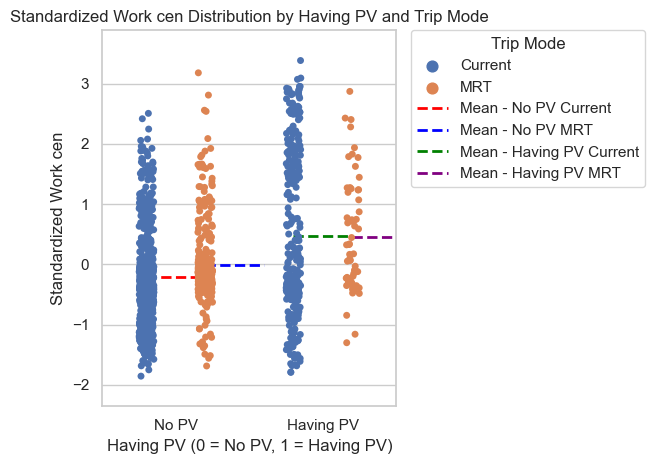

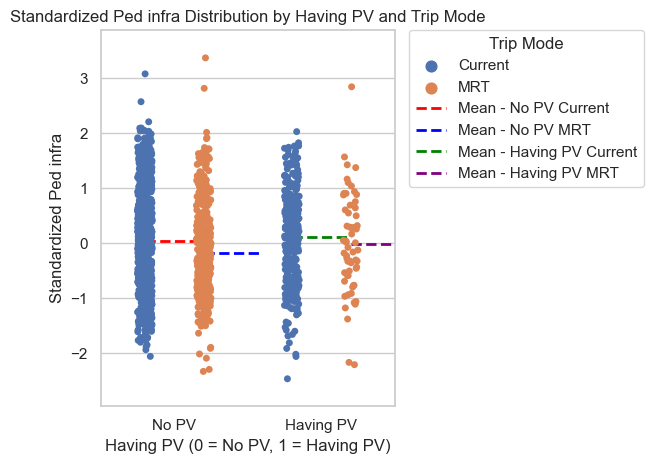

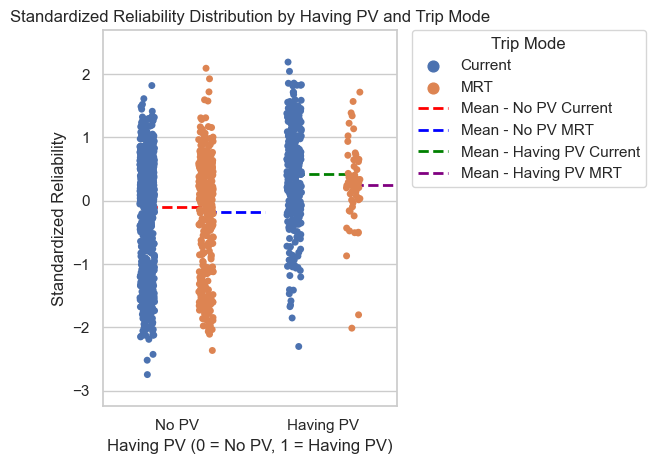

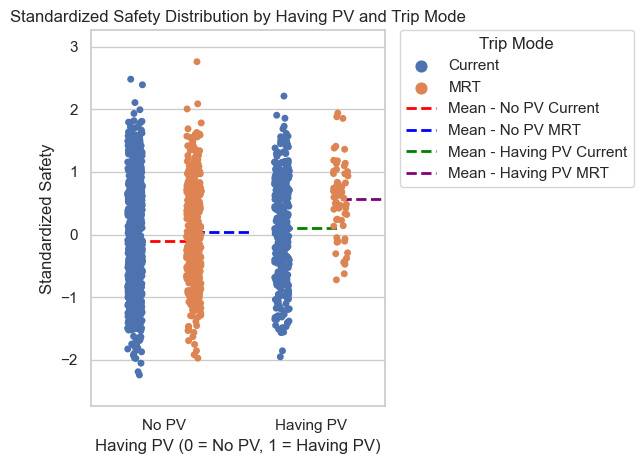

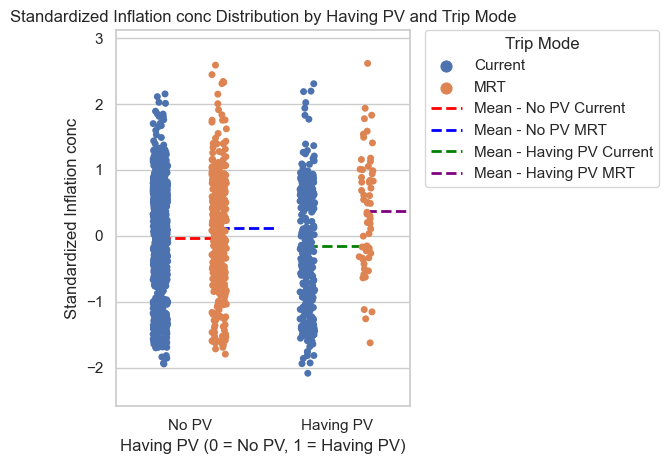

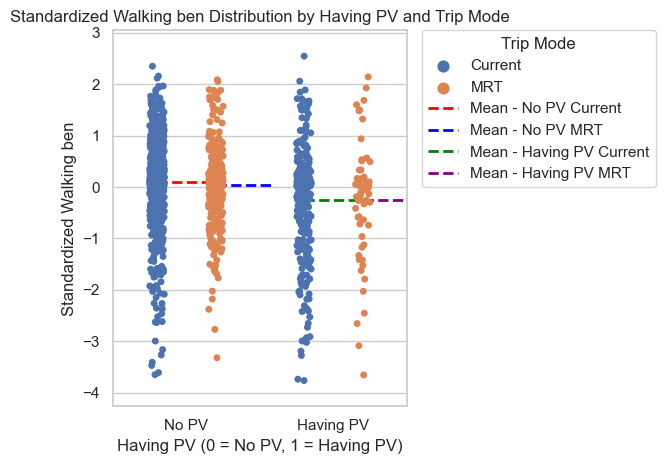

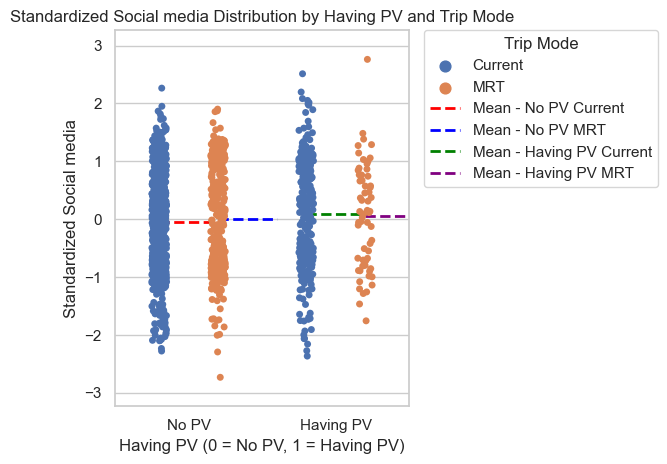

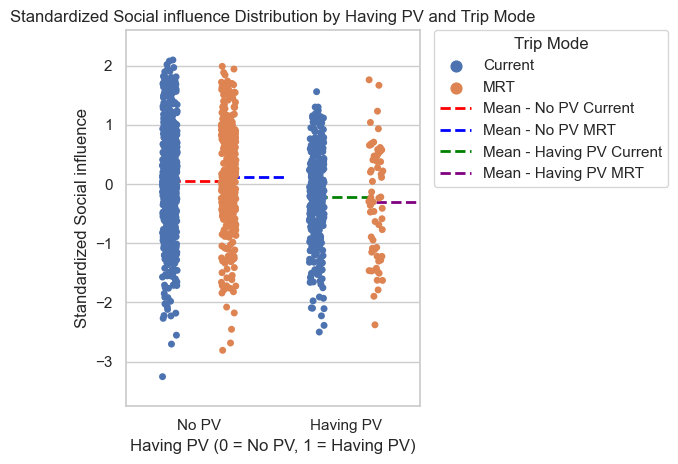

In [169]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming RF_Data_1 is already loaded as a DataFrame
# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Current', 1: 'MRT'})

# List of variables to plot
variables = ["Work_cen","Ped_infra", "Reliability", "Safety", "Inflation_conc", "Walking_ben", "Social_media", "Social_influence"]

# Define colors for the combinations
colors = {(0, 'Current'): 'red', (0, 'MRT'): 'blue', (1, 'Current'): 'green', (1, 'MRT'): 'purple'}

# Iterate over the variables and create a plot for each
for variable in variables:
    strip_plot = sns.stripplot(
        x=RF_Data_1["Having_PV"],
        y=RF_Data_1[variable],
        hue=RF_Data_1["Trip Mode"],
        jitter=True,
        dodge=True  # Using dodge to separate hue categories visually
    )

    # Calculate means for each combination of 'Having_PV' and 'Trip Mode'
    mean_values = RF_Data_1.groupby(["Having_PV", "Trip Mode"])[variable].mean().reset_index()

    # Plot the means as horizontal lines
    for index, row in mean_values.iterrows():
        plt.hlines(
            y=row[variable],
            xmin=row["Having_PV"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
            xmax=row["Having_PV"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
            colors=colors[(row["Having_PV"], row["Trip Mode"])],
            linestyle='--',
            linewidth=2,
            label=f'Mean - {"No PV" if row["Having_PV"] == 0 else "Having PV"} {row["Trip Mode"]}'
        )

    # Setting labels and title
    plt.xlabel('Having PV (0 = No PV, 1 = Having PV)')
    plt.ylabel(f'Standardized {variable.replace("_", " ")}')
    plt.title(f'Standardized {variable.replace("_", " ")} Distribution by Having PV and Trip Mode')

    # Set custom x-axis tick labels
    plt.xticks(ticks=[0, 1], labels=['No PV', 'Having PV'])

    # Customizing the legend to handle unique labels for the mean lines
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))  # Remove duplicates in legend
    plt.legend(
        by_label.values(),
        by_label.keys(),
        title='Trip Mode',
        loc='best',
        bbox_to_anchor=(1.05, 1),
        borderaxespad=0.
    )

    # Optionally, adjust plot limits or aesthetic elements
    plt.xlim(-0.5, 1.5)  # Adjust to ensure all groups are fully visible
    plt.ylim(
        RF_Data_1[variable].min() - 0.5,
        RF_Data_1[variable].max() + 0.5
    )  # Adjust the limits to slightly beyond the actual data range

    # Show the plot
    plt.tight_layout()  # Adjust the layout to make room for the legend
    plt.show()


In [64]:
RF_Data_1= pd.read_csv("D:\MSC thesis\MSc_Thesis_Sept_07_Stats.csv")
RF_Data_1

,Average of Total Waiting Time,Column Labels,Unnamed: 2,Unnamed: 3
0,Row Labels,0.000000,1.000000,Grand Total
1,0,6.043571,6.698630,6.167241379
2,1,4.828125,8.693333,7.291784703
3,Grand Total,5.898036,7.709459,6.429610046


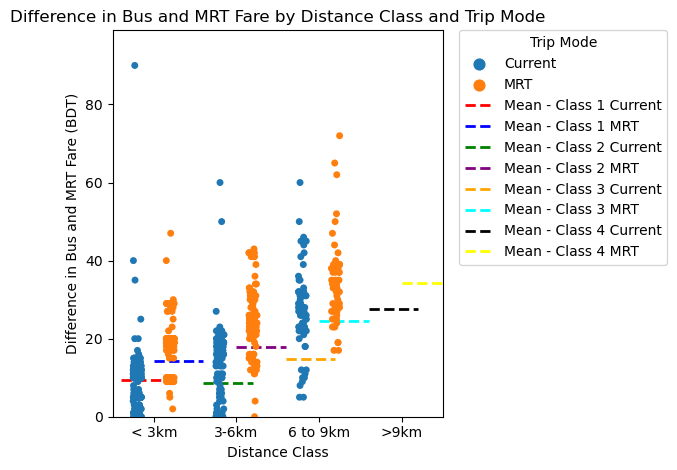

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd



# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Current', 1: 'MRT'})

# Plotting the stripplot
strip_plot = sns.stripplot(x=RF_Data_1["Distan_3km"],
                           y=RF_Data_1["Diff_Bus&MRT_Fare"],
                           hue=RF_Data_1["Trip Mode"],
                           jitter=True,
                           dodge=True)  # Using dodge to separate hue categories visually

# Calculate means for each combination of 'Distan_3km' and 'Trip Mode'
mean_values = RF_Data_1.groupby(["Distan_3km", "Trip Mode"])["Diff_Bus&MRT_Fare"].mean().reset_index()

# Define colors for each combination for better visibility
colors = {(1, 'Current'): 'red', (1, 'MRT'): 'blue', 
          (2, 'Current'): 'green', (2, 'MRT'): 'purple', 
          (3, 'Current'): 'orange', (3, 'MRT'): 'cyan',
          (4, 'Current'): 'black', (4, 'MRT'): 'yellow'}

# Plot the means as horizontal lines
for index, row in mean_values.iterrows():
    plt.hlines(y=row["Diff_Bus&MRT_Fare"], 
               xmin=row["Distan_3km"] - 0.4 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               xmax=row["Distan_3km"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               colors=colors[(row["Distan_3km"], row["Trip Mode"])],
               linestyle='--',
               linewidth=2,
               label=f'Mean - Class {row["Distan_3km"]} {row["Trip Mode"]}')

# Setting labels and title
plt.xlabel('Distance Class')
plt.ylabel('Difference in Bus and MRT Fare (BDT)')
plt.title('Difference in Bus and MRT Fare by Distance Class and Trip Mode')

# Set custom x-axis tick labels
plt.xticks(ticks=[1, 2, 3, 4], labels=['< 3km', '3-6km', '6 to 9km', '>9km'])

# Customizing the legend to handle unique labels for the mean lines
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates in legend
plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Adjust plot limits and display the plot
plt.xlim(0.5, 4.5)  # Adjust to ensure all groups are fully visible
plt.ylim(0, max(RF_Data_1["Diff_Bus&MRT_Fare"]) * 1.1)  # Adjust to fit the range of Diff_Bus&MRT_Fare

# Show the plot
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()


In [77]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd



# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Current', 1: 'MRT'})

# Plotting the stripplot
strip_plot = sns.stripplot(x=RF_Data_1["Distan_3km"],
                           y=RF_Data_1["Diff_Bus&MRT_Fare"],
                           hue=RF_Data_1["Trip Mode"],
                           jitter=True,
                           dodge=True)  # Using dodge to separate hue categories visually

# Calculate means for each combination of 'Distan_3km' and 'Trip Mode'
mean_values = RF_Data_1.groupby(["Distan_3km", "Trip Mode"])["Diff_Bus&MRT_Fare"].mean().reset_index()

# Define colors for each combination for better visibility
colors = {(1, 'Current'): 'red', (1, 'MRT'): 'blue', 
          (2, 'Current'): 'green', (2, 'MRT'): 'purple', 
          (3, 'Current'): 'orange', (3, 'MRT'): 'cyan',
          (4, 'Current'): 'black', (4, 'MRT'): 'yellow'}

# Plot the means as horizontal lines
for index, row in mean_values.iterrows():
    plt.hlines(y=row["Diff_Bus&MRT_Fare"], 
               xmin=row["Distan_3km"] - 0.4 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               xmax=row["Distan_3km"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
               colors=colors[(row["Distan_3km"], row["Trip Mode"])],
               linestyle='--',
               linewidth=2,
               label=f'Mean - Class {row["Distan_3km"]} {row["Trip Mode"]}')

# Setting labels and title
plt.xlabel('Distance Class')
plt.ylabel('Difference in Bus and MRT Fare (BDT)')
plt.title('Difference in Bus and MRT Fare by Distance Class and Trip Mode')

# Set custom x-axis tick labels
plt.xticks(ticks=[1, 2, 3, 4], labels=['< 3km', '3-6km', '6 to 9km', '>9km'])

# Customizing the legend to handle unique labels for the mean lines
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates in legend
plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Adjust plot limits and display the plot
plt.xlim(0.5, 4.5)  # Adjust to ensure all groups are fully visible
plt.ylim(0, max(RF_Data_1["Diff_Bus&MRT_Fare"]) * 1.1)  # Adjust to fit the range of Diff_Bus&MRT_Fare

# Show the plot
plt.tight_layout()  # Adjust the layout to make room for the legend
plt.show()


KeyError: 'Distan_3km'

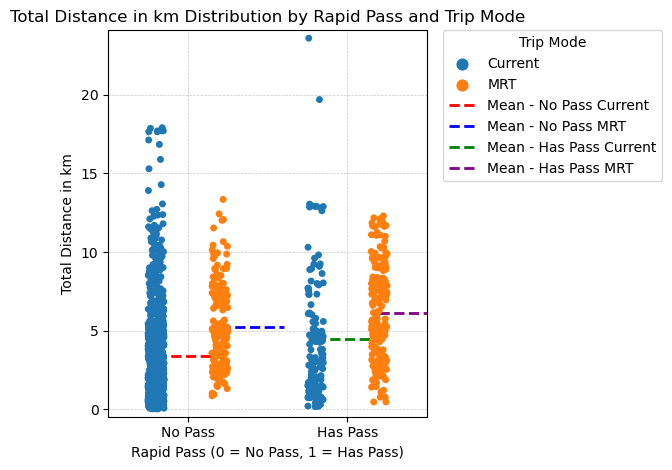

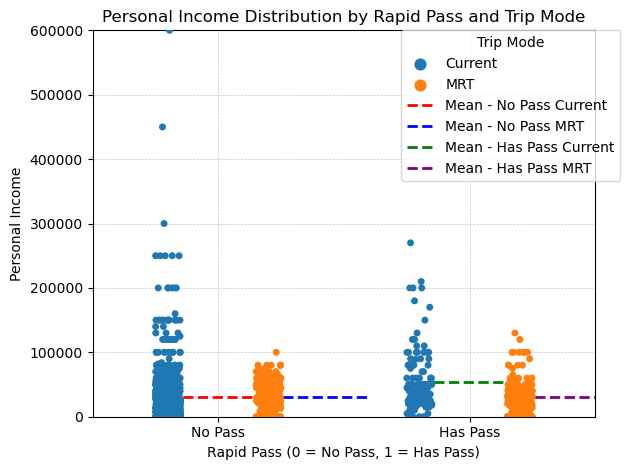

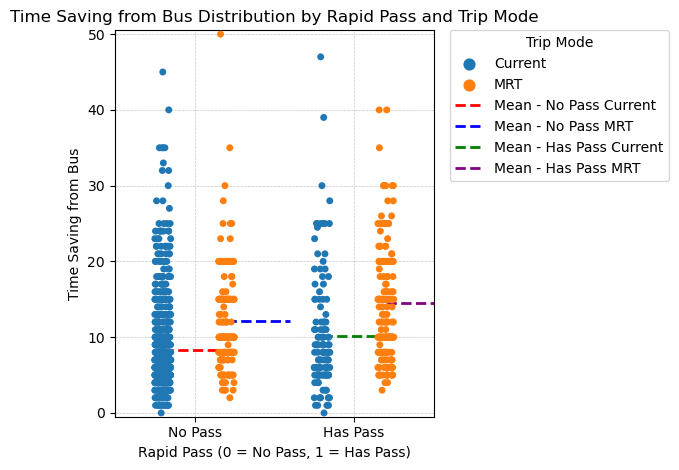

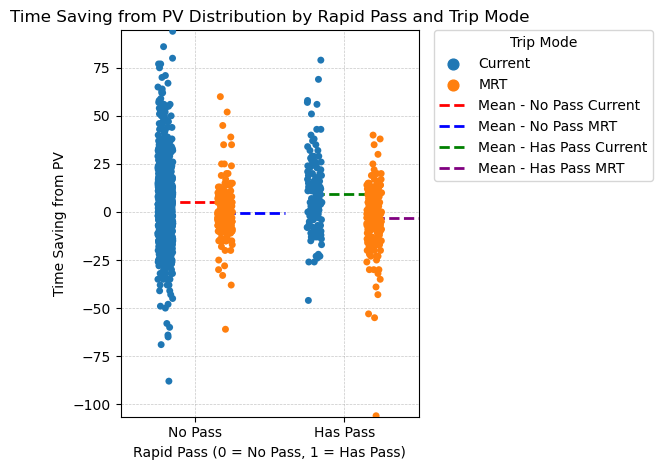

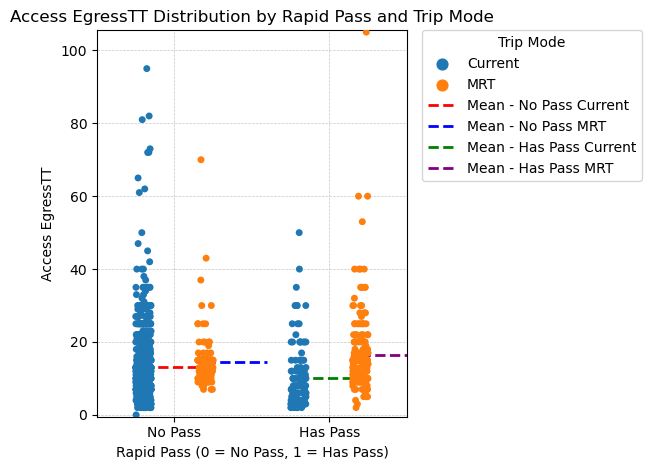

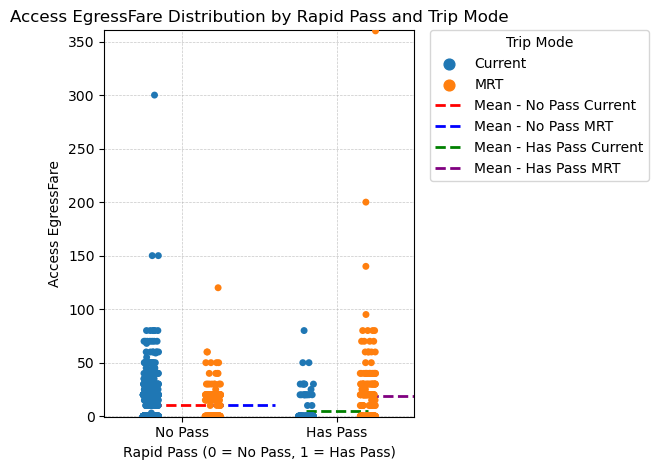

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming RF_Data_1 is already loaded as a DataFrame
# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Current', 1: 'MRT'})

# List of variables to plot
variables = ["Total Distance in km", "Personal_Income", "Time Saving from Bus", "Time Saving from PV", "Access_EgressTT", "Access_EgressFare"]

# Define colors for the combinations
colors = {(0, 'Current'): 'red', (0, 'MRT'): 'blue', (1, 'Current'): 'green', (1, 'MRT'): 'purple'}

# Iterate over the variables and create a plot for each
for variable in variables:
    strip_plot = sns.stripplot(x=RF_Data_1["Rapid pass"],
                               y=RF_Data_1[variable],
                               hue=RF_Data_1["Trip Mode"],
                               jitter=True,
                               dodge=True)  # Using dodge to separate hue categories visually

    # Calculate means for each combination of 'Rapid pass' and 'Trip Mode'
    mean_values = RF_Data_1.groupby(["Rapid pass", "Trip Mode"])[variable].mean().reset_index()

    # Plot the means as horizontal lines
    for index, row in mean_values.iterrows():
        plt.hlines(y=row[variable], 
                   xmin=row["Rapid pass"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
                   xmax=row["Rapid pass"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
                   colors=colors[(row["Rapid pass"], row["Trip Mode"])],
                   linestyle='--',
                   linewidth=2,
                   label=f'Mean - {"No Pass" if row["Rapid pass"]==0 else "Has Pass"} {row["Trip Mode"]}')

    # Setting labels and title
    plt.xlabel('Rapid Pass (0 = No Pass, 1 = Has Pass)')
    plt.ylabel(f'{variable.replace("_", " ")}')
    plt.title(f'{variable.replace("_", " ")} Distribution by Rapid Pass and Trip Mode')

    # Set custom x-axis tick labels
    plt.xticks(ticks=[0, 1], labels=['No Pass', 'Has Pass'])

    # Add grid lines
    plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)  # Customize grid lines as needed

    # Customizing the legend to handle unique labels for the mean lines
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))  # Remove duplicates in legend
    plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

    # Optionally, adjust plot limits or aesthetic elements
    plt.xlim(-.5, 1.5)  # Adjust to ensure all groups are fully visible
    plt.ylim(RF_Data_1[variable].min() - 0.5, RF_Data_1[variable].max() + 0.5)  # Adjust the limits to slightly beyond the actual data range

    # Show the plot
    plt.tight_layout()  # Adjust the layout to make room for the legend
    plt.show()


In [10]:
# Check the unique values and their counts in the Distance_Class column
print(RF_Data_1['Distance_Class'].value_counts())

# Specifically check for entries in the 3 and 4 Distance_Class
print(RF_Data_1[RF_Data_1['Distance_Class'] == 3])
print(RF_Data_1[RF_Data_1['Distance_Class'] == 4])

# If found, check their corresponding 'Diff_Bus&MRT_Fare' values
if 3 in RF_Data_1['Distance_Class'].values:
    print("Data for 6 to 9 km:", RF_Data_1[RF_Data_1['Distance_Class'] == 3]['Diff_Bus&MRT_Fare'])
if 4 in RF_Data_1['Distance_Class'].values:
    print("Data for >9 km:", RF_Data_1[RF_Data_1['Distance_Class'] == 4]['Diff_Bus&MRT_Fare'])


Distance_Class
1    1005
2     422
3      86
Name: count, dtype: int64
      Response ID  AgeC  Age  Sex(F=0)  EmpS_Full time Worker  \
2             201    80    5         1                      0   
4             207    60    5         1                      0   
5             208    29    2         0                      1   
6             210    60    5         0                      0   
18            231    19    1         0                      0   
...           ...   ...  ...       ...                    ...   
1485         2165    35    3         1                      1   
1487         2167    35    3         0                      1   
1488         2168    37    3         1                      1   
1497         2177    38    3         1                      1   
1500         2180    22    1         0                      0   

      EmpS_Hybrid (Can work at home or at office)  Emps_Others  \
2                                               0            1   
4               

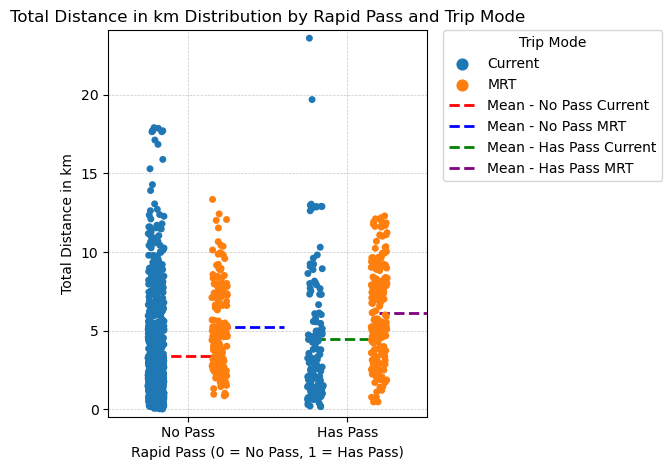

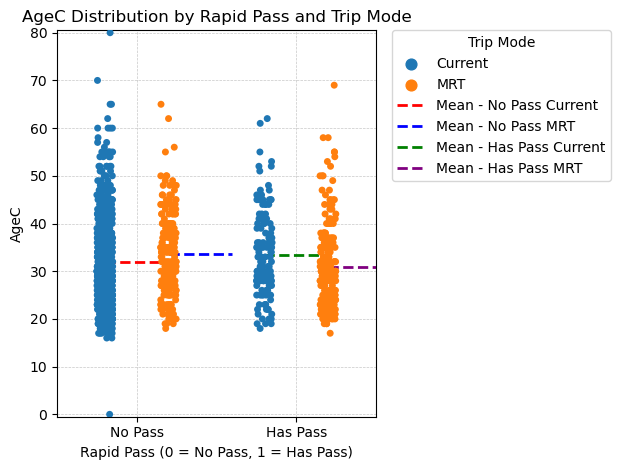

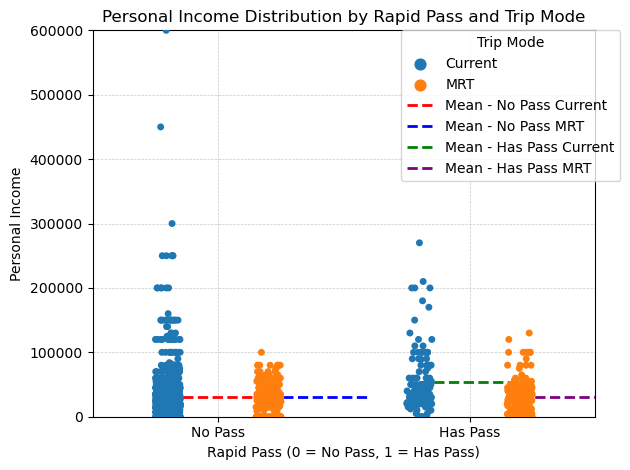

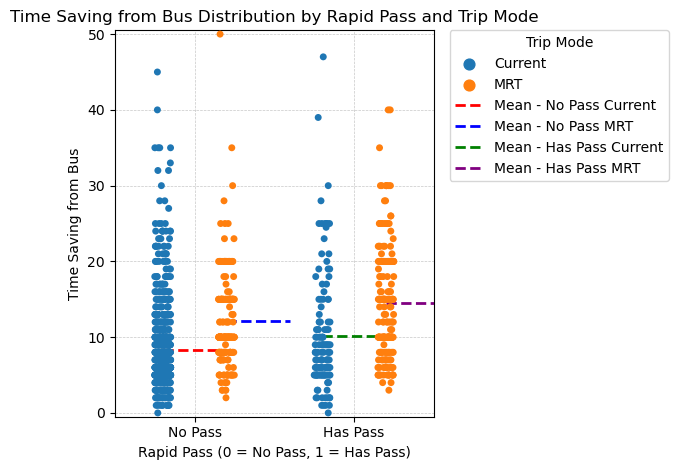

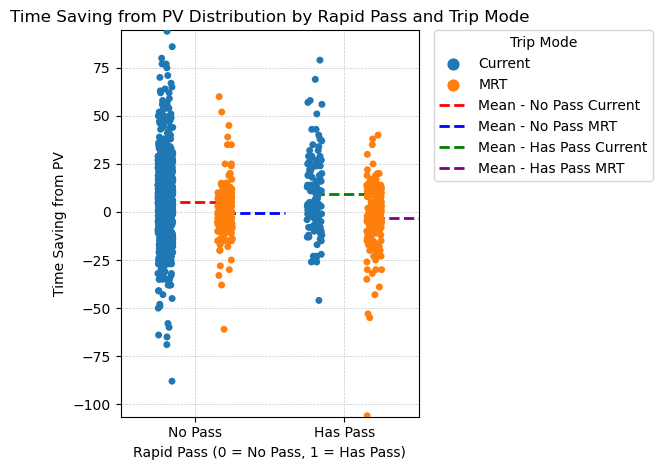

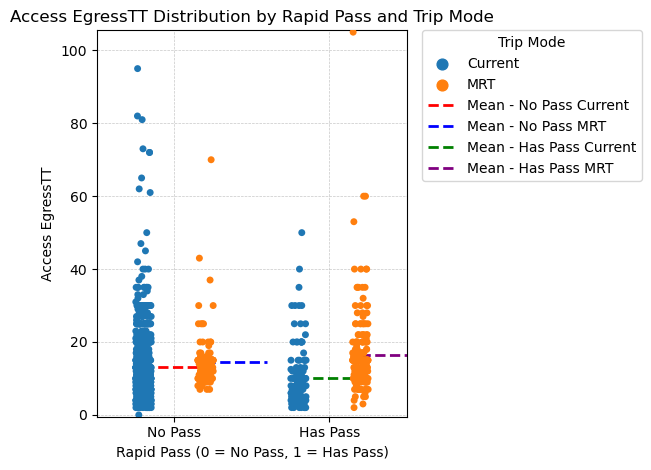

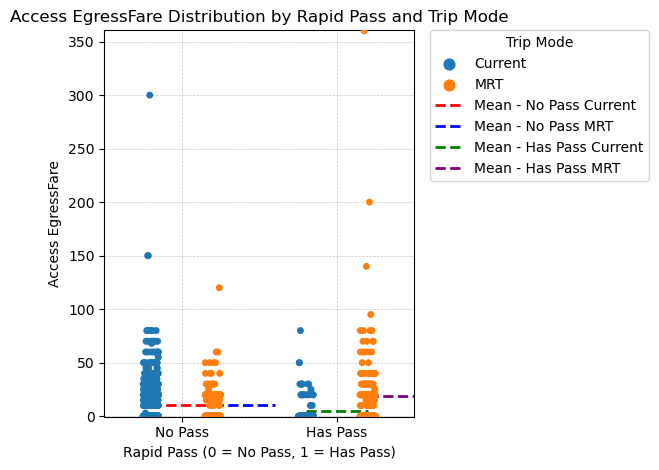

In [31]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming RF_Data_1 is already loaded as a DataFrame
# Transforming the 'Trip 2 (MRT=1, others=0)' column to categorical labels for clarity
RF_Data_1['Trip Mode'] = RF_Data_1['Trip 2 (MRT=1, others=0)'].map({0: 'Current', 1: 'MRT'})

# List of variables to plot
variables = ["Total Distance in km", "AgeC", "Personal_Income", "Time Saving from Bus", "Time Saving from PV", "Access_EgressTT", "Access_EgressFare"]

# Define colors for the combinations
colors = {(0, 'Current'): 'red', (0, 'MRT'): 'blue', (1, 'Current'): 'green', (1, 'MRT'): 'purple'}

# Iterate over the variables and create a plot for each
for variable in variables:
    strip_plot = sns.stripplot(x=RF_Data_1["Rapid pass"],
                               y=RF_Data_1[variable],
                               hue=RF_Data_1["Trip Mode"],
                               jitter=True,
                               dodge=True)  # Using dodge to separate hue categories visually

    # Calculate means for each combination of 'Rapid pass' and 'Trip Mode'
    mean_values = RF_Data_1.groupby(["Rapid pass", "Trip Mode"])[variable].mean().reset_index()

    # Plot the means as horizontal lines
    for index, row in mean_values.iterrows():
        plt.hlines(y=row[variable], 
                   xmin=row["Rapid pass"] - 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
                   xmax=row["Rapid pass"] + 0.2 + (0.4 * (1 if row["Trip Mode"] == 'MRT' else 0)),
                   colors=colors[(row["Rapid pass"], row["Trip Mode"])],
                   linestyle='--',
                   linewidth=2,
                   label=f'Mean - {"No Rapid Pass" if row["Rapid pass"]==0 else "Having a Pass"} {row["Trip Mode"]}')

    # Setting labels and title
    plt.xlabel('Rapid Pass (0 = No Rapid Pass, 1 = Having a Pass)')
    plt.ylabel(f'{variable.replace("_", " ")}')
    plt.title(f'{variable.replace("_", " ")} Distribution by Rapid Pass and Trip Mode')

    # Set custom x-axis tick labels
    plt.xticks(ticks=[0, 1], labels=['No Rapid Pass', 'Having a Pass'])

    # Customizing the legend to handle unique labels for the mean lines
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))  # Remove duplicates in legend
    plt.legend(by_label.values(), by_label.keys(), title='Trip Mode', loc='best', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

    # Optionally, adjust plot limits or aesthetic elements
    plt.xlim(-.5, 1.5)  # Adjust to ensure all groups are fully visible
    plt.ylim(RF_Data_1[variable].min() - 0.5, RF_Data_1[variable].max() + 0.5)  # Adjust the limits to slightly beyond the actual data range

    # Show the plot
    plt.tight_layout()  # Adjust the layout to make room for the legend
    plt.show()


In [3]:
RF_Data_2= pd.read_csv("D:\MSC thesis\MSc_Thesis_Sept_07_excel_CSV_sankey.csv")

RF_Data_2

,Response ID,AgeC,Age,Sex(F=0),EmpS_Full time Worker,EmpS_Hybrid (Can work at home or at office),Emps_Others,EmpS_Part Time,EmpS_Student,EmpS_Work at home (Full-time),EmpS_Work at home (Part-time),Rapid pass,last educational degree,H_size,EarningFM,Personal_Income,Family_income,Family_income_1,Total Distance for access trip,Total Distance in km,"Trip 1 (MRT=1, others=0)","Trip 2 (MRT=1, others=0)","Trip 3 (MRT=1, others=0)",Work_cen,Family_incl,Ped_infra,Reliability,Safety,Inflation_conc,Walking_ben,Social_media,Social_influence,Age<35,Age<45,Age<55,Age<65,One_PV,Greater_Than_One_PV,Total Waiting Time,Fare_Current_total,TT_Current_total,distance_500m,Very Flexible,Somewhat Flexible,Fare_Bus_total,Fare_MRT_total,Ttmain_PV,TT_Bus_total,TT_MRT_total,TT_Bus_only,TT_MRT_only,Access_EgressFare,Access_EgressTT,Fare_Bus_only,Fare_MRT_only,Diff_Bus&MRT_Fare,AvailablePV,Having_PV,Distance_Class,Travel Mode Now,Travel Mode Before
0,197,18,1,1,0,0,0,0,0,0,0,0,2,2,1,13000,30000,2,0.000000,5.043623,0,0,0,-0.451608,-0.725676,0.478245,-1.737065,-0.291624,1.672757,1.630345,0.437112,-2.222020,0,0,0,0,0,0,10,10,50.0,1,1,0,10,25,35,20.0,33,53.0,13.000000,0,20.0,10,25,15,0,0,2,Bus,Bus
1,199,42,3,0,0,1,0,0,0,0,0,0,5,5,2,60000,85000,4,0.091267,1.716604,0,0,0,-0.054049,0.984073,-1.055357,-0.928082,-0.423511,1.847701,0.912369,0.118375,-2.704289,0,1,0,0,0,0,5,40,37.0,0,1,0,10,20,10,7.0,15,20.0,8.000000,0,7.0,10,20,10,0,0,1,Rickshaw,Rickshaw
2,201,80,5,1,0,0,1,0,0,0,0,0,6,3,2,75000,75000,4,0.000000,17.910027,0,0,0,2.049210,0.940523,-2.022888,-0.875135,-0.725145,0.002876,-1.188958,0.013361,-1.526232,0,0,0,1,1,0,10,0,187.0,0,0,0,44,90,65,7.0,52,150.0,45.000000,0,7.0,44,90,46,1,1,3,Institutional Bus,Institutional Bus
3,202,25,2,0,0,0,0,0,0,0,0,0,5,4,1,0,70000,3,0.360875,8.951812,0,1,0,0.021193,-3.762518,-0.179503,0.072344,0.236548,0.264723,0.145496,-0.698196,0.043354,1,0,0,0,0,0,2,80,29.0,1,1,0,51,80,25,9.0,29,68.0,20.000000,30,9.0,21,50,29,0,0,2,MRT,Ride Sharing Motorcycle
4,207,60,5,1,0,0,0,0,0,0,0,0,2,3,2,0,40000,2,0.000000,11.003098,0,0,0,0.709191,1.232340,-0.669094,-0.973727,-0.724442,-0.994102,-0.391162,-0.001444,0.088225,0,0,0,1,0,0,0,0,115.0,0,0,1,27,55,100,15.0,37,90.0,22.006196,0,15.0,27,55,28,0,0,3,Private Car (Passenger),Private Car (Passenger)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1508,2188,30,2,1,1,0,0,0,0,0,0,1,5,5,2,40000,100000,5,0.259270,5.744071,0,1,0,-0.448183,-0.592736,-0.188915,0.049667,1.338524,-0.269568,0.164610,-0.826745,1.001655,1,0,0,0,0,0,3,0,0.0,1,0,1,13,40,20,10.0,24,40.0,14.000000,0,10.0,13,40,27,0,0,2,MRT,Bus
1509,2189,32,2,1,1,0,0,0,0,0,0,0,5,3,1,35000,35000,2,0.307228,2.533318,0,1,0,-0.438650,-0.555581,-0.197556,0.308226,1.420457,-0.265372,0.169055,0.087474,0.639513,1,0,0,0,0,0,2,0,0.0,1,0,1,10,20,10,10.0,15,34.0,5.000000,0,10.0,10,20,10,0,0,1,MRT,Bus
1510,2190,23,1,0,0,0,0,1,0,0,0,0,3,4,2,600000,50000,3,0.261570,4.699713,0,0,0,-0.406695,-0.667241,-0.556242,0.437415,0.819750,-0.034848,0.118786,-0.799519,0.964275,0,0,0,0,0,0,5,0,0.0,0,0,1,20,22,35,10.0,19,40.0,9.000000,0,10.0,20,22,2,0,0,1,Bus,Bus
1511,2191,28,2,1,1,0,0,0,0,0,0,0,4,4,2,25000,80000,4,0.318739,4.937988,0,1,0,-0.386305,-0.622455,-0.401867,0.595897,1.084973,0.435823,0.056376,-0.991577,1.146660,1,0,0,0,0,0,4,0,0.0,1,0,1,11,30,25,10.0,20,28.0,10.000000,0,10.0,11,30,19,0,0,1,MRT,Bus


In [13]:
import pandas as pd
import plotly.graph_objects as go

# Sample DataFrame setup (adapt this to your actual DataFrame)
# RF_Data_2 = pd.DataFrame({
#     'Travel Mode Before': ['Car', 'Bus', 'Car', 'Train', 'Bus', 'Train', 'Car'],
#     'Travel Mode Now': ['Train', 'Train', 'Car', 'Bus', 'Train', 'Car', 'Car']
# })

# Check if the mode has changed
RF_Data_2['Changed'] = RF_Data_2['Travel Mode Before'] != RF_Data_2['Travel Mode Now']

# Create mappings for labels to ensure consistent indices
labels = pd.concat([RF_Data_2['Travel Mode Before'], RF_Data_2['Travel Mode Now']]).unique()
label_to_idx = {label: idx for idx, label in enumerate(labels)}

# Set up source, target, and value for Sankey diagram
source = RF_Data_2['Travel Mode Before'].map(label_to_idx)
target = RF_Data_2['Travel Mode Now'].map(label_to_idx)
value = [1] * len(RF_Data_2)  # Assume each transition counts as 1

# Assign colors based on whether the mode has changed
colors = RF_Data_2['Changed'].map(lambda x: 'grey' if x else 'green')


# Create the Sankey diagram object
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color='black', width=0.5),
        label=labels,
        color='blue'
    ),
    link=dict(
        source=source,  # indices correspond to labels, as per label_to_idx
        target=target,  # indices correspond to labels, as per label_to_idx
        value=value
    )
)])

# Set layout options
fig.update_layout(title_text='Travel Mode Transitions Sankey Diagram', font_size=10)

# Display the figure
fig.show()


In [32]:
import pandas as pd
import plotly.graph_objects as go

# Assuming RF_Data_2 is your DataFrame and it's already loaded
# Add a column to check if the mode has changed
RF_Data_2['Changed'] = RF_Data_2['Travel Mode Before'] != RF_Data_2['Travel Mode Now']

# Calculate incoming and outgoing counts for each mode
outgoing_counts = RF_Data_2['Travel Mode Before'].value_counts()
incoming_counts = RF_Data_2['Travel Mode Now'].value_counts()

# Create label list and mappings
labels = pd.concat([RF_Data_2['Travel Mode Before'], RF_Data_2['Travel Mode Now']]).unique()
label_to_idx = {label: idx for idx, label in enumerate(labels)}

# Define vibrant colors for each mode, differentiating incoming and outgoing flows
colors = {
    'Bicycle': ('#a6cee3', '#1f78b4'),
    'Bus': ('#B3E3FF', '#4575b4'),
    'CNG': ('#fb9a99', '#e31a1c'),
    'Institutional Bus': ('#fdbf6f', '#ff7f00'),
    'Institutional Private Car': ('#cab2d6', '#6a3d9a'),
    'Leguna': ('#ffff99', '#b15928'),
    'MRT': ('#8dd3c7', '#01796f'),
    'Motorcycle (Own)': ('#b2df8a', '#33a02c'),
    'Private Car (Drive Alone)': ('#fccde5', '#f03b20'),
    'Private Car (Passenger)': ('#d9d9d9', '#737373'),
    'Rickshaw': ('#bc80bd', '#54278f'),
    'Ride Sharing Car': ('#ccebc5', '#006d2c'),
    'Ride Sharing Motorcycle': ('#ffed6f', '#ec7014'),
    'Walking': ('#000000', '#303234')
}

# Calculate source, target, and value for the Sankey diagram
source = RF_Data_2['Travel Mode Before'].map(label_to_idx)
target = RF_Data_2['Travel Mode Now'].map(label_to_idx)
value = [1] * len(RF_Data_2)
color_links = [colors[mode][0] if RF_Data_2.iloc[i]['Changed'] else colors[mode][1]
               for i, mode in enumerate(RF_Data_2['Travel Mode Before'])]

# Create the Sankey diagram object
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=45,
        thickness=30,
        line=dict(color='black', width=0.05),
        label=labels,
        color=[colors[label][1] for label in labels]  # Assign colors based on mode
    ),
    link=dict(
        source=source.tolist(),
        target=target.tolist(),
        value=value,
        color=color_links  # Use different shades based on change status
    )
)])

# Here we set the start position for the legend at the bottom
start_y = 0.05  # Start below the plot
layer_height = 0.025  # Vertical space between layers
num_per_row = 5  # Number of items per row


    
    
# Add legend with color boxes arranged in two rows
for i, (mode, color) in enumerate(colors.items()):
    row = i // num_per_row  # Determine which row to place the legend item in
    col = i % num_per_row  # Determine the column in the row
    fig.add_annotation(
        x=col / num_per_row,  # Adjust horizontal position based on column
        y=start_y - row * layer_height,  # Adjust vertical position based on row
        xanchor='left', yanchor='top',
        text=f'<span style="font-size:12px;color:{color[1]}">&#11044;</span> {mode}',
        showarrow=False,
        xref='paper', yref='paper',
        align='left',
        bgcolor='rgba(255,255,255,0.5)'  # Semi-transparent white background
    )
    
    
# Set layout options
fig.update_layout(
    title_text='Detailed Travel Mode Transitions Sankey Diagram, Showing Shifts Pre and Post MRT Introduction',
    font_size=14,
    font_color='black',
    height=800,
    width=1000
)

# Enable hover information
fig.update_traces(hoverinfo='all', hoverlabel=dict(bgcolor='white'))

fig.show()


In [16]:
import pandas as pd
import plotly.graph_objects as go

# Assuming RF_Data_2 is your DataFrame and it's already loaded
RF_Data_2['Changed'] = RF_Data_2['Travel Mode Before'] != RF_Data_2['Travel Mode Now']

labels = pd.concat([RF_Data_2['Travel Mode Before'], RF_Data_2['Travel Mode Now']]).unique()
label_to_idx = {label: idx for idx, label in enumerate(labels)}

colors = {
    'Bicycle': ('#a6cee3', '#1f78b4'),
    'Bus': ('#b2df8a', '#33a02c'),
    'CNG': ('#fb9a99', '#e31a1c'),
    'Institutional Bus': ('#fdbf6f', '#ff7f00'),
    'Institutional Private Car': ('#cab2d6', '#6a3d9a'),
    'Leguna': ('#ffff99', '#b15928'),
    'MRT': ('#8dd3c7', '#01796f'),
    'Motorcycle (Own)': ('#bebada', '#4575b4'),
    'Private Car (Drive Alone)': ('#fccde5', '#f03b20'),
    'Private Car (Passenger)': ('#d9d9d9', '#737373'),
    'Rickshaw': ('#bc80bd', '#54278f'),
    'Ride Sharing Car': ('#ccebc5', '#006d2c'),
    'Ride Sharing Motorcycle': ('#ffed6f', '#ec7014'),
    'Walking': ('#78c679', '#238443')
}

source = RF_Data_2['Travel Mode Before'].map(label_to_idx)
target = RF_Data_2['Travel Mode Now'].map(label_to_idx)
value = [1] * len(RF_Data_2)
color_links = [colors[mode][0] if RF_Data_2.iloc[i]['Changed'] else colors[mode][1]
               for i, mode in enumerate(RF_Data_2['Travel Mode Before'])]

fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color='black', width=0.5),
        label=labels,
        color=[colors[label][1] for label in labels]
    ),
    link=dict(
        source=source.tolist(),
        target=target.tolist(),
        value=value,
        color=color_links
    )
)])

# Set layout options
fig.update_layout(
    title_text='Detailed Travel Mode Transitions Sankey Diagram, Showing Shifts Pre and Post MRT Introduction',
    font_size=10,
    font_color='black',
    height=800,
    width=1000
)

# Add legend at the bottom
legend_y_position = -0.1  # Adjust this value based on your layout needs
for i, (mode, color) in enumerate(colors.items()):
    fig.add_annotation(
        x=0, y=legend_y_position - i * 0.03,  # This stacks the legend items vertically at the bottom
        xanchor='left', yanchor='bottom',
        text=f'<span style="font-size:12px; color:{color[1]};">&#11044;</span> {mode}',
        showarrow=False,
        xref='paper', yref='paper',
        align='left',
        bgcolor='rgba(255,255,255,0.5)'
    )

# Enable hover information
fig.update_traces(hoverinfo='all', hoverlabel=dict(bgcolor='white'))

fig.show()


In [14]:
import pandas as pd
import plotly.graph_objects as go

# Sample DataFrame setup (adapt this to your actual DataFrame)
# RF_Data_2 = pd.DataFrame({
#     'Travel Mode Before': ['Car', 'Bus', 'Car', 'Train', 'Bus', 'Train', 'Car'],
#     'Travel Mode Now': ['Train', 'Train', 'Car', 'Bus', 'Train', 'Car', 'Car']
# })

# Check if the mode has changed
RF_Data_2['Changed'] = RF_Data_2['Travel Mode Before'] != RF_Data_2['Travel Mode Now']

# Create mappings for labels to ensure consistent indices
labels = pd.concat([RF_Data_2['Travel Mode Before'], RF_Data_2['Travel Mode Now']]).unique()
label_to_idx = {label: idx for idx, label in enumerate(labels)}

# Set up source, target, and value for Sankey diagram
source = RF_Data_2['Travel Mode Before'].map(label_to_idx)
target = RF_Data_2['Travel Mode Now'].map(label_to_idx)
value = [1] * len(RF_Data_2)  # Assume each transition counts as 1

# Assign colors based on whether the mode has changed
colors = RF_Data_2['Changed'].map(lambda x: 'goldenrod' if x else 'magenta')

# Create the Sankey diagram object
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=30,
        thickness=15,
        line=dict(color='black', width=0.5),
        label=labels,
        color='blue'
    ),
    link=dict(
        source=source,  # indices correspond to labels, as per label_to_idx
        target=target,  # indices correspond to labels, as per label_to_idx
        value=value
    )
)])

# Set layout options
fig.update_layout(title_text='Detailed Travel Mode Transitions Sankey Diagram', font_size=13)

# Display the figure
fig.show()


In [21]:
import pandas as pd
import plotly.graph_objects as go

# Assuming RF_Data_2 is your DataFrame and it's already loaded
# Add a column to check if the mode has changed
RF_Data_2['Changed'] = RF_Data_2['Travel Mode Before'] != RF_Data_2['Travel Mode Now']

# Calculate incoming and outgoing counts for each mode
outgoing_counts = RF_Data_2['Travel Mode Before'].value_counts()
incoming_counts = RF_Data_2['Travel Mode Now'].value_counts()

# Create label list and mappings
labels = pd.concat([RF_Data_2['Travel Mode Before'], RF_Data_2['Travel Mode Now']]).unique()
label_to_idx = {label: idx for idx, label in enumerate(labels)}

# Calculate source, target, and value for the Sankey diagram
source = RF_Data_2['Travel Mode Before'].map(label_to_idx)
target = RF_Data_2['Travel Mode Now'].map(label_to_idx)
value = [1] * len(RF_Data_2)

# Define node colors to be the same
node_color = 'red'  # All nodes will have the same color

# Create the Sankey diagram object
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=30,
        thickness=10,
        line=dict(color='black', width=0.5),
        label=labels,
        color=node_color  # All nodes the same color
    ),
    link=dict(
        source=source.tolist(),
        target=target.tolist(),
        value=value,
        color=RF_Data_2['Changed'].map(lambda x: 'black' if x else 'blue').tolist()  # Link colors based on change
    )
)])

# Set layout options
fig.update_layout(
    title_text='Detailed Travel Mode Transitions Sankey Diagram, Showing Shifts Pre and Post MRT Introduction',
    font_size=13,
    font_color='black'
)

# Add custom legend annotations for lines only, since nodes are all the same color
legend_annotations = [
    dict(
        x=1.02, y=0.9, xref="paper", yref="paper",
        text="Blue line: Didn't Change the Mode", showarrow=False, font_color="blue"),
    dict(
        x=1.02, y=0.85, xref="paper", yref="paper",
        text="Black line: Changed to a New Mode", showarrow=False, font_color="black")
]

fig.update_layout(annotations=legend_annotations)


# Enable hover information
fig.update_traces(hoverinfo='all', hoverlabel=dict(bgcolor='white'))


In [16]:
import pandas as pd

# Sample DataFrame setup (adapt this to your actual DataFrame)
# RF_Data_2 = pd.DataFrame({
#     'Travel Mode Before': ['Car', 'Bus', 'Car', 'Train', 'Bus', 'Train', 'Car'],
#     'Travel Mode Now': ['Train', 'Train', 'Car', 'Bus', 'Train', 'Car', 'Car']
# })

# Calculate incoming and outgoing counts for each mode
outgoing_counts = RF_Data_2['Travel Mode Before'].value_counts().rename('Outgoing')
incoming_counts = RF_Data_2['Travel Mode Now'].value_counts().rename('Incoming')

# Combine into a single DataFrame
mode_counts = pd.DataFrame({
    'Outgoing': outgoing_counts,
    'Incoming': incoming_counts
}).fillna(0)  # Fill NaN with 0 for modes that don't appear in one of the columns

# Compute the total interactions for each mode
mode_counts['Total'] = mode_counts['Outgoing'] + mode_counts['Incoming']

# Sort by total interactions for better readability
mode_counts = mode_counts.sort_values(by='Total', ascending=False)

# Print or return the DataFrame
print(mode_counts)


                           Outgoing  Incoming   Total
Bus                           861.0       481  1342.0
Rickshaw                      236.0       228   464.0
MRT                             0.0       444   444.0
Motorcycle (Own)              167.0       140   307.0
Private Car (Passenger)        78.0        75   153.0
Walking                        57.0        62   119.0
Private Car (Drive Alone)      40.0        27    67.0
Institutional Bus              25.0        14    39.0
CNG                            13.0        12    25.0
Institutional Private Car      10.0         8    18.0
Bicycle                         8.0         8    16.0
Leguna                          7.0         7    14.0
Ride Sharing Motorcycle         7.0         4    11.0
Ride Sharing Car                4.0         3     7.0


In [17]:
import pandas as pd

# Assuming RF_Data_2 is defined as before
# Calculate transitions and their counts
transitions = RF_Data_2.groupby(['Travel Mode Before', 'Travel Mode Now']).size().reset_index(name='Count')

# Calculate incoming and outgoing counts for each mode
outgoing_counts = RF_Data_2['Travel Mode Before'].value_counts().rename('Total Outgoing')
incoming_counts = RF_Data_2['Travel Mode Now'].value_counts().rename('Total Incoming')

# Prepare detailed transitions table
# Add outgoing and incoming totals to the transitions table
transitions['Outgoing from'] = transitions['Travel Mode Before'].map(outgoing_counts)
transitions['Incoming to'] = transitions['Travel Mode Now'].map(incoming_counts)

# Format table for better readability
detailed_table = transitions.pivot_table(
    index=['Travel Mode Before', 'Outgoing from'],
    columns=['Travel Mode Now'],
    values='Count',
    fill_value=0
)

# Append total incoming to the table
total_incoming = pd.DataFrame(incoming_counts).T
total_incoming.index = ["Total Incoming"]
detailed_table = pd.concat([detailed_table, total_incoming])

# Print or return the DataFrame
print(detailed_table)


Travel Mode Now                  Bicycle    Bus   CNG  Institutional Bus  \
(Bicycle, 8)                         8.0    0.0   0.0                0.0   
(Bus, 861)                           0.0  481.0   1.0                3.0   
(CNG, 13)                            0.0    0.0  11.0                0.0   
(Institutional Bus, 25)              0.0    0.0   0.0               11.0   
(Institutional Private Car, 10)      0.0    0.0   0.0                0.0   
(Leguna, 7)                          0.0    0.0   0.0                0.0   
(Motorcycle (Own), 167)              0.0    0.0   0.0                0.0   
(Private Car (Drive Alone), 40)      0.0    0.0   0.0                0.0   
(Private Car (Passenger), 78)        0.0    0.0   0.0                0.0   
(Rickshaw, 236)                      0.0    0.0   0.0                0.0   
(Ride Sharing Car, 4)                0.0    0.0   0.0                0.0   
(Ride Sharing Motorcycle, 7)         0.0    0.0   0.0                0.0   
(Walking, 57